## Imports

In [1]:
import netCDF4 as nc
import xarray as xr
import numpy as np
import pandas as pd
import scipy
from scipy.spatial import distance

import json
from functools import wraps, partial
import itertools
from multiprocessing.dummy import Pool
from time import time
import os
import sys
import pickle
import math
import gc
from copy import deepcopy

from datetime import datetime, date, timedelta

from sklearn_xarray import wrap
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler, label_binarize
from sklearn.model_selection import train_test_split, KFold, GridSearchCV
from sklearn.cluster import KMeans, SpectralClustering, AgglomerativeClustering
from sklearn.mixture import GaussianMixture, BayesianGaussianMixture
from sklearn.metrics import silhouette_score, calinski_harabasz_score, confusion_matrix, roc_curve, auc, recall_score
from sklearn.base import BaseEstimator, ClusterMixin
from sklearn.metrics.pairwise import pairwise_kernels
from sklearn.utils import check_random_state

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision
from PIL import Image
device = "cuda:0" if torch.cuda.is_available() else "cpu"
print(device)

import matplotlib as mpl
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from mpl_toolkits.axes_grid1 import AxesGrid
import matplotlib.pyplot as plt
from matplotlib import animation
import plotly.graph_objects as go
import cartopy.crs as ccrs
from cartopy.mpl.geoaxes import GeoAxes
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter
import seaborn as sns
mpl.rcParams['axes.labelsize'] = 14
mpl.rcParams['legend.fontsize'] = 14
mpl.rcParams['axes.titlesize'] = 14
mpl.rcParams['mpl_toolkits.legacy_colorbar'] = False
%matplotlib inline

READ_PATH = 'P:\CH\Weather Data\ERA-5\GEOPOTENTIAL'
PATH = "W:/UK/Research/Private/WEATHER/STAGE_ABALDO/scripts/imgs/"
#WRITE_PATH = '../dataset/'
G = 9.80665
freq = 'hourly' # 'monthly'
months = 'DecJanFeb'#'MayJunJulAugSep'
obs_years = '1979-2020'#'1979-2021'
LAT, LONG = (20.,80.), (-90., 30.)

cpu


## Methods and Classes

### Wrappers and Config

In [2]:
def timing(f):
    @wraps(f)
    def wrap(*args, **kw):
        ts = time()
        result = f(*args, **kw)
        te = time()
        print ('\tfunc:%r took: %2.4f sec' % \
          (f.__name__, te-ts))
        return result
    return wrap

def memory_usage():
    def sizeof_fmt(num, suffix='B'):
        for unit in ['','Ki','Mi','Gi','Ti','Pi','Ei','Zi']:
            if abs(num) < 1024.0:
                return "%3.1f %s%s" % (num, unit, suffix)
            num /= 1024.0
        return "%.1f %s%s" % (num, 'Yi', suffix)

    for name, size in sorted(((name, sys.getsizeof(value)) for name, value in locals().items()),
                             key= lambda x: -x[1])[:10]:
        print("{:>30}: {:>8}".format(name, sizeof_fmt(size)))

### Data Pipeline

In [3]:
@timing
def read_nc(path_to_file):
    '''
    Args:
    - path_to_file: string of the file path

    Returns:
    - an nc.Dataset variable
    '''
    #return nc.Dataset(path_to_file)
    return xr.open_dataset(path_to_file)

@timing
def to_df(dataset, col_name = 'z'):
    '''
    Args:
    - dataset: an xr.Dataset

    Returns:
    - a Pandas df
    '''
    df = dataset.to_dataframe().reset_index()
    df = df.astype({'latitude':'float32', 'longitude':'float32', col_name:'float32'})
    df.set_index('time', inplace = True)
    if col_name == 'z':
        df['z'] = df['z'] / G
    return df

@timing
def to_nc(dt, variable = 'z'):
    '''
    Method to push a pandas DataFrame to a .nc file
    Args:
    - dt: an xarray Dataset
    '''
    dt.to_netcdf(READ_PATH + '/ERA-5_{}_Geopotential-500hPa_{}_{}_{}.nc'.\
                             format(freq if freq != 'hourly' else 'daily', months, obs_years, variable), 
                                         engine = "netcdf4")
    

@timing
def limit_geography(dt, lats, longs):
    '''
    Args:
    - dt: an xarray Dataset containing data
    - lats: extreme values of latitude
    - longs: extreme values of longitude
    
    Returns:
    - a Pandas df containing the retained rows falling in the geographical area
    '''
    return dt.where(lambda x: ((lats[0] <= x.latitude) & (x.latitude <= lats[1]) &
                    (longs[0] <= x.longitude) & (x.longitude <= longs[1])), drop = True)
    #return dt.loc[dict(latitude=slice(lats[1], lats[0]), longitude=slice(longs[0],longs[1]))]

@timing
def limit_years(df, start_year = 1991):
    '''
    Args:
    - df: a pandas DataFrame  containing historical data
    - start_year: the year from which to start to compute the normal

    Returns:
    - a pandas DataFrame containing the historical series of the normal starting from start_year
    '''
    print("Dataframe length before limiting years: %d" %len(df))
    new_df = df[df['year'] >= start_year]
    print("Dataframe length after limiting years: %d" %len(new_df))
    return new_df

@timing
def hourly_to_daily(ds):
    '''
    Args:
    - df: an xarray Dataset containing hourly historical data

    Returns:
    - an xarray Dataset containing daily historical data
    '''
    ds = read_nc(READ_PATH + '/ERA-5_{}_Geopotential-500hPa_{}_{}.nc'.format(freq, months, obs_years))
    ds.coords['time'] = ds.time.dt.floor('1D')
    ds = ds.groupby('time').mean()
    ds.to_netcdf(READ_PATH + '/ERA-5_{}_Geopotential-500hPa_{}_{}.nc'.format('daily', months, obs_years))
    return ds


@timing
def evaluate_normal(dt, domain = 'local', mode = 'flat', start_year = None):
    '''
    Args:
    - dt: an xarray Dataset containing historical data
    - domain: either 'local'  or 'global'. In the first case a normal for each location is computed, in the latter
      the normal is computed averaging all the positions
    - mode: either 'flat' or 'dynamic'. In the first case the normal is the same for each day, in the latter
      a normal for each day is computed
    - start_year: the starting year to consider for evaluating the normal. 
      If not specified, all the dates in the passed DataFrame are used

    Returns:
    - a pandas DataFrame containing the historical series of the normal
    '''

    if start_year is not None:
        dt = dt.loc[dict(time=slice("01-01-{}".format(start_year), None))]

    if domain == 'local' and mode == 'dynamic':
        month_day = pd.MultiIndex.from_arrays([dt['time.month'].values, dt['time.day'].values])
        dt.coords['month_day'] = ('time', month_day)
        return dt.groupby("month_day").mean()

    elif domain =='local' and mode =='flat':
        return dt.mean(dim = ["time"])

    elif domain == 'global' and mode == 'flat':
        dt = dt.to_array().values
        return dt.min(), dt.mean(), dt.max()

    else:
        month_day = pd.MultiIndex.from_arrays([dt['time.month'].values, dt['time.day'].values])
        dt.coords['month_day'] = ('time', month_day)
        return dt.groupby("month_day").min(), dt.groupby("month_day").mean(), dt.groupby("month_day").max()

@timing
def evaluate_anomaly(observation, normal, mode = 'flat'):
    '''
    Args:
    - observation: an xarray Dataset containing observation data
    - normal: an xarray Datasete containing the historical series of the normal

    Returns:
    - an xarray Dataset containing the anomalous data
    '''
    
    if mode == 'flat':
        return observation - normal
    else:
        month_day = pd.MultiIndex.from_arrays([observation['time.month'].values, observation['time.day'].values])
        observation.coords['month_day'] = ('time', month_day)
        return xr.apply_ufunc(lambda x, norm: x - norm, observation.groupby('month_day'), normal)
    
@timing
def weighted_anomaly(dt):
    '''
    Method to compute the weighted anomaly, by eliminating the bias along the latitude
    Args:
    - dt: an xarray Dataset
    
    Returns:
    - the weighted anomaly
    '''
    wgts = np.sqrt(np.cos(np.deg2rad(dt.latitude.values)).clip(0., 1.))
    wgts = wgts[np.newaxis, ..., np.newaxis]
    wgts = wgts.repeat(dt.to_array().shape[0], axis = 0).repeat(dt.to_array().shape[-1], axis = -1)
    return dt * wgts

@timing
def build_data(normal = 'flat'):
    '''
    Method to build dataframe, including normal and anomaly for each timeframe
    Returns:
    - a pandas DataFrame anomaly
    '''
    if 'ERA-5_{}_Geopotential-500hPa_{}_{}_anomaly.nc'.\
    format(freq if freq != 'hourly' else 'daily', months, obs_years) not in os.listdir(READ_PATH):
        
        # read nc, eventually pass from hourly to daily, limit geography
        print("Reading nc file and converting to xarray Dataset")
        if freq == 'hourly':
            if 'ERA-5_{}_Geopotential-500hPa_{}_{}.nc'.format('daily', months, obs_years) not in os.listdir(READ_PATH):
                dt = read_nc(READ_PATH + '/ERA-5_{}_Geopotential-500hPa_{}_{}.nc'.format(freq, months, obs_years))
                dt = hourly_to_daily(dt)
            else:
                dt = read_nc(READ_PATH + '/ERA-5_{}_Geopotential-500hPa_{}_{}.nc'.format('daily', months, obs_years))
        else:
            dt = read_nc(READ_PATH + '/ERA-5_{}_Geopotential-500hPa_{}_{}.nc'.format(freq, months, obs_years))
        
        print("Converting xarray dataset to pandas DataFrame")
        dt = limit_geography(dt, LAT, LONG)
        dt = dt / G
        print("Evaluating the normal")
    
        if normal != 'flat':
            normal_dt = evaluate_normal(dt, domain='local', modee='dynamic', start_year = 1991)
            print("Evaluating the anomaly")
            anomaly_dt = evaluate_anomaly(dt, normal_dt, mode = 'dynamic')
        else:
            print("Evaluating the anomaly")
            normal_dt = evaluate_normal(dt, domain='local', modee='flat', start_year = 1991)
            #anomaly_dt = xr.apply_ufunc(lambda x, normal: x - normal, dt.groupby('time'), normal_dt)
            anomaly_dt = evaluate_anomaly(dt, normal_dt, mode = 'flat')
            
        print("Pushing the normal to file")
        to_nc(normal_dt, variable = 'normal')
        
        print("Pushing the anomaly to file")
        to_nc(anomaly_dt, variable = 'anomaly')
        
    else:
        print("Reading from file")
        
        return read_nc(READ_PATH + '/ERA-5_{}_Geopotential-500hPa_{}_{}_anomaly.nc'.\
                     format(freq if freq != 'hourly' else 'daily', months, obs_years))

class Compresser(object):
    '''
    Class to manage compression of dataframes
    '''
    def __init__(self, latitude, longitude):
        self.enc_dicts = [{k:v for k,v in zip(latitude.unique(), range(len(latitude.unique())))},
                           {k:v for k,v in zip(longitude.unique(), range(len(longitude.unique())))}]
        
        self.dec_dicts = [{v:k for k,v in dd.items()} for dd in self.enc_dicts]
        
    @timing
    def encode_coords(self, df):
        '''
        Method to map float32 latitude, longitude coordinates in a more memory-conservative format (i.e. int16)
        Args:
        - df: a pandas DataFrame containing the coordinates to be converted
        '''

        df['latitude'] = df['latitude'].map(self.enc_dicts[0]).astype('int16')
        df['longitude'] = df['longitude'].map(self.enc_dicts[1]).astype('int16')
        return df

    @timing
    def decode_coords(self, df):
        '''
        Method to map int16-encoded latitude, longitude coordinates in the original float32 format
        Args:
        - df: a pandas DataFrame containing the coordinates to be converted
        '''
        df['latitude'] = df['latitude'].map(self.dec_dicts[0]).astype('float32')
        df['longitude'] = df['longitude'].map(self.dec_dicts[1]).astype('float32')
        return df    
    
@timing
def flat_table(dt):
    '''
    Args:
    - dt: an xarray Dataset containing data to be flattenedd. The index remains the same as the input dataset

    Returns:
    - an xarray flattened
    '''
    return dt.stack(latlon =('latitude','longitude')).to_array().squeeze()

@timing
def eofs(dt, **kwargs):
    '''
    Args:
    - dt: an xarray Dataset
    
    Returns:
    - an xr.DataArray containing the EOFs, a numpy.array containing the PCs
    '''
    A, Lh, E = np.linalg.svd(dt, full_matrices = False)
    L = (Lh * Lh)/(len(dt) -1)
    neofs = len(L)
    pcs = (A * Lh) / np.sqrt(L)
    eofs = E / np.sqrt(L)[..., np.newaxis]
    eofs = xr.DataArray(eofs, coords = dt.coords)
    
    return eofs, pcs

@timing
def reduce_dim(dt, reshape = 'latlon', method='PCA', **kwargs):
    '''
    Args:
    - dt: an xarray Dataset
    - method: the method used to perform dimensionality reduction, if not specified PCA is used
    - **kwargs: a dictionary of further parameters, like the percentage of explained variance used to retain the components

    Returns:
    - a numpy.array reduced in the feature space
    '''

    if method == 'PCA':
        if dt.ndim != 2:
            dt = dt.squeeze()
        pca = wrap(PCA(kwargs["exp_variance"] if "exp_variance" in kwargs else .95), reshapes=reshape)
        reduced_dt = pca.fit_transform(dt)
    
    elif method == "VAE":
        time_idx = dt.coords['time']
        vae = ConvVAE(args = Args())
        vae.load_state_dict(torch.load('../models/'+kwargs['season']+'/sigma_vae_statedict_5', map_location='cpu'))
        dt = np.swapaxes(dt.to_array().values, 0, 1)
        dt = torch.from_numpy(dt).type(torch.FloatTensor)
        stack = []
        for i in range(0, len(dt), 256):
            print("\r", end="")
            print("Processing batch %d" % (i // 256 + 1), end="")

            batch = dt[i:i + 256, ...]
            with torch.no_grad():
                stack.append(vae(batch)[1])
        reduced_dt = xr.DataArray(torch.cat(stack).squeeze().detach().numpy(), coords=[time_idx, range(1, 6)])

    else:
        pass
    
    print("Number of days: %d, Density of the grid: %d cells" %(reduced_dt.shape[0], reduced_dt.shape[1]))
    return reduced_dt

### Models

In [4]:
def load_estimator(path_to_file):
    '''
    Method to load an estimator from the pickle file
    Args:
    - path_to_file: file path to the pickle file
    
    Returns:
    - the loaded estimator
    '''
    with open(path_to_file, 'rb') as pickle_file:
        estimator = pickle.load(pickle_file)
    
    return estimator

class KernelKMeans(BaseEstimator, ClusterMixin):
    """
    Kernel K-means
    
    Reference
    ---------
    Kernel k-means, Spectral Clustering and Normalized Cuts.
    Inderjit S. Dhillon, Yuqiang Guan, Brian Kulis.
    KDD 2004.
    """

    def __init__(self, n_clusters=3, max_iter=50, tol=1e-3, random_state=None,
                 kernel="linear", gamma=None, degree=3, coef0=1,
                 kernel_params=None, verbose=0):
        self.n_clusters = n_clusters
        self.max_iter = max_iter
        self.tol = tol
        self.random_state = random_state
        self.kernel = kernel
        self.gamma = gamma
        self.degree = degree
        self.coef0 = coef0
        self.kernel_params = kernel_params
        self.verbose = verbose
        
    @property
    def _pairwise(self):
        return self.kernel == "precomputed"

    def _get_kernel(self, X, Y=None):
        if callable(self.kernel):
            params = self.kernel_params or {}
        else:
            params = {"gamma": self.gamma,
                      "degree": self.degree,
                      "coef0": self.coef0}
        return pairwise_kernels(X, Y, metric=self.kernel,
                                filter_params=True, **params)

    def fit(self, X, y=None, sample_weight=None):
        n_samples = X.shape[0]

        K = self._get_kernel(X)

        sw = sample_weight if sample_weight else np.ones(n_samples)
        self.sample_weight_ = sw

        rs = check_random_state(self.random_state)
        self.labels_ = rs.randint(self.n_clusters, size=n_samples)

        dist = np.zeros((n_samples, self.n_clusters))
        self.within_distances_ = np.zeros(self.n_clusters)

        for it in xrange(self.max_iter):
            dist.fill(0)
            self._compute_dist(K, dist, self.within_distances_,
                               update_within=True)
            labels_old = self.labels_
            self.labels_ = dist.argmin(axis=1)

            # Compute the number of samples whose cluster did not change 
            # since last iteration.
            n_same = np.sum((self.labels_ - labels_old) == 0)
            if 1 - float(n_same) / n_samples < self.tol:
                if self.verbose:
                    print("Converged at iteration", it + 1)
                break

        self.X_fit_ = X

        return self

    def _compute_dist(self, K, dist, within_distances, update_within):
        """Compute a n_samples x n_clusters distance matrix using the 
        kernel trick."""
        sw = self.sample_weight_

        for j in xrange(self.n_clusters):
            mask = self.labels_ == j

            if np.sum(mask) == 0:
                raise ValueError("Empty cluster found, try smaller n_cluster.")

            denom = sw[mask].sum()
            denomsq = denom * denom

            if update_within:
                KK = K[mask][:, mask]  # K[mask, mask] does not work.
                dist_j = np.sum(np.outer(sw[mask], sw[mask]) * KK / denomsq)
                within_distances[j] = dist_j
                dist[:, j] += dist_j
            else:
                dist[:, j] += within_distances[j]

            dist[:, j] -= 2 * np.sum(sw[mask] * K[:, mask], axis=1) / denom

    def predict(self, X):
        K = self._get_kernel(X, self.X_fit_)
        n_samples = X.shape[0]
        dist = np.zeros((n_samples, self.n_clusters))
        self._compute_dist(K, dist, self.within_distances_,
                           update_within=False)
        return dist.argmin(axis=1)

def extract_regimes(anomaly, method ='kmeans', nb_regimes = 5, **kwargs):
    '''
    Method clustering anomalies in different weather regimes
    Args:
    - anomaly: a pandas DataFrame containing an historical series of anomalies
    - clustering_algo: clustering algorithm to adopt. The class should expose the methods .fit(), .predict(), .fit_predict(), .fit_transform()
    - nb_regimes: number of different weather regimes to be identified, if 'estimator' in **kwargs, this parameter is ignored
    - **kwargs: a dictionary of further parameters, like the a pre_trained estimator, or the possibility to do directly inference

    Returns:
    - an array of regimes associated to each grid in the time series
    '''
    if method == 'kmeans':
        if 'estimator' not in kwargs:
            clustering_algo = KMeans(n_clusters = nb_regimes, random_state = 42,
                                 tol = 1e-5, n_init = 50)
        else:
            clustering_algo = kwargs['estimator']
        clustering_algo.fit(anomaly)
        if 'test' in kwargs:
            test = kwargs['test']
            return clustering_algo.predict(test)
        return clustering_algo.labels_, clustering_algo.inertia_, clustering_algo
    
    elif method == "kernel_kmeans":
        if 'estimator' not in kwargs:
            clustering_algo = KernelKMeans(n_clusters = nb_regimes, random_state = 42,
                                 tol = 1e-5, n_init = 50)
        else:
            clustering_algo = kwargs['estimator']
        clustering_algo.fit(anomaly)
        if 'test' in kwargs:
            test = kwargs['test']
            return clustering_algo.predict(test)
        return clustering_algo.labels_, clustering_algo.inertia_, clustering_algo

    elif method == 'bayesian_gmm':
        if 'estimator' not in kwargs:
            clustering_algo = BayesianGaussianMixture(n_components = nb_regimes,  random_state = 42, n_init = 10,
                                                  covariance_type = 'full' if 'covariance_type' not in kwargs else kwargs['covariance_type'],
                                                  reg_covar = 1e-3, max_iter = 1000)
        else:
            clustering_algo = kwargs['estimator']
        clustering_algo.fit(anomaly)
        probas = clustering_algo.predict_proba(anomaly)
        if 'test' in kwargs:
            test = kwargs['test']
            return clustering_algo.predict(test)
        return probas, clustering_algo.lower_bound_, clustering_algo.means_, clustering_algo.covariances_, clustering_algo
    
    elif method == 'gmm':
        if 'estimator' not in kwargs:
            clustering_algo = GaussianMixture(n_components = nb_regimes,  random_state = 42, n_init = 10,
                                          covariance_type = 'full' if 'covariance_type' not in kwargs else kwargs['covariance_type'],
                                          reg_covar = 1e-3, max_iter = 1000)
        else:
            clustering_algo = kwargs['estimator']
        clustering_algo.fit(anomaly)
        probas = clustering_algo.predict_proba(anomaly)
        if 'test' in kwargs:
            test = kwargs['test']
            return clustering_algo.predict(test)
        return probas, clustering_algo.lower_bound_, clustering_algo.means_, clustering_algo.covariances_, clustering_algo
    
    elif method == 'spectral':
        if 'estimator' not in kwargs:
            clustering_algo = SpectralClustering(n_clusters = nb_regimes,  random_state = 42, n_init = 50,
                                        affinity = 'rbf' if 'affinity' not in kwargs else kwargs['affinity'])
        else:
            clustering_algo = kwargs['estimator']
        clustering_algo.fit(anomaly)
        if 'test' in kwargs:
            test = kwargs['test']
            return clustering_algo.predict(test)
        return clustering_algo.labels_, clustering_algo.affinity_matrix_, clustering_algo
    
    else:
        pass

def bic_score(X, labels, centroids):
    '''
    Method to compute the BIC (Bayesian Information Criterion)
    Args:
    - X: the dataset on which evaluating the BIC
    - labels: labels associated to the samples in X
    - centroids: the centroids associated to X

    Returns:
    - the BIC score associated to the estimator
    '''
    eps = 1e-7
    m = centroids.shape[0]
    n = np.zeros((m,))
    hist = np.bincount(labels)
    n[:len(hist)] = hist

    N, D = X.shape

    const_term = 0.5 * m * np.log(N) * (D+1)
    cl_var = (1. / (N - m) / D) * sum([
        sum(distance.cdist(X[np.where(labels ==i)], [centroids[i]], 'euclidean')**2) for i in range(m)
    ])

    return np.sum([n[i] * np.log(n[i] + eps) -
           n[i] * np.log(N) -
         ((n[i] * D) / 2) * np.log(2*np.pi*cl_var + eps) -
         ((n[i] - 1) * D/ 2) for i in range(m)]) - const_term

def get_inertia(X, labels, centroids):
    '''
    Method to compute the Sum of Squared Errors (SSE)
    Args:
    - X: the dataset of clustered points
    - labels: the clustering assignments
    - centroids: the centroids associated to X
    '''
    m = centroids.shape[0]
    return np.sum([np.sum(distance.cdist(X[np.where(labels ==i)], [centroids[i]], 'euclidean')**2) for i in range(m)])

def performance_matrix(estimator, train_X, val_X):
    '''
    Method to evaluate an estimator, on different evaluation metrics
    Args:
    - estimator: the clustering algorithm to be tested, or the path to the pickle file to load the estimator
    
    Returns:
    - a pandas DataFrame comparing several estimators
    '''
    
    if isinstance(estimator, str):
        estimator = load_estimator(estimator)
    
    labels = estimator.fit(train_X).predict(val_X)
    
    return {
        #"Internal score": estimator.score(val_X, labels),
        "Number of Clusters": estimator.get_params()['n_clusters' 
                                                     if 'n_clusters' in estimator.get_params() else 'n_components'],
        "BIC": bic_score(val_X, labels,
                         estimator.cluster_centers_ if hasattr(estimator, "cluster_centers_") else estimator.means_),
        "Silhouette Score": silhouette_score(val_X, labels),
        "Calinski Harabsz Index": calinski_harabasz_score(val_X, labels),
        "Inertia": get_inertia(val_X, labels, 
                            estimator.cluster_centers_ if hasattr(estimator, "cluster_centers_") else estimator.means_),
        
    }
    
    
    
@timing
def cross_val(X, method = "kmeans", scoring = "score", verbose = True):
    '''
    Method to perform cross-validation of clustering methods
    Args
    - X: pandas DataFrame containing data
    - method: clustering method to be validated
    '''
    
    if method == 'kmeans':
        estimator = KMeans(random_state=42)
        params = {"n_clusters": [4,5,6,7], "init":["k-means++", "random"],
                  "n_init": [10,50], "max_iter": [100,300, 1000], "tol": [1e-3, 1e-5, 1e-7]}
    
    elif method == "kernel_kmeans":
        estimator = KernelKMeans(random_state=42)
        params = {"n_clusters": [4,5,6,7], "init":["k-means++", "random"],
                  "n_init": [10,50], "max_iter": [100,300, 1000], "tol": [1e-3, 1e-5, 1e-7]}
        
    elif method == 'bayesian_gmm':
        estimator = BayesianGaussianMixture(random_state=42)
        params = {"n_components": [4,5,6,7], "covariance_type": ["full"],
                  "n_init": [5, 10], "max_iter": [100, 3000], "init_params": ["kmeans", "random"],
                  "tol": [1e-3, 1e-7],
                  "weight_concentration_prior_type":["dirichlet_process", "dirichlet_distribution"]}
        
    elif method == 'gmm':
        estimator = GaussianMixture(random_state=42, warm_start = True)
        params = {"n_components": [4,5,6,7], "covariance_type": ["full"],
                  "n_init": [5, 10], "max_iter": [100,300,1000], "init_params": ["kmeans", "random"],
                  "tol": [1e-3, 1e-5, 1e-7]}
        
    elif method == 'spectral':
        estimator = SpectralClustering(random_state=42)
        params = {"n_clusters": [4,5,6,7], "affinity":["nearest_neighbors", "rbf", "precomputed"],
                  "n_neighbors":[10, 50], "n_init": [10, 50]}
        
    else:
        estimator = None
    
    def make_generator(parameters):
        '''
        Method creating a generator on the fly returning all the combinations given the passed parameters
        Args:
        - parameters: a dictionary containing the parameters to be passed
        '''
        if not parameters:
            yield dict()
        else:
            key_to_iterate = list(parameters.keys())[0]
            next_round_parameters = {p : parameters[p]
                        for p in parameters if p != key_to_iterate}
            for val in parameters[key_to_iterate]:
                for pars in make_generator(next_round_parameters):
                    temp_res = pars
                    temp_res[key_to_iterate] = val
                    yield temp_res
    
    kf = KFold(n_splits = 5, random_state = 42, shuffle = True)
    _best_estimator, _best_score, _best_params = None, -np.inf, None    
    
    def get_score(indexes, estimator, X, scoring):
        train_X, val_X = X[indexes[0]], X[indexes[1]]
        try:
            estimator.fit(train_X)
            labels = _est.predict(val_X)

            if scoring == "score":
                scoring_fn = getattr(estimator, "score", None)
                if callable(scoring_fn):
                    score = estimator.score(val_X)
            elif scoring == "silhouette":
                score = silhouette_score(val_X, labels)

            elif scoring == "ch":
                score = calinski_harabasz_score(val_X, labels)

            elif scoring == "bic":
                scoring_fn = getattr(estimator, "bic", None)
                if callable(scoring_fn):
                    score = - estimator.bic(val_X)
                else:
                    score = bic_score(val_X, labels,
                        estimator.cluster_centers_ if hasattr(estimator, "cluster_centers_") else estimator.means_)
        except:
            score = np.nan
        return score
        
    for i, param_grid in enumerate(make_generator(params)):
        _est = estimator.set_params(**param_grid)
        pool = Pool()
        scores = pool.map(partial(get_score, estimator = _est, X = X, scoring = scoring), kf.split(X))    
            
        if verbose:
            print("\tCombination %d score: %.3f" %(i+1, np.mean(scores)))
                
        if np.mean(scores) > _best_score:
            _best_estimator, _best_score, _best_params = deepcopy(_est), np.mean(scores), _est.get_params()
            
    with open("../models/" + method + '_model_' + scoring + '.pkl', 'wb') as f:
        pickle.dump(_best_estimator, f)
    
    print("Validation process ended with score {}\nBest parameters: {}".format(_best_score, _best_params))
    return _best_estimator

### Plotting

In [5]:
def save_anomalies(dt, title):
    fig, ax = plt.subplots(1,1, figsize=(7,7), subplot_kw={'projection': ccrs.PlateCarree()})
    ax.coastlines()
    lats, longs = np.unique(dt.latitude.values), np.unique(dt.longitude.values)
    gphs = dt.to_array().values.squeeze()
    cset = ax.contourf(longs, lats, gphs, cmap='coolwarm', transform=ccrs.PlateCarree(), levels = 100, alpha=.7)
    cset = ax.contour(longs, lats, gphs, transform=ccrs.PlateCarree(), colors='k')
    plt.savefig(title, bbox_inches = 'tight', pad_inches = 0)
    plt.close()

"""
def plot_gph(dt, **kwargs):
    '''
    Method to plot geopotential height
    Args:
    - dt: an xarray DataArray
    '''
    if 'ax' not in kwargs:
        fig, ax = plt.subplots(1,1, figsize=(7,7), subplot_kw={'projection': ccrs.PlateCarree()})
    else:
        ax = kwargs['ax']
        
    if 'ax' not in kwargs:
        axins = inset_axes(ax,
               width="3%", # width = 10% of parent_bbox width
               height="100%", # height : 50%
               loc=6,
               bbox_to_anchor=(1.05, 0., 1, 1),
               bbox_transform=ax.transAxes,
               borderpad=0,
           )
    if 'title' in kwargs:
        ax.set_title(kwargs['title'])

    ax.coastlines()    
    lats, longs = np.unique(dt.latitude.values), np.unique(dt.longitude.values)
    gphs = np.squeeze(dt.values)
    if 'reshape' in kwargs:
        gphs = np.reshape(gphs, (len(lats), len(longs)))
    
    
    cset = ax.contourf(longs, lats, gphs, cmap='RdBu_r', transform=ccrs.PlateCarree(), levels = 50, alpha=.7,
                      norm = kwargs['norm'] if 'norm' in kwargs else None)
    if 'ax' not in kwargs:
        plt.colorbar(cset, cax = axins)
    cset = ax.contour(longs, lats, gphs, transform=ccrs.PlateCarree(), colors='k')
    
    if 'savefig' in kwargs:
        plt.savefig(kwargs["savefig"], bbox_inches='tight')
    
    if 'ax' not in kwargs:
        plt.show()
    else:
        return cset
"""

def plot_gph(dt, **kwargs):
    '''
    Method to plot geopotential height
    Args:
    - dt: an xarray DataArray
    '''
    xlim, ylim = (dt['longitude'].values.min(), dt['longitude'].values.max()),\
                    (dt['latitude'].values.min(), dt['latitude'].values.max())
    trans = ccrs.PlateCarree()
    proj = ccrs.LambertConformal((xlim[1]+xlim[0])/2, (ylim[1]+ylim[0])/2)
    vmin = dt.quantile(.05).values if 'vmin' not in kwargs else kwargs['vmin']
    vmax = dt.quantile(.95).values if 'vmax' not in kwargs else kwargs['vmax']
    fig, ax = plt.subplots(1,1, figsize=(7,7),
                           subplot_kw={'projection': proj})
    
    
    cset = dt.plot.contourf(x = "longitude", y = "latitude", ax = ax, levels = 50, alpha =.7,
                            transform = trans, cmap = "RdBu_r",
                            norm = mpl.colors.SymLogNorm(vmin = vmin, vmax = vmax,
                            linthresh=dt.quantile(.85), base = 10), 
                            cbar_kwargs = dict(orientation = 'horizontal', extend = 'both',
                            ticks = [vmin, vmax], format = "%d"))
    ax.coastlines()
    rect = mpl.path.Path([[xlim[0], ylim[0]],
                       [xlim[1], ylim[0]],
                       [xlim[1], ylim[1]],
                       [xlim[0], ylim[1]],
                       [xlim[0], ylim[0]],
                       ]).interpolated(20)
    proj_to_data = trans._as_mpl_transform(ax) - ax.transData
    rect_in_target = proj_to_data.transform_path(rect)
    ax.set_boundary(rect_in_target)
    ax.set_extent([xlim[0], xlim[1], ylim[0]-10, ylim[1]])
    
    if 'title' in kwargs:
        ax.set_title(kwargs['title'])
    
    if 'savefig' in kwargs:
        plt.savefig(kwargs['savefig'])
    
    plt.show()

    
def plot_normal(dt, locations,  **kwargs):
    '''
    Method to plot the values of the normal across one year for different locations
    Args:
    - dt: an xarray Dataset containing observation values
    - locations: a dictionary containing different locations to be illustrated
        - key: a str containing the location name
        - value: a tuple containing the coordinates of the location
    '''
    
    #fig, ax = plt.subplots(1,len(locations), figsize=(len(locations)*7,7), sharey = True)
    fig, ax = plt.subplots(len(locations),1, figsize=(len(locations)*7,len(locations)*7))
    
    for i, (loc, coords) in enumerate(locations.items()):
        
        lat, lon = coords
        abslat = np.abs(dt.latitude-lat)
        abslon = np.abs(dt.longitude-lon)
        pos = np.maximum(abslon, abslat)

        ([lonloc], [latloc]) = np.where(pos == np.min(pos))
        local_dt = dt.isel(latitude=latloc, longitude=lonloc)
        
        for start_year in [1991, 2011]:
            normal_loc = evaluate_normal.__wrapped__(local_dt, domain = 'local', mode = 'dynamic', 
                                                     start_year = start_year).to_array().squeeze()
            #normal_loc = normal_loc.unstack('month_day')
            #print(normal_loc)
            normal_loc = normal_loc.loc[{
                "month_day": sorted(normal_loc['month_day'].values, key = lambda x: (x[0]%12, x[1])),         
                }]
            ax[i].plot(normal_loc['month_day'].to_series().\
                       apply(lambda x: datetime(2000 if x[0] != 12 else 1999, x[0], x[1])),
                       normal_loc.values, '--', 
                       linewidth=1.2, label = loc + " - " + str(start_year))
            
            normal_min, normal_mean, normal_max = evaluate_normal.__wrapped__(local_dt, domain ='global', mode = 'dynamic',
                                                                              start_year = start_year)
            normal_min, normal_mean, normal_max = normal_min.to_array().squeeze(),\
                                                    normal_mean.to_array().squeeze(),\
                                                        normal_max.to_array().squeeze()
            ax[i].plot(normal_loc['month_day'].to_series().\
                       apply(lambda x: datetime(2000 if x[0] != 12 else 1999, x[0], x[1])),
                       normal_mean.values, '--', linewidth=1.2, 
                       label = "Normal - " + str(start_year))
            ax[i].fill_between(normal_loc['month_day'].to_series().\
                               apply(lambda x: datetime(2000 if x[0] != 12 else 1999, x[0], x[1])),
                               normal_min.values, normal_max.values,
                               label = 'min-max dev - ' + str(start_year), alpha = .3)
        
        ax[i].grid(which='both', axis='x')
        ax[i].legend()
        
        months = mpl.dates.MonthLocator()
        days = mpl.dates.DayLocator(bymonthday = (10,20))
        formatter_months = mpl.dates.DateFormatter('%b')
        formatter_days = mpl.dates.DateFormatter('%d')
        ax[i].xaxis.set_major_locator(months)
        ax[i].xaxis.set_major_formatter(formatter_months)
        ax[i].xaxis.set_minor_formatter(formatter_days)
        ax[i].xaxis.set_minor_locator(days)
        for tick in ax[i].get_xaxis().get_major_ticks():
            tick.set_pad(15)
        
        ax[i].set_xlabel("Date")
        ax[i].set_ylabel("Geopotential Height [m]")

    fig.tight_layout()
    if 'savefig' in kwargs:
        plt.savefig("imgs/Normal.png")
    plt.show()
    
    
def plot_PC(pc, col_name, **kwargs):
    '''
    Method to plot the NAO index, corresponding to the first Principal Component of the Anomaly
    Args:
    - pc: pandas DataFrame containing the PC
    - col_name: the name of the column containing the values to be plotted
    '''
    vmin, vmax = pc[col_name].values.min(), pc[col_name].values.max()
    pc = pd.pivot_table(pc, values=[col_name],index = pc.index.year,
                     columns=pc.index.month, aggfunc = np.mean)
    
    nao = pd.read_csv("../files/nao.csv", sep = ";", names = ["year", "month", "idx"])
    nao["day"] = 1
    nao.index = pd.to_datetime(nao[["year", "month", "day"]])
    nao = nao[np.logical_and(nao["month"].isin([1,2,12]), nao["year"]>=1979)]
    nao.drop(["year", "month", "day"], axis = 1, inplace = True)
    
    fig, ax = plt.subplots(1,1, figsize=(20,7))

    pc.plot(kind='bar', ax = ax)
    cmap_red = mpl.cm.get_cmap('Reds')
    cmap_blue = mpl.cm.get_cmap('Blues')
    bars = [bar for bar in ax.containers if isinstance(bar, mpl.container.BarContainer)]
    pos = []
    for i, group in enumerate(bars):
        for j, bar in enumerate(group):
            if bar.get_height() > 0:
                color = (bar.get_height() - 0)/(vmax - 0)
                cmap = cmap_blue
            else:
                color = 1 - (bar.get_height() - vmin)/(0 - vmin)
                cmap = cmap_red
            group.patches[j].set_facecolor(cmap(2*color))
            if not math.isnan(pc.values[j,i]):
                pos.append(bar.get_x())
            
    ax.minorticks_on()
    ax.plot(sorted(pos), nao['idx'], zorder = 0, marker='o', linestyle='dashed')
    ax.set_xlabel("Time")
    ax.set_ylabel(col_name)
    ax.get_legend().remove()
    if 'savefig' in kwargs:
        plt.savefig("../imgs/"+col_name+".png")
    plt.show()

"""
def plot_EOFS(eofs, **kwargs):
    '''
    Method to plot the 4 EOFs
    Args:
    - eofs: xr.DataArray containing the EOFs
    '''
    vmin, vmax = eofs[:4,:].quantile(.05).values, eofs[:4,:].quantile(.95).values
    norm = mpl.colors.SymLogNorm(vmin=eofs[:4,:].min(), vmax=eofs[:4,:].max(), linthresh=6e-8, base = 10)   
    
    projection = ccrs.PlateCarree()
    axes_class = (GeoAxes,dict(map_projection=projection))
    fig = plt.figure(figsize=(15,15))
    axs = AxesGrid(fig, 111, axes_class=axes_class, nrows_ncols=(2, 2), axes_pad=1, label_mode='')
    for neofs in range(4):
        cset = plot_gph(eofs[neofs,:], reshape = True, norm = norm,
                 ax = axs[neofs], title = 'EOF{}'.format(neofs+1))
    cax = fig.add_axes([0.26, 0.25, 0.5, 0.02])
    cb = mpl.colorbar.ColorbarBase(cax, cmap=plt.get_cmap('RdBu_r'), norm=norm, spacing='uniform',
                                  orientation = 'horizontal', extend = 'both', extendfrac='auto',
                                  ticklocation ='bottom', format = "%.0e",
                                  ticks = [-9e-7, -2e-7, -5e-8, 0., 5e-8, 2e-7, 9e-7])
    if 'savefig' in kwargs:
        plt.savefig(PATH + "eofs.png")
    plt.show()
"""

def plot_EOFS(eofs, **kwargs):
    '''
    Method to plot the 4 EOFs
    Args:
    - eofs: xr.DataArray containing the EOFs
    '''
    
    xlim, ylim = (eofs['longitude'].values.min(), eofs['longitude'].values.max()),\
                    (eofs['latitude'].values.min(), eofs['latitude'].values.max())
    trans = ccrs.PlateCarree()
    proj = ccrs.LambertConformal((xlim[1]+xlim[0])/2, (ylim[1]+ylim[0])/2)
    
    eofs = eofs[:4,:].unstack('latlon').assign_coords(neofs = ('time', range(0, 4)))
    eofs = eofs.groupby('neofs').mean()
    vmin, vmax = eofs.quantile(.05).values, eofs.quantile(.95).values
    
    cset = eofs.plot.contourf(x="longitude", y="latitude", col = "neofs", levels = 50, col_wrap =2,
                             transform = trans, alpha = .7, cmap = "RdBu_r", robust = True,
                             norm = mpl.colors.SymLogNorm(vmin = vmin, vmax = vmax,
                             linthresh = eofs.quantile(.85).values, base = 10),
                             subplot_kws = dict(projection = proj), figsize = (15,15),
                             cbar_kwargs = dict(orientation = 'horizontal', extend = 'both',
                                                 ticks = [vmin, vmax], format = "%.0e"))
    
    for i, ax in enumerate(cset.axes.flat):
        ax.coastlines()
        rect = mpl.path.Path([[xlim[0], ylim[0]],
                       [xlim[1], ylim[0]],
                       [xlim[1], ylim[1]],
                       [xlim[0], ylim[1]],
                       [xlim[0], ylim[0]],
                       ]).interpolated(20)
        proj_to_data = trans._as_mpl_transform(ax) - ax.transData
        rect_in_target = proj_to_data.transform_path(rect)
        ax.set_boundary(rect_in_target)
        ax.set_extent([xlim[0], xlim[1], ylim[0]-10, ylim[1]])
        
        ax.set_title(f"EOF-{i+1}",y = -0.2 if i>1 else 1)
        
    if 'savefig' in kwargs:
        plt.savefig(PATH + "eofs.png")
    plt.show()


def plot_density(start_date, end_date, x, y, regimes = True, **kwargs):
    '''
    Method to plot the density of two variables
    Args:
    - start_date: str indicating the start date to consider
    - end_date: str indicating the end date to consider
    - x: pd.Series containing the elements to plot for the variable x
    - y: pd.Series containing the elements to plot for the variable y
    - regimes: boolean indicating whether the reference of the regimes must be inserted
    '''
    
    x,y = np.squeeze(x.loc[start_date:end_date]), np.squeeze(y.loc[start_date:end_date])
    
    if 'ax' not in kwargs:
        fig, ax = plt.subplots(figsize=(7,7))#subplot_kw={'projection': 'polar'})
    
    else:
        ax = kwargs['ax']
    sns.kdeplot(x,y, shade = True, ax=ax, cmap = 'RdBu_r', levels = 50, alpha=.7, )
    ax.vlines(0, -3, 3, linewidth=.1, colors='k', zorder = 100)
    ax.hlines(0, -3, 3, linewidth=.1, colors='k', zorder = 100)
    ax.plot([-3,3],[-3,3], linewidth=.1, c='k', zorder = 100)
    ax.plot([-3,3],[3,-3], linewidth=.1, c='k', zorder = 100)
    circle = plt.Circle((0,0), 1, linewidth=.1, edgecolor='k', facecolor = None, fill = False)
    ax.add_patch(circle)
    if regimes:
        ax.text(-2.95, 0., "NAO-",size ='large', weight = 'bold')
        ax.text(0., -2.95, "BL-",size ='large', weight = 'bold')
        ax.text(0., 2.85, "BL+",size ='large', weight = 'bold')
        ax.text(2.4, 0., "NAO+",size ='large', weight = 'bold')
        ax.set_xlim(-3,3)
        ax.set_ylim(-3,3)
    
    if 'savefig' in kwargs:
        plt.savefig(kwargs['savefig'])
    
    if 'ax' not in kwargs:
        plt.show()
        
"""
def plot_regimes(pivot_dt, labels, **kwargs):
    '''
    Method to plot centroids after applying clustering algorithm
    Args:
    - pivot_dt: an xarray Dataset with size time x (lat_lon)
    - labels: an array containing the labels after the clustering
    - kwargs: additional parameters such as filename for saving the figure
    '''
    vmin, vmax = pivot_dt.quantile(.05).values, pivot_dt.quantile(.95).values
    norm = mpl.colors.SymLogNorm(vmin=pivot_dt.min(), vmax=pivot_dt.max(), linthresh=20, base = 10)   
    
    
    projection = ccrs.PlateCarree()
    axes_class = (GeoAxes, dict(map_projection=projection))
    nb_clusters = max(labels) + 1
    fig = plt.figure(figsize=(15,7.5*math.ceil(nb_clusters/2)))
    axs = AxesGrid(fig, 111, axes_class=axes_class,nrows_ncols=(math.ceil(nb_clusters/2), 2),axes_pad=1, label_mode='')
                   #cbar_mode='single',cbar_location='bottom',cbar_pad=0.1)
    if (nb_clusters % 2) != 0:
        axs[-1].remove()
    
    
    for cluster_nb in range(nb_clusters):
        centroid_df = pivot_dt.isel(time = labels == cluster_nb).mean(dim='time')
        cset = plot_gph(centroid_df, reshape = True, ax = axs[cluster_nb], title = 'Cluster {}'.format(cluster_nb),
                        norm = norm, **kwargs)
    cax = fig.add_axes([0.26, 0.25, 0.5, 0.02])
    cb = mpl.colorbar.ColorbarBase(cax, cmap=plt.get_cmap('RdBu_r'), norm=norm, spacing='uniform',
                                  orientation = 'horizontal', extend = 'both', extendfrac='auto',
                                  ticklocation ='bottom', format = "%d", 
                                  ticks = [-200., -50., -15, 0., 15., 50., 200.])
    plt.show()
"""

def plot_regimes(pivot_dt, labels, **kwargs):
    '''
    Method to plot centroids after applying clustering algorithm
    Args:
    - pivot_dt: an xarray Dataset with size time x (lat_lon)
    - labels: an array containing the labels after the clustering
    - kwargs: additional parameters such as filename for saving the figure
    '''
    xlim, ylim = (pivot_dt['longitude'].values.min(), pivot_dt['longitude'].values.max()),\
                    (pivot_dt['latitude'].values.min(), pivot_dt['latitude'].values.max())
    trans = ccrs.PlateCarree()
    proj = ccrs.LambertConformal((xlim[1]+xlim[0])/2, (ylim[1]+ylim[0])/2)
    
    pivot_dt = pivot_dt.unstack('latlon').assign_coords(labels = ('time', labels))
    pivot_dt = pivot_dt.groupby('labels').mean()
    vmin, vmax = pivot_dt.quantile(.05).values, pivot_dt.quantile(.95).values
    
    cset = pivot_dt.plot.contourf(x="longitude", y="latitude", col = "labels", levels = 50, col_wrap =2,
                                 transform = trans, alpha = .7, cmap = "RdBu_r", robust = True,
                                 norm = mpl.colors.SymLogNorm(vmin = vmin, vmax = vmax,
                                 linthresh = pivot_dt.quantile(.85).values, base = 10),
                                 subplot_kws = dict(projection = proj), figsize = (15,15),
                                 cbar_kwargs = dict(orientation = 'horizontal' if len(np.unique(labels)) <= 4 else "vertical",
                                                    extend = 'both', ticks = [vmin, vmax], format = "%d"))
    
    for i, ax in enumerate(cset.axes.flat):
        ax.coastlines()
        rect = mpl.path.Path([[xlim[0], ylim[0]],
                       [xlim[1], ylim[0]],
                       [xlim[1], ylim[1]],
                       [xlim[0], ylim[1]],
                       [xlim[0], ylim[0]],
                       ]).interpolated(20)
        proj_to_data = trans._as_mpl_transform(ax) - ax.transData
        rect_in_target = proj_to_data.transform_path(rect)
        ax.set_boundary(rect_in_target)
        ax.set_extent([xlim[0], xlim[1], ylim[0]-10, ylim[1]])
        
        #ax.set_title(f"Cluster-{i+1}",y = -0.2 if i>1 else 1)
        ax.set_title("")
    
    if 'savefig' in kwargs:
        plt.savefig("../imgs/"+kwargs['savefig'])
    plt.show()

def plot_elbow(anomaly, **kwargs):
    '''
    Method to show the elbow of the sum of squared distance, to evaluate the correct number of clusters to be adopted
    Args:
    - anomaly: a pandas DataFrame containing the historical series of anomalies
    '''
    if 'ax' not in kwargs:
        fig, ax = plt.subplots(1,1, figsize =(7,7))
    else:
        ax = kwargs['ax']

    inertias = [extract_regimes(anomaly, method='kmeans', nb_regimes = k)[1] for k in range(1,8)]

    ax.plot(range(1,8), inertias, marker='o', linewidth=1.2)
    #set text box to illustrate the position of 5 clusters, as Cassou et al

    ax.set_xlabel("Number of regimes")
    ax.set_ylabel("Inertia")
    if 'savefig' in kwargs:
        plt.savefig("Elbow.png")
    
    if 'ax' not in kwargs:
        plt.show()

def plot_silhouette(anomaly_train, anomaly_test, method ='kmeans', **kwargs):
    '''
    Method to show the silhouette score, to evaluate the correct number of clusters to be adopted
    Args:
    - anomaly_train: a pandas DataFrame containing the historical series of anomalies
    - anomaly_test: a pandas DataFrame containing the historical series of anomalies
    - method: the clustering method adopted to evaluate the labels
    '''
    if 'ax' not in kwargs:
        fig, ax = plt.subplots(1,1, figsize =(7,7))
    else:
        ax = kwargs['ax']

    scores = [silhouette_score(anomaly_test,
                        extract_regimes(anomaly_train, method=method,
                                        nb_regimes = k, test = anomaly_test)) for k in range(2,8)]
    
    ax.plot(range(2,8), scores, marker='o', linewidth=1.2)
    #set text box to illustrate the position of 5 clusters, as Cassou et al

    ax.set_xlabel("Number of regimes")
    ax.set_ylabel("Silhouette score")
    if 'savefig' in kwargs:
        plt.savefig("Silhouette.png")
    if 'ax' not in kwargs:
        plt.show()
        

def plot_elbo(anomaly, **kwargs):
    '''
    Method to show the ELBO (evidence lower bound), to evaluate the correct number of clusters to be adopted
    Args:
    - anomaly: a pandas DataFrame containing the historical series of anomalies
    '''

    if 'ax' not in kwargs:
        fig, ax = plt.subplots(1,1, figsize =(7,7))
    else:
        ax = kwargs['ax']

    elbos = [extract_regimes(anomaly, method='bayesian_gmm', nb_regimes = k)[1] for k in range(1,8)]

    ax.plot(range(1,8), elbos, marker='o', linewidth=1.2)
    #set text box to illustrate the position of 5 clusters, as Cassou et al

    ax.set_xlabel("Number of regimes")
    ax.set_ylabel("ELBO")
    if 'savefig' in kwargs:
        plt.savefig("Elbo.png")
        
    if 'ax' not in kwargs:
        plt.show()

def plot_score(anomaly_train, anomaly_test, method='kmeans', **kwargs):
    '''
    Method to plot the score of a method (as defined by .score() method of sklearn), to evaluate the correct number of clusters to be adopted
    Args:
    Args:
    - anomaly_train: a pandas DataFrame containing the historical series of anomalies
    - anomaly_test: a pandas DataFrame containing the historical series of anomalies
    - method: the clustering method adopted to evaluate the labels
    '''

    if 'ax' not in kwargs:
        fig, ax = plt.subplots(1,1, figsize =(7,7))
    else:
        ax = kwargs['ax']

    scores = [extract_regimes(anomaly_train, method=method, nb_regimes = k)[-1].score(anomaly_test) for k in range(1,8)]

    ax.plot(range(1,8), scores, marker='o', linewidth=1.2)
    #set text box to illustrate the position of 5 clusters, as Cassou et al

    ax.set_xlabel("Number of regimes")
    ax.set_ylabel("Score")
    if 'savefig' in kwargs:
        plt.savefig("Score.png")
        
    if 'ax' not in kwargs:
        plt.show()

def plot_mixtures(X,Y,means, covariances, **kwargs):
    '''
    Method to display mixture distributions as estimated from a mixture model
    Args:
    - means: the mean vectors of the N mixtures
    - covariances: the covariance matrices of the N mixtures
    '''
    n = means.shape[1]
    s = n-1
    fig, axs = plt.subplots(s, s, figsize=(10*s,10*s))
    _x, _y = -1, -1
    for i in range(s):
        _x += 1
        _y = -1
        for j in range(s):
            _y += 1
            if _x == _y:
                _y += 1
            mean = means[:,[_x, _y]]
            covariance = covariances[:,[_x, _y]][:,:,[_x, _y]]

            for c, (m, var) in enumerate(zip(mean, covariance)):
                if not np.any(Y == c):
                    continue
                else:
                    
                    xs = X[:,[_x, _y]]
                    xs = xs[Y==c]
                    sc = axs[i,j].scatter(xs[:,0], xs[:,1], edgecolor='k', s=30, label = 'Mixture {}'.format(c))
                    
                    '''
                    xx, yy = np.meshgrid(xs[:,0], xs[:,1])
                    Xplot = np.vstack((xx.flatten(), yy.flatten())).T
                    preds = scipy.stats.multivariate_normal(mean = m, cov = var).pdf(Xplot)
                    #print(xx.shape, Xplot.shape, preds.shape, preds.reshape(*xx.shape).shape)

                    Multivariate distributions
                    
                    cs = axs[i,j].contour(xs[:,0], xs[:,1], preds.reshape(*xx.shape), levels = np.linspace(0,1,10),
                                          colors=sc.get_facecolors(), linewidths=1.2, zorder=0, alpha =0.3)
                    '''

                    '''
                    Contour levels
                    
                    levels = [0, 0.5, 0.75, 0.9, 1]
                    cs = axs[i,j].contour(xx,yy, preds.reshape(*xx.shape), levels,
                                          colors='k', linewidths=1.8, zorder=100)
                    axs[i,j].clabel(cs, inline=1)
                    cs = axs[i,j].contourf(xx, yy, preds.reshape(*xx.shape), levels,
                                    cmap='Purples_r', linewidths=0, zorder=0, alpha=.5)
                    '''

                    #'''
                    #Ellipses
                    
                    v, w = np.linalg.eigh(var)
                    v = 2. * np.sqrt(2.) * np.sqrt(v)
                    u = w[0] / np.linalg.norm(w[0])

                    angle = np.arctan(u[1] / u[0])
                    angle = 180. * angle / np.pi  # convert to degrees
                    ell = mpl.patches.Ellipse(m, v[0], v[1], 180. + angle, color=sc.get_facecolors()[0])
                    ell.set_clip_box(axs[i,j].bbox)
                    ell.set_alpha(0.5)
                    axs[i,j].add_artist(ell)
                    #'''

            axs[i,j].legend(loc = 'upper right')
            axs[i,j].text(0.05, 0.85, 'Component {} vs. {}'.format(_x, _y), style='italic',
                          transform = axs[i,j].transAxes, fontsize = 14, family = 'fantasy',
                          bbox = {'facecolor':'tomato', 'alpha':.8, 'pad': 5})
            
    
    plt.tight_layout()
    if 'savefig' in kwargs:
        plt.savefig("Elbo.png")
    plt.show()
                
def plot_KL(means, covariances):
    '''
    Method to plot the KL-divergences between the generative distributions of the clusters
    Args:
    - means: the mean vectors of the N mixtures
    - covariances: the covariance matrices of the N mixtures
    '''
    kls = np.zeros((means.shape[0], means.shape[0]))
    
    for i in range(means.shape[0]):
        for j in range(means.shape[0]):
            kls[i,j] = 0.5 * (
                np.log(np.linalg.det(covariances[j]) / np.linalg.det(covariances[i])) - means.shape[1] +
                np.matrix.trace(np.linalg.inv(covariances[j]).dot(covariances[i])) +
                (means[j] - means[i]).T.dot(np.linalg.inv(covariances[j])).dot(means[j] - means[i])
            )
    
    fig, ax = plt.subplots(1,1, figsize=(7,7))
    sns.heatmap(kls, cmap ='coolwarm', annot = True, cbar = True, ax = ax)
    plt.show()

### U-Net Autoencoder

In [6]:
class Block(nn.Module):
    def __init__(self, in_ch, out_ch):
        super().__init__()
        self.conv1 = nn.Conv2d(in_ch, out_ch, 3)
        self.relu  = nn.ReLU()
        self.conv2 = nn.Conv2d(out_ch, out_ch, 3)
    
    def forward(self, x):
        return self.relu(self.conv2(self.relu(self.conv1(x))))

class Encoder(nn.Module):
    def __init__(self, chs=(1,2,2,4)):
        super().__init__()
        self.enc_blocks = nn.ModuleList([Block(chs[i], chs[i+1]) for i in range(len(chs)-1)])
        self.pool       = nn.MaxPool2d(2)
    
    def forward(self, x):
        ftrs = []
        for block in self.enc_blocks:
            x = block(x)
            ftrs.append(x)
            x = self.pool(x)

        return ftrs

class Decoder(nn.Module):
    def __init__(self, chs=(4,2,2)):
        super().__init__()
        self.chs         = chs
        self.upconvs    = nn.ModuleList([nn.ConvTranspose2d(chs[i], chs[i+1], 2, 2) for i in range(len(chs)-1)])
        self.dec_blocks = nn.ModuleList([Block(chs[i], chs[i+1]) for i in range(len(chs)-1)]) 
        
    def forward(self, x, encoder_features):
        for i in range(len(self.chs)-1):
            x        = self.upconvs[i](x)
            enc_ftrs = self.crop(encoder_features[i], x)
            if self.chs[i] != self.chs[i+1]:
                x        = torch.cat([x, enc_ftrs], dim=1)
            x        = self.dec_blocks[i](x)
        return x
    
    def crop(self, enc_ftrs, x):
        _, _, H, W = x.shape
        enc_ftrs   = torchvision.transforms.CenterCrop([H, W])(enc_ftrs)
        return enc_ftrs

class UNet(nn.Module):
    def __init__(self, enc_chs=(1,4,4,8,8,16), dec_chs=(16,8,8,4,4), num_class=1, retain_dim=True, out_sz=(241,481)):
        super().__init__()
        self.encoder     = Encoder(enc_chs)
        self.decoder     = Decoder(dec_chs)
        self.head        = nn.Conv2d(dec_chs[-1], num_class, 1)
        self.retain_dim  = retain_dim
        self.out_sz = out_sz

    def forward(self, x):
        enc_ftrs = self.encoder(x)
        out      = self.decoder(enc_ftrs[::-1][0], enc_ftrs[::-1][1:])
        out      = self.head(out)
        out = nn.Sigmoid()(out)
        if self.retain_dim:
            out = F.interpolate(out, self.out_sz)
        return enc_ftrs, out

### VAEs

In [7]:
class Sampler(nn.Module):
    def __init__(self):
        super(Sampler, self).__init__()
        
    def forward(self, x):
        mu, cov = x
        return mu + torch.exp(0.5 * cov) * torch.randn_like(cov)
    
class Block(nn.Module):
    def __init__(self, in_channels = 1, filters = (32, 64, 128, 128)):
        super(Block, self).__init__()
        
        self.seq1 = nn.Sequential(
            nn.Conv2d(in_channels, filters[-1], kernel_size = 9),
            nn.ReLU()
        )
        
        
        seq = []
        for i, f in enumerate(filters):
            seq.append(nn.Conv2d(in_channels, f, kernel_size = 3))
            seq.append(nn.ReLU())
            in_channels = f
        self.seq2 = nn.Sequential(*seq)
        
        
        self.seq3 = nn.Sequential(
            nn.MaxPool2d(kernel_size = 3),
            nn.BatchNorm2d(filters[-1]),
            nn.ReLU()
        )
        
    
    def forward(self, x):
        x1 = self.seq1(x)
        x2 = self.seq2(x)
        x3 = self.seq3(torch.add(x1, x2))
    
        return x3
        

class VariationalEncoder(nn.Module):
    def __init__(self):
        super(VariationalEncoder, self).__init__()
        
        self.block1 = Block(in_channels = 1, filters = (16, 32, 32, 64))
        self.block2 = Block(in_channels = 64, filters = (64, 128, 128, 256))
        self.relu = nn.ReLU()
        self.linear = nn.Linear(256 * 23 * 49, 16)
        self.linear_mu = nn.Linear(16, 10)
        self.linear_cov = nn.Linear(16, 10)
        
    def forward(self,x):
        x = self.block1(x)
        x = self.block2(x)
        x = torch.flatten(x, start_dim = 1)
        x = self.linear(x)
        x = self.relu(x)
        mu = self.linear_mu(x)
        cov = self.linear_cov(x)
        
        return mu, cov

class VariationalDecoder(nn.Module):
    def __init__(self):
        super(VariationalDecoder, self).__init__()
        
        self.linear = nn.Linear(10, 7200)
        self.relu = nn.ReLU()
        self.conv2dtranspose = nn.ConvTranspose2d(1, 16, kernel_size = 3)
        self.sigmoid = nn.Sigmoid()
        
        
    def forward(self,z):
        x = self.linear(z)
        x = self.relu(x)
        x = x.view((x.shape[0],1,60,120))
        
        x = self.conv2dtranspose(x)
        x = x.view((x.shape[0],1,248,488))
        x = F.interpolate(x, (241,481))
        
        x = self.sigmoid(x)
        
        return x   

class VAE(nn.Module):
    def __init__(self):
        super(VAE, self).__init__()
        self.encoder = VariationalEncoder()
        self.sampler = Sampler()
        self.decoder = VariationalDecoder()
        
    def forward(self,x):
        mu, cov = self.encoder(x)
        z = self.sampler((mu,cov))
        x_hat = self.decoder(z)
        
        return (mu, cov), x_hat

    
    
class Reshape(nn.Module):
    def __init__(self, *args):
        super(Reshape, self).__init__()
        self.shape = args

    def forward(self, x):
        return x.view(self.shape)

class Interpolate(nn.Module):
    def __init__(self, *args):
        super(Interpolate, self).__init__()
        self.shape = args

    def forward(self, x):
        return F.interpolate(x, self.shape)
    
class BaseVAE(nn.Module):
    def __init__(self):
        super(BaseVAE, self).__init__()
        self.encoder = nn.Sequential(
            nn.Conv2d(1, 32, kernel_size = 3, stride = 2, padding = 1),
            nn.ReLU(),
            nn.Conv2d(32, 64, kernel_size = 3, stride = 2, padding = 1),
            nn.ReLU(),
            nn.Flatten(start_dim = 1),
            nn.Linear(64 * 61 * 121, 16),
            nn.ReLU()
        )
        
        self.linear_mu = nn.Linear(16,10)
        self.linear_cov = nn.Linear(16,10)
        
        self.sampler = Sampler()
        
        self.decoder = nn.Sequential(
            nn.Linear(10, 64 * 61 * 121),
            nn.ReLU(), 
            Reshape(-1,64, 61, 121),
            nn.ConvTranspose2d(64, 64, kernel_size = 3, stride = 2, padding = 1),
            nn.ReLU(),
            nn.ConvTranspose2d(64, 32, kernel_size = 3, stride = 2, padding = 1),
            nn.ReLU(),
            nn.ConvTranspose2d(32, 1, kernel_size = 3, padding = 1),
            #Interpolate((241,481)),
            nn.Sigmoid() 
        )
    
    def forward(self, x):
        x = self.encoder(x)
        mu, cov = self.linear_mu(x), self.linear_cov(x)
        z = self.sampler((mu,cov))
        x_hat = self.decoder(z)
        
        return (mu, cov), x_hat

In [8]:
def softclip(tensor, min):
    """ Clips the tensor values at the minimum value min in a softway. Taken from Handful of Trials """
    result_tensor = min + F.softplus(tensor - min)

    return result_tensor

class Args():
    def __init__(self, batch_size = 64, model = 'sigma_vae', log_interval = 10):
        self.batch_size = batch_size
        self.model = model
        self.log_interval = log_interval

class Flatten(nn.Module):
    def forward(self, input):
        return input.view(input.size(0), -1)


class UnFlatten(nn.Module):
    def __init__(self, n_channels):
        super(UnFlatten, self).__init__()
        self.n_channels = n_channels
    
    def forward(self, input):
        size_h = 60 #int(((input.size(1) // self.n_channels) ** 0.5))
        size_w = size_h *2
        return input.view(input.size(0), self.n_channels, size_h, size_w)


class ConvVAE(nn.Module):
    def __init__(self, device='cuda', img_channels=1, args=None):
        super().__init__()
        self.batch_size = args.batch_size
        self.device = device
        self.z_dim = 5
        self.img_channels = img_channels
        self.model = args.model
        img_size = (241, 481)
        filters_m = 32

        ## Build network
        self.encoder = self.get_encoder(self.img_channels, filters_m)

        # output size depends on input image size, compute the output size
        demo_input = torch.ones([1, self.img_channels, img_size[0], img_size[1]])
        h_dim = self.encoder(demo_input).shape[1]

        # map to latent z
        self.fc11 = nn.Linear(h_dim, self.z_dim)
        self.fc12 = nn.Linear(h_dim, self.z_dim)

        # decoder
        self.fc2 = nn.Linear(self.z_dim, h_dim)
        self.decoder = self.get_decoder(filters_m, self.img_channels)

        self.log_sigma = 0
        if self.model == 'sigma_vae':
            ## Sigma VAE
            self.log_sigma = torch.nn.Parameter(torch.full((1,), 0.)[0], requires_grad=args.model == 'sigma_vae')

    @staticmethod
    def get_encoder(img_channels, filters_m):
        return nn.Sequential(
            nn.Conv2d(img_channels, filters_m, (3, 3), stride=1, padding=1),
            nn.ReLU(),
            nn.Conv2d(filters_m, 2 * filters_m, (4, 4), stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(2 * filters_m, 4 * filters_m, (5, 5), stride=2, padding=2),
            nn.ReLU(),
            Flatten()
        )

    @staticmethod
    def get_decoder(filters_m, out_channels):
        return nn.Sequential(
            UnFlatten(4 * filters_m),
            nn.ConvTranspose2d(4 * filters_m, 2 * filters_m, (6, 6), stride=2, padding=2),
            nn.ReLU(),
            nn.ConvTranspose2d(2 * filters_m, filters_m, (6, 6), stride=2, padding=2),
            nn.ReLU(),
            nn.ConvTranspose2d(filters_m, out_channels, (5, 5), stride=1, padding=2),
            nn.Sigmoid(),
        )

    def encode(self, x):
        h = self.encoder(x)
        return self.fc11(h), self.fc12(h)

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std

    def decode(self, z):
        return self.decoder(self.fc2(z))

    def forward(self, x):
        mu, logvar = self.encode(x)
        z = self.reparameterize(mu, logvar)
        return self.decode(z), mu, logvar

    def sample(self, n):
        sample = torch.randn(n, self.z_dim).to(self.device)
        return self.decode(sample)

    def reconstruction_loss(self, x_hat, x):
        """ Computes the likelihood of the data given the latent variable,
        in this case using a Gaussian distribution with mean predicted by the neural network and variance = 1 """

        if self.model == 'gaussian_vae':
            # Naive gaussian VAE uses a constant variance
            log_sigma = torch.zeros([], device=x_hat.device)
        elif self.model == 'sigma_vae':
            # Sigma VAE learns the variance of the decoder as another parameter
            log_sigma = self.log_sigma
        elif self.model == 'optimal_sigma_vae':
            log_sigma = ((x - x_hat) ** 2).mean([0, 1, 2, 3], keepdim=True).sqrt().log()
            self.log_sigma = log_sigma.item()
        else:
            raise NotImplementedError

        # Learning the variance can become unstable in some cases. Softly limiting log_sigma to a minimum of -6
        # ensures stable training.
        log_sigma = softclip(log_sigma, -6)

        rec = gaussian_nll(x_hat, log_sigma, x).sum()

        return rec

    def loss_function(self, recon_x, x, mu, logvar):
        # Important: both reconstruction and KL divergence loss have to be summed over all element!
        # Here we also sum the over batch and divide by the number of elements in the data later
        if self.model == 'mse_vae':
            rec = torch.nn.MSELoss()(recon_x, x)
        else:
            rec = self.reconstruction_loss(recon_x, x)

        # see Appendix B from VAE paper:
        # Kingma and Welling. Auto-Encoding Variational Bayes. ICLR, 2014
        # https://arxiv.org/abs/1312.6114
        # 0.5 * sum(1 + log(sigma^2) - mu^2 - sigma^2)
        kl = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())

        return rec, kl


def gaussian_nll(mu, log_sigma, x):
    return 0.5 * torch.pow((x - mu) / log_sigma.exp(), 2) + log_sigma + 0.5 * np.log(2 * np.pi)

## Experiments

### Data pre-processing

In [9]:
dt = build_data()
dt = weighted_anomaly(dt)

Reading from file
	func:'read_nc' took: 0.2942 sec
	func:'build_data' took: 0.3221 sec
	func:'weighted_anomaly' took: 4189.1608 sec


### Img Generation

In [15]:
#dt = read_nc('P:\CH\Weather Data\ERA-5\GEOPOTENTIAL\ERA-5_daily_Geopotential-500hPa_DecJanFeb_1979-2020_anomaly.nc')
for index in np.unique(dt.time.values):
    save_anomalies(dt.sel(time = index), title = "anomalies_img_weighted/anomaly_{}.png".\
                   format(index.astype('M8[D]').astype('O'), "%Y-%m-%d"))

	func:'read_nc' took: 0.1047 sec
	func:'limit_geography' took: 59.6608 sec


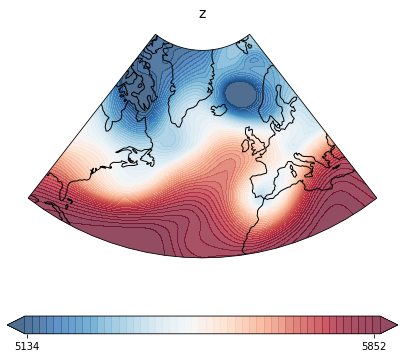

	func:'read_nc' took: 0.0888 sec
	func:'limit_geography' took: 52.8330 sec


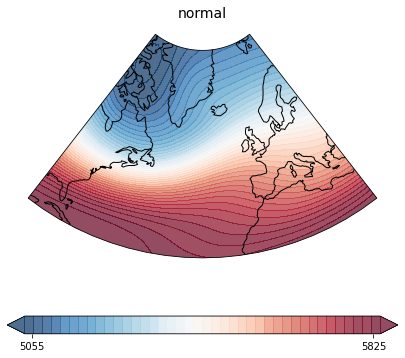

	func:'read_nc' took: 0.0957 sec
	func:'limit_geography' took: 55.4241 sec


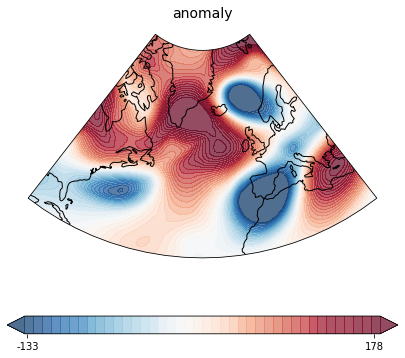

In [315]:
files = ['P:\CH\Weather Data\ERA-5\GEOPOTENTIAL\ERA-5_daily_Geopotential-500hPa_DecJanFeb_1979-2020.nc',
         'P:\CH\Weather Data\ERA-5\GEOPOTENTIAL\ERA-5_daily_Geopotential-500hPa_DecJanFeb_1979-2020_normal.nc',
         'P:\CH\Weather Data\ERA-5\GEOPOTENTIAL\ERA-5_daily_Geopotential-500hPa_DecJanFeb_1979-2020_anomaly.nc']
names = ["z", "normal", "anomaly"]
for filename, name in zip(files, names):
    dt = read_nc(filename)
    dt = limit_geography(dt,(20., 80.), (-90., 30.))
    if name == "z":
        dt /= G
    plot_gph(dt.sel(time="2021-01-10").to_array().squeeze(), title = name, savefig = PATH + "example_"+name+".png")

In [ ]:
gc.collect()
locations = {
    "Oslo":(59.91, 10.76),
    "Paris": (48.86, 2.35),
    "Rome": (41.89, 12.51)
}
plot_normal(dt, locations, savefig = True)

### Pre-processing

#### PCA reduction

In [10]:
pivot_anomaly = flat_table(dt)

	func:'flat_table' took: 2.8644 sec


In [25]:
reduced_anomaly = reduce_dim(pivot_anomaly, method='PCA', exp_variance = 0.5)

Number of days: 3850, Density of the grid: 4 cells
	func:'reduce_dim' took: 157.9811 sec


#### VAE reduction

In [11]:
reduced_anomaly = reduce_dim(dt, method='VAE', season = 'WINTER')

Processing batch 16Number of days: 3850, Density of the grid: 5 cells
	func:'reduce_dim' took: 958.5818 sec


### Temp

In [ ]:
pca = reduce_dim(pivot_anomaly.T, reshape = 'time', method='PCA', exp_variance = 0.99)
projection = ccrs.PlateCarree()
axes_class = (GeoAxes,dict(map_projection=projection))
fig = plt.figure(figsize=(15,15))
axs = AxesGrid(fig, 111, axes_class=axes_class,nrows_ncols=(2, 2),axes_pad=1, label_mode='')
for npca in range(4):
    plot_gph(pca[:, npca], reshape = True,#savefig='imgs/'+ scheme + '_pca_' + str(n_pca) + '.png',
             ax = axs[npca], title = 'PCA{}'.format(npca+1))

In [277]:
eofs, pcs = eofs(pivot_anomaly)

	func:'eofs' took: 201.5639 sec


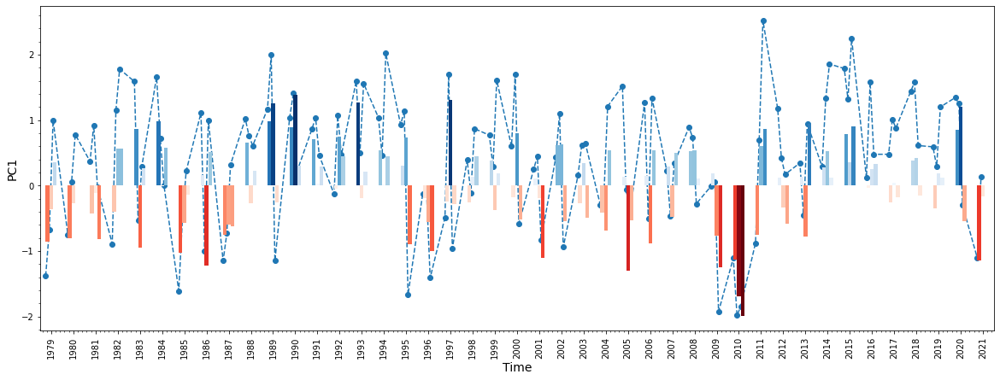

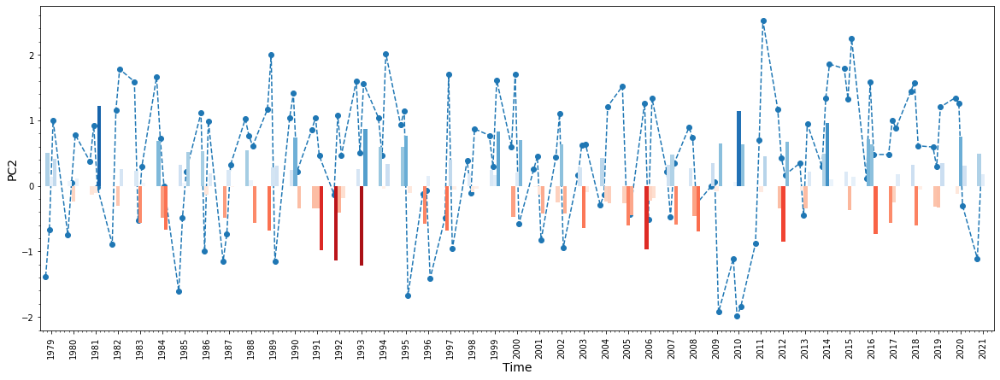

In [365]:
pcs_df = pd.DataFrame(data=pcs, columns=['PC{}'.format(i) for i in range(1, pcs.shape[1]+1)],
                      index = pivot_anomaly.time.values) #PCs are columns
pcs_df.to_csv("../files/pcs.csv", columns =['PC1','PC2'])
plot_PC(pcs_df, col_name = 'PC1', savefig = True)
plot_PC(pcs_df, col_name = 'PC2', savefig = True)

c:\python36\lib\site-packages\seaborn\_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

c:\python36\lib\site-packages\seaborn\_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

c:\python36\lib\site-packages\seaborn\_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



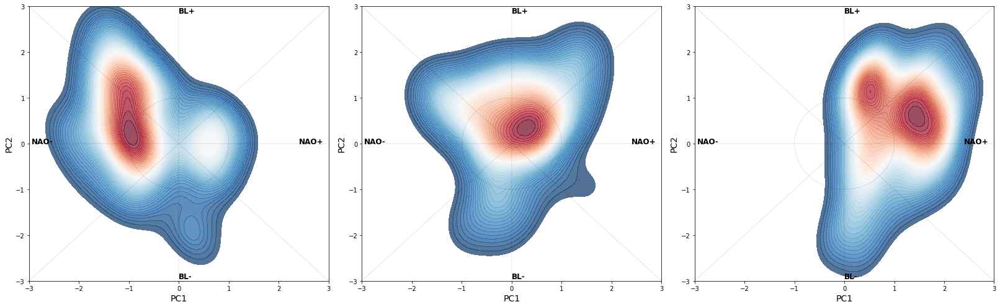

In [116]:
fig, axs = plt.subplots(1,3, figsize=(22.5,7))
plot_density("2021-01-01", "2021-02-28", pc1, pc2, ax = axs[0])
plot_density("1999-01-12", "1999-12-31", pc1, pc2, ax = axs[1])
plot_density("2020-01-01", "2020-02-29", pc1, pc2, ax = axs[2])
fig.tight_layout()
plt.show()

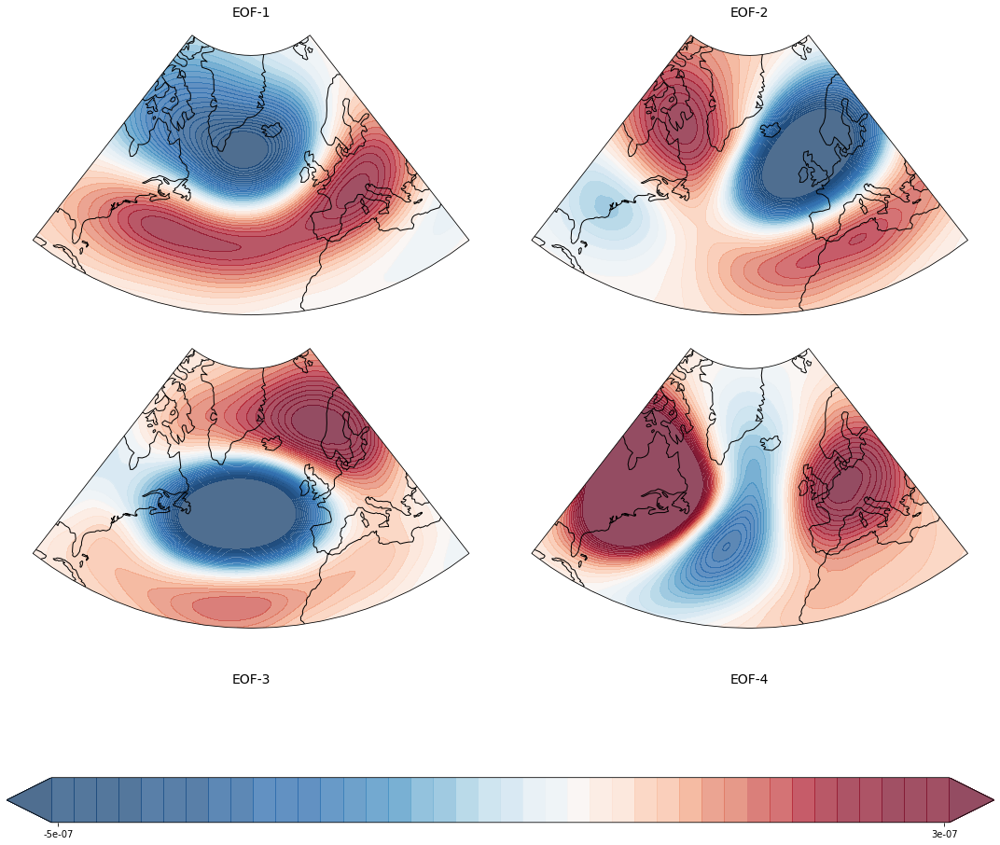

In [298]:
plot_EOFS(eofs, savefig = True)

###  Train, Validation

In [12]:
train_X, test_X, pivot_train, pivot_test = train_test_split(reduced_anomaly, pivot_anomaly, test_size = 0.2, random_state = 42)
train_X.shape, test_X.shape, pivot_train.shape, pivot_test.shape

((3080, 5), (770, 5), (3080, 115921), (770, 115921))

### K-Means

In [22]:
for scoring in ["score", "ch", "bic", "silhouette"]:
    estimator = cross_val(reduced_anomaly.values, method = "kmeans", scoring = scoring)

	Combination 1 score: -10382819328.000
	Combination 2 score: -10398912921.600
	Combination 3 score: -10398912921.600
	Combination 4 score: -10398591180.800
	Combination 5 score: -10398912716.800
	Combination 6 score: -10398912921.600
	Combination 7 score: -10382819123.200
	Combination 8 score: -10398912921.600
	Combination 9 score: -10398912921.600
	Combination 10 score: -10402679193.600
	Combination 11 score: -10401746329.600
	Combination 12 score: -10401746329.600
	Combination 13 score: -10402679193.600
	Combination 14 score: -10401746124.800
	Combination 15 score: -10401746329.600
	Combination 16 score: -10402679193.600
	Combination 17 score: -10401746534.400
	Combination 18 score: -10401746124.800
	Combination 19 score: -10396880691.200
	Combination 20 score: -10397655244.800
	Combination 21 score: -10397655859.200
	Combination 22 score: -10372700160.000
	Combination 23 score: -10397655654.400
	Combination 24 score: -10397655449.600
	Combination 25 score: -10396880896.000
	Combinat

	Combination 72 score: 192.076
	Combination 73 score: 183.301
	Combination 74 score: 183.346
	Combination 75 score: 183.346
	Combination 76 score: 183.301
	Combination 77 score: 183.346
	Combination 78 score: 183.346
	Combination 79 score: 183.301
	Combination 80 score: 183.346
	Combination 81 score: 183.346
	Combination 82 score: 183.532
	Combination 83 score: 183.564
	Combination 84 score: 183.564
	Combination 85 score: 183.532
	Combination 86 score: 183.564
	Combination 87 score: 183.564
	Combination 88 score: 183.532
	Combination 89 score: 183.564
	Combination 90 score: 183.564
	Combination 91 score: 183.450
	Combination 92 score: 183.655
	Combination 93 score: 183.386
	Combination 94 score: 183.429
	Combination 95 score: 183.380
	Combination 96 score: 183.386
	Combination 97 score: 183.429
	Combination 98 score: 183.380
	Combination 99 score: nan
	Combination 100 score: 183.684
	Combination 101 score: 183.551
	Combination 102 score: 183.486
	Combination 103 score: 183.684
	Combina

	Combination 12 score: 0.201
	Combination 13 score: 0.201
	Combination 14 score: 0.201
	Combination 15 score: 0.201
	Combination 16 score: 0.201
	Combination 17 score: 0.201
	Combination 18 score: 0.201
	Combination 19 score: 0.201
	Combination 20 score: 0.201
	Combination 21 score: 0.201
	Combination 22 score: 0.201
	Combination 23 score: 0.201
	Combination 24 score: 0.201
	Combination 25 score: 0.201
	Combination 26 score: 0.201
	Combination 27 score: 0.201
	Combination 28 score: 0.200
	Combination 29 score: 0.201
	Combination 30 score: 0.201
	Combination 31 score: 0.200
	Combination 32 score: 0.201
	Combination 33 score: 0.201
	Combination 34 score: 0.200
	Combination 35 score: 0.201
	Combination 36 score: 0.201
	Combination 37 score: 0.199
	Combination 38 score: 0.201
	Combination 39 score: 0.201
	Combination 40 score: 0.199
	Combination 41 score: 0.201
	Combination 42 score: 0.201
	Combination 43 score: 0.199
	Combination 44 score: 0.202
	Combination 45 score: 0.201
	Combination 4

In [418]:
estimator = load_estimator('../models/weighted/kmeans_model_bic.pkl')
labels, inertia, _ = extract_regimes(train_X, method='kmeans', nb_regimes = 8, estimator = estimator)

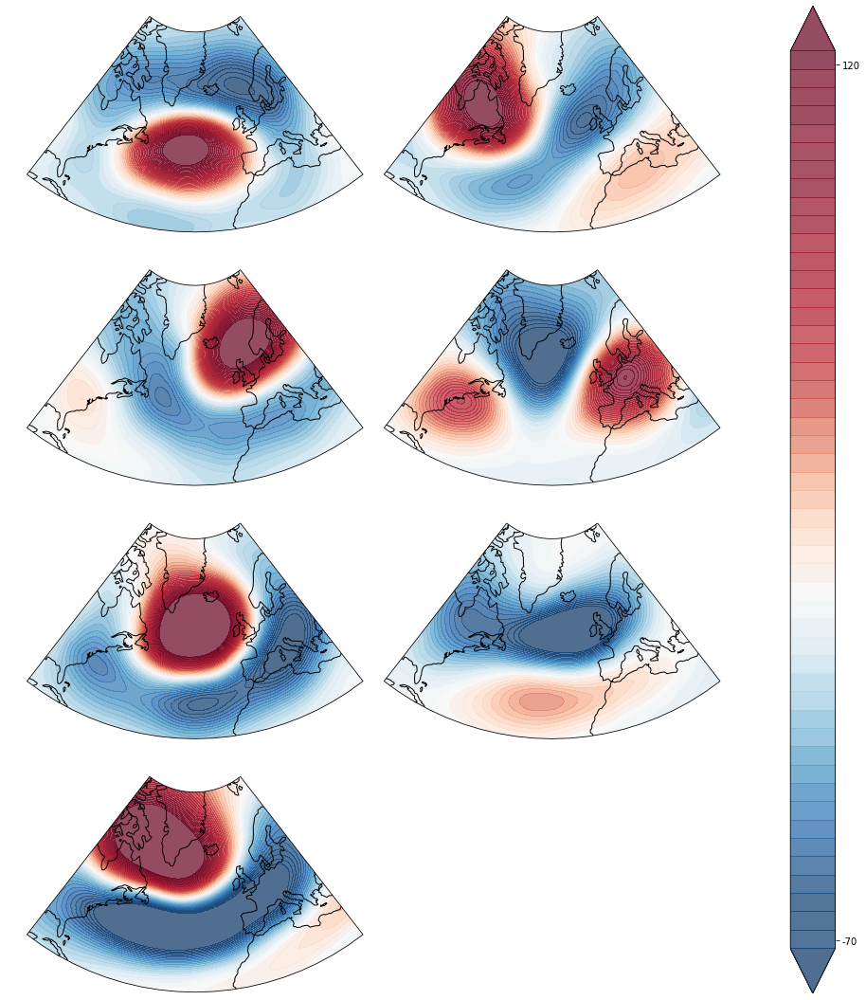

In [419]:
plot_regimes(pivot_train, labels, savefig='pca_kmeans7.png')

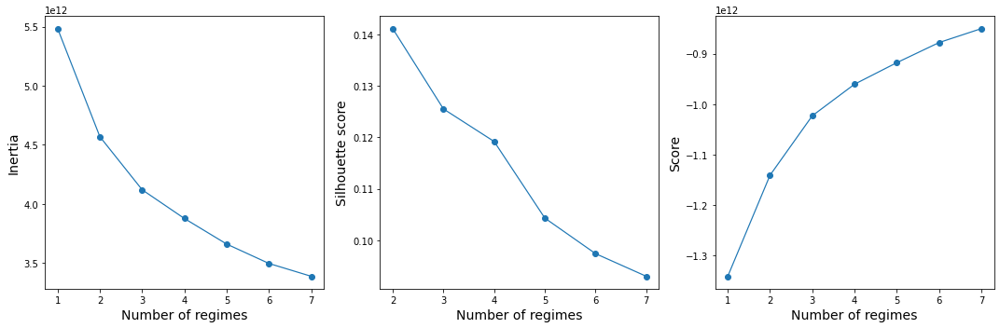

In [90]:
fig, axs = plt.subplots(1,3, figsize=(15,5))
plot_elbow(train_X, ax = axs[0])
plot_silhouette(train_X, test_X, ax = axs[1])
plot_score(train_X, test_X, ax = axs[2])
fig.tight_layout()
#plt.savefig('imgs/metrics_kmeans.png')
plt.show()

### Bayesian Gaussian Mixture Model

In [19]:
for scoring in  ["score", "ch", "bic", "silhouette"]:
    estimator = cross_val(reduced_anomaly.values, method = "bayesian_gmm", scoring = scoring)

	Combination 1 score: -29.358
	Combination 2 score: -29.153


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 3 score: -29.364
	Combination 4 score: -29.210
	Combination 5 score: -29.146


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check fo

	Combination 6 score: -29.150
	Combination 7 score: -29.151
	Combination 8 score: -29.258
	Combination 9 score: -29.255
	Combination 10 score: -29.282
	Combination 11 score: -29.533
	Combination 12 score: -29.667
	Combination 13 score: -29.381
	Combination 14 score: -29.426
	Combination 15 score: -29.560
	Combination 16 score: -29.468
	Combination 17 score: -29.170
	Combination 18 score: -29.272
	Combination 19 score: nan
	Combination 20 score: -29.241
	Combination 21 score: -29.321
	Combination 22 score: -29.222
	Combination 23 score: -29.539
	Combination 24 score: -29.193
	Combination 25 score: -29.418
	Combination 26 score: -29.289
	Combination 27 score: -29.360
	Combination 28 score: -29.665
	Combination 29 score: -29.306
	Combination 30 score: -29.189
	Combination 31 score: -29.567
	Combination 32 score: -29.571
	Combination 33 score: -29.286


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 34 score: -29.193


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 35 score: -29.090


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 36 score: nan
	Combination 37 score: -29.114
	Combination 38 score: -29.189
	Combination 39 score: -29.175


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 40 score: -29.163
	Combination 41 score: -29.162
	Combination 42 score: -29.492
	Combination 43 score: -30.437
	Combination 44 score: -29.667
	Combination 45 score: -29.257
	Combination 46 score: -29.204
	Combination 47 score: -29.616
	Combination 48 score: -29.444
	Combination 49 score: -29.156
	Combination 50 score: -29.202


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 51 score: -29.317
	Combination 52 score: -30.366
	Combination 53 score: -29.134
	Combination 54 score: -29.096
	Combination 55 score: -29.433
	Combination 56 score: -29.270
	Combination 57 score: -29.632
	Combination 58 score: -29.093
	Combination 59 score: -29.485
	Combination 60 score: -29.343
	Combination 61 score: -29.175
	Combination 62 score: -29.260
	Combination 63 score: -29.410
	Combination 64 score: -29.537
	Combination 65 score: -29.185


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 66 score: nan


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 67 score: -29.147


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 68 score: -29.062
	Combination 69 score: -29.081
	Combination 70 score: -29.262


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 71 score: -29.066
	Combination 72 score: -29.359
	Combination 73 score: -29.213
	Combination 74 score: -29.263
	Combination 75 score: -29.330
	Combination 76 score: -29.328
	Combination 77 score: -29.100
	Combination 78 score: -29.336
	Combination 79 score: -29.581
	Combination 80 score: -29.558
	Combination 81 score: nan
	Combination 82 score: nan
	Combination 83 score: nan
	Combination 84 score: nan


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 85 score: -29.061
	Combination 86 score: -29.208


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 87 score: -29.278
	Combination 88 score: -29.183
	Combination 89 score: nan
	Combination 90 score: nan
	Combination 91 score: nan
	Combination 92 score: nan
	Combination 93 score: -29.258
	Combination 94 score: -29.269
	Combination 95 score: nan
	Combination 96 score: -29.458


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 97 score: nan
	Combination 98 score: -29.299
	Combination 99 score: nan


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 100 score: nan
	Combination 101 score: -29.039
	Combination 102 score: -29.470
	Combination 103 score: -29.316


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 104 score: -29.148
	Combination 105 score: nan
	Combination 106 score: nan
	Combination 107 score: -29.399
	Combination 108 score: -29.448
	Combination 109 score: -29.140
	Combination 110 score: -30.034
	Combination 111 score: -29.244
	Combination 112 score: -29.294
	Combination 113 score: nan
	Combination 114 score: nan


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or che

	Combination 115 score: -29.036
	Combination 116 score: nan
	Combination 117 score: -29.074
	Combination 118 score: -29.553
	Combination 119 score: -29.232
	Combination 120 score: -29.392
	Combination 121 score: nan
	Combination 122 score: nan
	Combination 123 score: nan
	Combination 124 score: nan
	Combination 125 score: -29.284
	Combination 126 score: -29.237
	Combination 127 score: nan
	Combination 128 score: -29.766
Validation process ended with score -29.035732147658802
Best parameters: {'covariance_prior': None, 'covariance_type': 'full', 'degrees_of_freedom_prior': None, 'init_params': 'kmeans', 'max_iter': 100, 'mean_precision_prior': None, 'mean_prior': None, 'n_components': 7, 'n_init': 10, 'random_state': 42, 'reg_covar': 1e-06, 'tol': 1e-07, 'verbose': 0, 'verbose_interval': 10, 'warm_start': False, 'weight_concentration_prior': None, 'weight_concentration_prior_type': 'dirichlet_process'}
	func:'cross_val' took: 6535.8485 sec
	Combination 1 score: 144.545
	Combination 2 sc

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 3 score: 128.659
	Combination 4 score: 163.959
	Combination 5 score: 114.003
	Combination 6 score: 139.443
	Combination 7 score: nan
	Combination 8 score: 181.026
	Combination 9 score: 159.734
	Combination 10 score: nan
	Combination 11 score: nan
	Combination 12 score: nan
	Combination 13 score: 103.592
	Combination 14 score: nan
	Combination 15 score: nan
	Combination 16 score: nan
	Combination 17 score: 181.182
	Combination 18 score: 150.879
	Combination 19 score: nan
	Combination 20 score: 128.954
	Combination 21 score: 156.933
	Combination 22 score: 150.058
	Combination 23 score: 97.867
	Combination 24 score: 129.446
	Combination 25 score: 137.738
	Combination 26 score: 138.689
	Combination 27 score: nan
	Combination 28 score: nan
	Combination 29 score: 101.191
	Combination 30 score: 143.155
	Combination 31 score: nan
	Combination 32 score: nan
	Combination 33 score: nan
	Combination 34 score: 129.209


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check fo

	Combination 35 score: 143.036


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check fo

	Combination 36 score: 142.259
	Combination 37 score: 110.467
	Combination 38 score: 113.495


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check fo

	Combination 39 score: 128.790


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 40 score: 152.841
	Combination 41 score: 140.747
	Combination 42 score: 118.308
	Combination 43 score: nan
	Combination 44 score: nan
	Combination 45 score: 133.565
	Combination 46 score: 151.596
	Combination 47 score: nan
	Combination 48 score: nan
	Combination 49 score: 141.987
	Combination 50 score: 158.592
	Combination 51 score: 147.094
	Combination 52 score: 135.637
	Combination 53 score: 138.964
	Combination 54 score: nan
	Combination 55 score: 104.138


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or che

	Combination 56 score: 132.419
	Combination 57 score: nan
	Combination 58 score: nan
	Combination 59 score: nan
	Combination 60 score: nan
	Combination 61 score: nan
	Combination 62 score: 133.416
	Combination 63 score: 125.231
	Combination 64 score: nan
	Combination 65 score: 116.463
	Combination 66 score: nan


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 67 score: 143.663
	Combination 68 score: nan
	Combination 69 score: 111.929
	Combination 70 score: 109.716
	Combination 71 score: 131.373


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check fo

	Combination 72 score: 86.469
	Combination 73 score: 143.896
	Combination 74 score: nan
	Combination 75 score: nan
	Combination 76 score: nan
	Combination 77 score: 144.172
	Combination 78 score: nan
	Combination 79 score: nan
	Combination 80 score: nan
	Combination 81 score: nan
	Combination 82 score: 119.724


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 83 score: 152.630


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 84 score: nan
	Combination 85 score: 144.459
	Combination 86 score: 117.136
	Combination 87 score: 116.706


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 88 score: 135.094
	Combination 89 score: nan
	Combination 90 score: nan
	Combination 91 score: nan
	Combination 92 score: 115.957
	Combination 93 score: nan
	Combination 94 score: 125.891
	Combination 95 score: nan
	Combination 96 score: nan
	Combination 97 score: nan
	Combination 98 score: nan
	Combination 99 score: 123.310
	Combination 100 score: 108.560
	Combination 101 score: 103.473
	Combination 102 score: 131.825


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check fo

	Combination 103 score: 128.000


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check fo

	Combination 104 score: 154.102
	Combination 105 score: nan
	Combination 106 score: nan
	Combination 107 score: nan
	Combination 108 score: nan
	Combination 109 score: 149.672
	Combination 110 score: nan
	Combination 111 score: nan
	Combination 112 score: nan
	Combination 113 score: nan
	Combination 114 score: nan


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 115 score: nan


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or che

	Combination 116 score: 126.189
	Combination 117 score: 132.894
	Combination 118 score: 132.901


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or che

	Combination 119 score: 122.876
	Combination 120 score: 113.570
	Combination 121 score: nan
	Combination 122 score: nan
	Combination 123 score: nan
	Combination 124 score: nan
	Combination 125 score: 116.730
	Combination 126 score: 102.597
	Combination 127 score: nan
	Combination 128 score: nan
Validation process ended with score 181.18207359348676
Best parameters: {'covariance_prior': None, 'covariance_type': 'full', 'degrees_of_freedom_prior': None, 'init_params': 'kmeans', 'max_iter': 100, 'mean_precision_prior': None, 'mean_prior': None, 'n_components': 4, 'n_init': 10, 'random_state': 42, 'reg_covar': 1e-06, 'tol': 0.001, 'verbose': 0, 'verbose_interval': 10, 'warm_start': False, 'weight_concentration_prior': None, 'weight_concentration_prior_type': 'dirichlet_process'}
	func:'cross_val' took: 6648.7116 sec
	Combination 1 score: -25289.827
	Combination 2 score: -25206.788
	Combination 3 score: -25071.837
	Combination 4 score: -25397.567
	Combination 5 score: -25526.216
	Combinatio

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 7 score: -25165.467
	Combination 8 score: -25144.537
	Combination 9 score: -25135.340
	Combination 10 score: nan
	Combination 11 score: -24918.602
	Combination 12 score: -25274.375
	Combination 13 score: -25215.123
	Combination 14 score: -25528.330
	Combination 15 score: -25279.466
	Combination 16 score: -25310.071
	Combination 17 score: -25013.289
	Combination 18 score: -25337.797


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 19 score: -25395.957
	Combination 20 score: -24998.824
	Combination 21 score: -25537.632
	Combination 22 score: -25154.348
	Combination 23 score: -25093.907
	Combination 24 score: -25424.465
	Combination 25 score: -25410.449
	Combination 26 score: -25082.330
	Combination 27 score: -24961.290
	Combination 28 score: -25007.735
	Combination 29 score: -25093.895
	Combination 30 score: -25480.975
	Combination 31 score: -25301.371
	Combination 32 score: -25239.382
	Combination 33 score: -25355.144
	Combination 34 score: -25230.043
	Combination 35 score: -25459.394
	Combination 36 score: -25222.790
	Combination 37 score: -25232.993


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 38 score: -25682.243
	Combination 39 score: -25592.983


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 40 score: -25471.948
	Combination 41 score: -25074.090
	Combination 42 score: -25146.531
	Combination 43 score: -25112.907
	Combination 44 score: -24994.749
	Combination 45 score: -25220.781
	Combination 46 score: -25383.927
	Combination 47 score: -25201.582
	Combination 48 score: -25209.258
	Combination 49 score: -25437.739
	Combination 50 score: -25298.686
	Combination 51 score: -25054.839
	Combination 52 score: -25152.254
	Combination 53 score: -25153.330
	Combination 54 score: -25165.719


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 55 score: -25200.921


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 56 score: -25143.678
	Combination 57 score: -25528.271
	Combination 58 score: -25152.082
	Combination 59 score: -25198.949
	Combination 60 score: -24983.645
	Combination 61 score: -25136.913
	Combination 62 score: -25683.180
	Combination 63 score: -25349.539
	Combination 64 score: -25156.347
	Combination 65 score: nan
	Combination 66 score: nan


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 67 score: -25211.014
	Combination 68 score: -25360.339
	Combination 69 score: -25039.517
	Combination 70 score: -25274.921


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 71 score: -25210.392
	Combination 72 score: -25667.898
	Combination 73 score: nan
	Combination 74 score: nan
	Combination 75 score: -25602.877
	Combination 76 score: -25067.456
	Combination 77 score: -25228.503
	Combination 78 score: nan
	Combination 79 score: nan
	Combination 80 score: -25113.250
	Combination 81 score: nan
	Combination 82 score: nan


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or che

	Combination 83 score: -25239.764
	Combination 84 score: -25612.654


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 85 score: nan
	Combination 86 score: -25590.836
	Combination 87 score: -25569.913
	Combination 88 score: -25381.134
	Combination 89 score: nan
	Combination 90 score: -25246.475
	Combination 91 score: nan
	Combination 92 score: nan
	Combination 93 score: -25189.523
	Combination 94 score: -25229.655
	Combination 95 score: -25218.046
	Combination 96 score: -25076.037


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 97 score: -25773.968
	Combination 98 score: -25779.535


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check fo

	Combination 99 score: -26102.732
	Combination 100 score: -25590.957
	Combination 101 score: -25395.409
	Combination 102 score: -25655.620


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 103 score: -25208.387
	Combination 104 score: -25576.640
	Combination 105 score: nan
	Combination 106 score: nan
	Combination 107 score: nan
	Combination 108 score: nan
	Combination 109 score: -25268.690
	Combination 110 score: -25453.898
	Combination 111 score: -25688.916
	Combination 112 score: -25169.213


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 113 score: nan
	Combination 114 score: nan


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 115 score: -25441.453
	Combination 116 score: nan
	Combination 117 score: -25847.272
	Combination 118 score: -25295.882


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 119 score: -25846.947
	Combination 120 score: -25489.814
	Combination 121 score: nan
	Combination 122 score: nan
	Combination 123 score: -25301.214
	Combination 124 score: nan
	Combination 125 score: nan
	Combination 126 score: -25192.662
	Combination 127 score: nan
	Combination 128 score: nan
Validation process ended with score -24918.60210123862
Best parameters: {'covariance_prior': None, 'covariance_type': 'full', 'degrees_of_freedom_prior': None, 'init_params': 'kmeans', 'max_iter': 3000, 'mean_precision_prior': None, 'mean_prior': None, 'n_components': 4, 'n_init': 5, 'random_state': 42, 'reg_covar': 1e-06, 'tol': 1e-07, 'verbose': 0, 'verbose_interval': 10, 'warm_start': False, 'weight_concentration_prior': None, 'weight_concentration_prior_type': 'dirichlet_process'}
	func:'cross_val' took: 6893.4636 sec


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 1 score: 0.136
	Combination 2 score: 0.189


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 3 score: 0.176


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check fo

	Combination 4 score: 0.082
	Combination 5 score: 0.109
	Combination 6 score: 0.041


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 7 score: 0.107


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check fo

	Combination 8 score: 0.150
	Combination 9 score: 0.207
	Combination 10 score: 0.121
	Combination 11 score: nan
	Combination 12 score: nan
	Combination 13 score: nan
	Combination 14 score: nan
	Combination 15 score: nan
	Combination 16 score: nan
	Combination 17 score: 0.068
	Combination 18 score: 0.089
	Combination 19 score: 0.085
	Combination 20 score: 0.086
	Combination 21 score: 0.203
	Combination 22 score: nan


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or che

	Combination 23 score: 0.105
	Combination 24 score: 0.126
	Combination 25 score: nan
	Combination 26 score: 0.142
	Combination 27 score: nan
	Combination 28 score: nan
	Combination 29 score: nan
	Combination 30 score: nan
	Combination 31 score: nan
	Combination 32 score: nan
	Combination 33 score: 0.095
	Combination 34 score: 0.058


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 35 score: 0.095
	Combination 36 score: 0.088
	Combination 37 score: 0.019
	Combination 38 score: 0.162


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 39 score: -0.004


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 40 score: 0.081
	Combination 41 score: 0.103
	Combination 42 score: 0.140
	Combination 43 score: nan
	Combination 44 score: nan
	Combination 45 score: 0.085
	Combination 46 score: nan
	Combination 47 score: nan
	Combination 48 score: nan
	Combination 49 score: 0.113
	Combination 50 score: 0.180
	Combination 51 score: 0.127
	Combination 52 score: 0.069
	Combination 53 score: 0.125
	Combination 54 score: nan
	Combination 55 score: 0.153
	Combination 56 score: 0.094
	Combination 57 score: 0.129
	Combination 58 score: nan
	Combination 59 score: nan
	Combination 60 score: nan
	Combination 61 score: nan
	Combination 62 score: 0.133
	Combination 63 score: nan
	Combination 64 score: nan


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 65 score: 0.103
	Combination 66 score: 0.120
	Combination 67 score: 0.126


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 68 score: nan
	Combination 69 score: 0.104
	Combination 70 score: 0.049


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check fo

	Combination 71 score: 0.088


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check fo

	Combination 72 score: 0.112
	Combination 73 score: 0.105
	Combination 74 score: 0.120
	Combination 75 score: 0.109
	Combination 76 score: nan
	Combination 77 score: 0.138
	Combination 78 score: 0.017
	Combination 79 score: nan
	Combination 80 score: nan


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 81 score: nan
	Combination 82 score: 0.099


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 83 score: nan
	Combination 84 score: nan
	Combination 85 score: 0.108
	Combination 86 score: 0.109


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 87 score: 0.104


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or che

	Combination 88 score: 0.125
	Combination 89 score: nan
	Combination 90 score: nan
	Combination 91 score: nan
	Combination 92 score: nan
	Combination 93 score: 0.096
	Combination 94 score: 0.023
	Combination 95 score: nan
	Combination 96 score: nan
	Combination 97 score: nan


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 98 score: 0.087


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check fo

	Combination 99 score: 0.117
	Combination 100 score: 0.109
	Combination 101 score: 0.050
	Combination 102 score: 0.096


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 103 score: 0.131


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check fo

	Combination 104 score: 0.096
	Combination 105 score: 0.088
	Combination 106 score: nan
	Combination 107 score: nan
	Combination 108 score: nan
	Combination 109 score: 0.107
	Combination 110 score: 0.053
	Combination 111 score: nan
	Combination 112 score: nan
	Combination 113 score: 0.109
	Combination 114 score: nan


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or che

	Combination 115 score: 0.049
	Combination 116 score: nan
	Combination 117 score: 0.106
	Combination 118 score: 0.040


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or che

	Combination 119 score: 0.073
	Combination 120 score: -0.007
	Combination 121 score: nan
	Combination 122 score: nan
	Combination 123 score: nan
	Combination 124 score: nan
	Combination 125 score: 0.126
	Combination 126 score: 0.078
	Combination 127 score: nan
	Combination 128 score: nan
Validation process ended with score 0.20682160556316376
Best parameters: {'covariance_prior': None, 'covariance_type': 'full', 'degrees_of_freedom_prior': None, 'init_params': 'kmeans', 'max_iter': 3000, 'mean_precision_prior': None, 'mean_prior': None, 'n_components': 4, 'n_init': 5, 'random_state': 42, 'reg_covar': 1e-06, 'tol': 0.001, 'verbose': 0, 'verbose_interval': 10, 'warm_start': False, 'weight_concentration_prior': None, 'weight_concentration_prior_type': 'dirichlet_process'}
	func:'cross_val' took: 6943.2179 sec


In [15]:
estimator = load_estimator("../models/WINTER/vae/bayesian_gmm_model_silhouette.pkl")
probas, elbo, means, covariances, _ = extract_regimes(reduced_anomaly, method='bayesian_gmm', nb_regimes = 6, estimator = estimator)
labels = np.argmax(probas, axis=1)

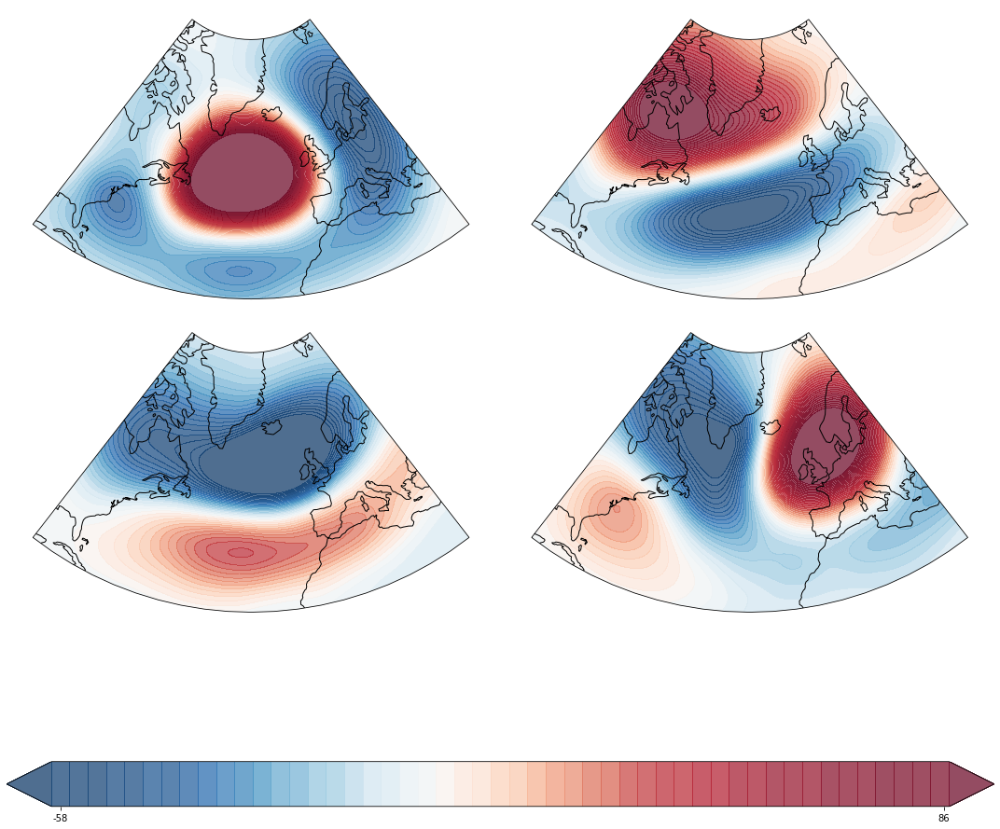

In [16]:
plot_regimes(pivot_anomaly, labels)#, savefig='pca_bayesgmm7.png')

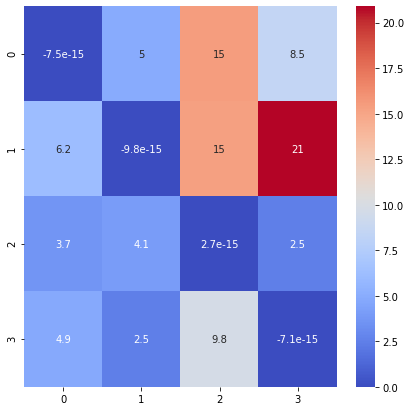

In [17]:
plot_KL(means, covariances)

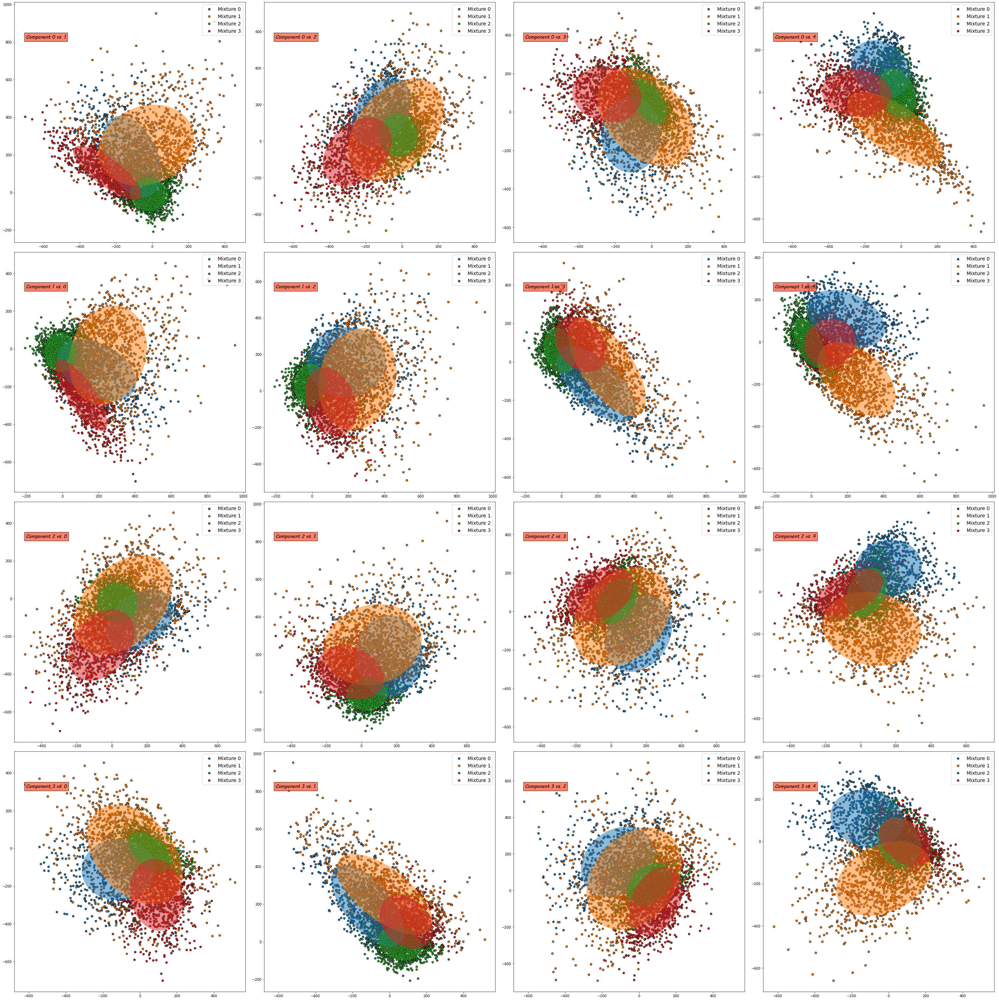

In [65]:
plot_mixtures(reduced_anomaly.values, labels, means, covariances)

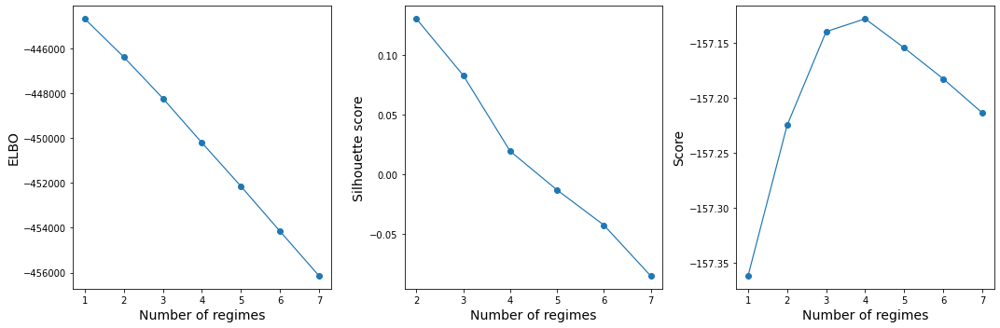

In [95]:
fig, axs = plt.subplots(1,3, figsize=(15,5))
plot_elbo(train_X, ax = axs[0])
plot_silhouette(train_X, test_X, method = 'bayesian_gmm', ax = axs[1])
plot_score(train_X, test_X, method = "bayesian_gmm", ax = axs[2])
fig.tight_layout()
plt.savefig("imgs/metrics_bayesgmm.png")
plt.show()

### Gaussian Mixture

In [20]:
for scoring in ["score", "ch", "bic", "silhouette"]:
    estimator = cross_val(reduced_anomaly.values, method = "gmm", scoring = scoring)

	Combination 1 score: nan
	Combination 2 score: -29.142


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 3 score: -29.135
	Combination 4 score: -29.135
	Combination 5 score: -29.145


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 6 score: -29.133
	Combination 7 score: -29.134
	Combination 8 score: -29.132
	Combination 9 score: -29.135
	Combination 10 score: -29.133
	Combination 11 score: -29.133
	Combination 12 score: -29.138
	Combination 13 score: -29.133
	Combination 14 score: -29.136
	Combination 15 score: -29.137
	Combination 16 score: -29.134
	Combination 17 score: -29.135
	Combination 18 score: -29.135
	Combination 19 score: -29.134
	Combination 20 score: -29.138
	Combination 21 score: -29.134
	Combination 22 score: -29.134
	Combination 23 score: -29.133
	Combination 24 score: -29.133
	Combination 25 score: -29.134
	Combination 26 score: -29.136
	Combination 27 score: -29.131
	Combination 28 score: -29.134
	Combination 29 score: -29.134
	Combination 30 score: -29.133
	Combination 31 score: -29.134
	Combination 32 score: -29.137
	Combination 33 score: -29.133
	Combination 34 score: -29.135
	Combination 35 score: -29.135
	Combination 36 score: -29.135
	Combination 37 score: -29.134
	Combination

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 39 score: -29.134
	Combination 40 score: -29.135
	Combination 41 score: -29.136
	Combination 42 score: -29.134
	Combination 43 score: -29.134
	Combination 44 score: -29.135
	Combination 45 score: -29.133
	Combination 46 score: -29.135
	Combination 47 score: -29.143
	Combination 48 score: -29.133
	Combination 49 score: -29.134
	Combination 50 score: -29.137
	Combination 51 score: -29.143
	Combination 52 score: -29.134
	Combination 53 score: -29.135
	Combination 54 score: -29.132
	Combination 55 score: -29.134
	Combination 56 score: -29.137
	Combination 57 score: -29.134
	Combination 58 score: -29.140
	Combination 59 score: -29.137
	Combination 60 score: -29.136
	Combination 61 score: -29.134
	Combination 62 score: -29.137
	Combination 63 score: -29.133
	Combination 64 score: -29.136
	Combination 65 score: -29.135
	Combination 66 score: -29.134
	Combination 67 score: -29.134
	Combination 68 score: -29.135
	Combination 69 score: -29.134
	Combination 70 score: -29.133
	Combina

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 129 score: -29.134
	Combination 130 score: -29.134
	Combination 131 score: -29.137
	Combination 132 score: -29.131
	Combination 133 score: -29.133
	Combination 134 score: -29.134
	Combination 135 score: -29.133
	Combination 136 score: -29.135
	Combination 137 score: -29.134
	Combination 138 score: -29.140
	Combination 139 score: -29.139
	Combination 140 score: -29.141
	Combination 141 score: -29.137
	Combination 142 score: -29.135
	Combination 143 score: -29.139
	Combination 144 score: -29.133
Validation process ended with score -29.128956701653948
Best parameters: {'covariance_type': 'full', 'init_params': 'random', 'max_iter': 300, 'means_init': None, 'n_components': 6, 'n_init': 5, 'precisions_init': None, 'random_state': 42, 'reg_covar': 1e-06, 'tol': 1e-07, 'verbose': 0, 'verbose_interval': 10, 'warm_start': True, 'weights_init': None}
	func:'cross_val' took: 171.4556 sec
	Combination 1 score: nan
	Combination 2 score: 198.540
	Combination 3 score: 165.906
	Combinatio

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 6 score: 132.411
	Combination 7 score: 133.571
	Combination 8 score: 132.315
	Combination 9 score: 133.715
	Combination 10 score: 131.939
	Combination 11 score: 131.174
	Combination 12 score: 131.672
	Combination 13 score: 129.821
	Combination 14 score: 132.594
	Combination 15 score: 130.349
	Combination 16 score: 132.166
	Combination 17 score: 132.721
	Combination 18 score: 131.884
	Combination 19 score: 130.907
	Combination 20 score: 130.356


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 21 score: 134.029
	Combination 22 score: 133.480
	Combination 23 score: 130.662
	Combination 24 score: 131.518
	Combination 25 score: 130.605
	Combination 26 score: 130.319
	Combination 27 score: 134.030
	Combination 28 score: 134.299
	Combination 29 score: 134.556
	Combination 30 score: 133.171
	Combination 31 score: 133.006
	Combination 32 score: 134.148
	Combination 33 score: 134.546
	Combination 34 score: 134.008
	Combination 35 score: 133.700
	Combination 36 score: 135.224
	Combination 37 score: 134.944
	Combination 38 score: 132.638


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 39 score: 131.911
	Combination 40 score: 133.005
	Combination 41 score: 130.409
	Combination 42 score: 131.595
	Combination 43 score: 132.314
	Combination 44 score: 131.999
	Combination 45 score: 133.422
	Combination 46 score: 132.898
	Combination 47 score: 134.205
	Combination 48 score: 133.532
	Combination 49 score: 130.272
	Combination 50 score: 130.681
	Combination 51 score: 130.987
	Combination 52 score: 132.190
	Combination 53 score: 132.130
	Combination 54 score: 130.435
	Combination 55 score: 132.822
	Combination 56 score: 132.729


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 57 score: 131.410
	Combination 58 score: 131.796
	Combination 59 score: 131.269
	Combination 60 score: 131.402
	Combination 61 score: 131.339
	Combination 62 score: 130.903
	Combination 63 score: 133.821
	Combination 64 score: 133.868
	Combination 65 score: 131.079
	Combination 66 score: 130.673
	Combination 67 score: 132.223
	Combination 68 score: 131.740
	Combination 69 score: 131.699
	Combination 70 score: 133.307
	Combination 71 score: 131.515
	Combination 72 score: 132.134
	Combination 73 score: 129.591
	Combination 74 score: 132.582


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 75 score: 133.283
	Combination 76 score: 131.298
	Combination 77 score: 130.750
	Combination 78 score: 131.726
	Combination 79 score: 133.741
	Combination 80 score: 130.903
	Combination 81 score: 131.744
	Combination 82 score: 132.056
	Combination 83 score: 133.720
	Combination 84 score: 131.041
	Combination 85 score: 132.635
	Combination 86 score: 132.160
	Combination 87 score: 130.677
	Combination 88 score: 133.243
	Combination 89 score: 133.206
	Combination 90 score: 130.682
	Combination 91 score: 130.490
	Combination 92 score: 132.007
	Combination 93 score: 134.253
	Combination 94 score: 132.238
	Combination 95 score: 133.930


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 96 score: 131.450
	Combination 97 score: 131.995
	Combination 98 score: 130.971
	Combination 99 score: 132.235
	Combination 100 score: 132.685
	Combination 101 score: 134.684
	Combination 102 score: 134.389
	Combination 103 score: 134.594
	Combination 104 score: 131.860
	Combination 105 score: 130.675
	Combination 106 score: 131.698
	Combination 107 score: 133.016
	Combination 108 score: 132.575
	Combination 109 score: 133.673
	Combination 110 score: 131.703
	Combination 111 score: 132.404
	Combination 112 score: 131.332
	Combination 113 score: 131.073


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 114 score: 129.984
	Combination 115 score: 131.318
	Combination 116 score: 131.738
	Combination 117 score: 134.822
	Combination 118 score: 133.990
	Combination 119 score: 132.882
	Combination 120 score: 130.388
	Combination 121 score: 131.681
	Combination 122 score: 131.109
	Combination 123 score: 133.785
	Combination 124 score: 134.220
	Combination 125 score: 131.459
	Combination 126 score: 132.246
	Combination 127 score: 134.082
	Combination 128 score: 130.938


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 129 score: 131.508
	Combination 130 score: 130.568
	Combination 131 score: 132.873


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 132 score: 132.367
	Combination 133 score: 130.253
	Combination 134 score: 132.092
	Combination 135 score: 132.192
	Combination 136 score: 130.939
	Combination 137 score: 135.867


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 138 score: 131.634
	Combination 139 score: 132.784
	Combination 140 score: 131.536
	Combination 141 score: 132.433
	Combination 142 score: 134.309
	Combination 143 score: 136.822
	Combination 144 score: 132.809
Validation process ended with score 198.53968819391082
Best parameters: {'covariance_type': 'full', 'init_params': 'kmeans', 'max_iter': 100, 'means_init': None, 'n_components': 4, 'n_init': 5, 'precisions_init': None, 'random_state': 42, 'reg_covar': 1e-06, 'tol': 1e-05, 'verbose': 0, 'verbose_interval': 10, 'warm_start': True, 'weights_init': None}
	func:'cross_val' took: 241.2254 sec
	Combination 1 score: nan
	Combination 2 score: -45453.664
	Combination 3 score: -45444.407
	Combination 4 score: -45420.882
	Combination 5 score: -45422.421
	Combination 6 score: -45419.322
	Combination 7 score: -45422.436
	Combination 8 score: -45425.201
	Combination 9 score: -45431.115
	Combination 10 score: -45422.577
	Combination 11 score: -45422.192
	Combination 12 score: -4541

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 21 score: -45411.988
	Combination 22 score: -45419.508
	Combination 23 score: -45414.879


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 24 score: -45416.920
	Combination 25 score: -45428.585
	Combination 26 score: -45418.449
	Combination 27 score: -45416.123
	Combination 28 score: -45417.747
	Combination 29 score: -45418.497
	Combination 30 score: -45417.993
	Combination 31 score: -45418.810
	Combination 32 score: -45419.541
	Combination 33 score: -45414.757
	Combination 34 score: -45415.120
	Combination 35 score: -45412.991
	Combination 36 score: -45418.510
	Combination 37 score: -45557.500
	Combination 38 score: -45565.646
	Combination 39 score: -45557.110
	Combination 40 score: -45558.021
	Combination 41 score: -45556.278


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 42 score: -45556.636
	Combination 43 score: -45554.708
	Combination 44 score: -45559.200
	Combination 45 score: -45555.410
	Combination 46 score: -45556.097
	Combination 47 score: -45557.496
	Combination 48 score: -45557.914
	Combination 49 score: -45557.712
	Combination 50 score: -45555.476
	Combination 51 score: -45557.438
	Combination 52 score: -45559.308
	Combination 53 score: -45557.334
	Combination 54 score: -45553.506
	Combination 55 score: -45551.958
	Combination 56 score: -45556.984


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check fo

	Combination 57 score: -45554.169
	Combination 58 score: -45557.997
	Combination 59 score: -45570.801


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 60 score: -45553.688
	Combination 61 score: -45554.798
	Combination 62 score: -45564.874
	Combination 63 score: -45556.075
	Combination 64 score: -45557.066
	Combination 65 score: -45554.579
	Combination 66 score: -45557.369
	Combination 67 score: -45556.238
	Combination 68 score: -45556.820
	Combination 69 score: -45573.028
	Combination 70 score: -45558.504
	Combination 71 score: -45553.295
	Combination 72 score: -45556.600
	Combination 73 score: -45695.087
	Combination 74 score: -45693.583
	Combination 75 score: -45693.926
	Combination 76 score: -45695.979
	Combination 77 score: -45693.295
	Combination 78 score: -45703.394
	Combination 79 score: -45696.473
	Combination 80 score: -45696.612
	Combination 81 score: -45695.630
	Combination 82 score: -45693.719
	Combination 83 score: -45694.633
	Combination 84 score: -45695.782
	Combination 85 score: -45698.009
	Combination 86 score: -45699.603
	Combination 87 score: -45697.767
	Combination 88 score: -45696.284
	Combination 8

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 96 score: -45695.350
	Combination 97 score: -45697.060
	Combination 98 score: -45695.302
	Combination 99 score: -45692.547
	Combination 100 score: -45697.331
	Combination 101 score: -45694.530
	Combination 102 score: -45695.441
	Combination 103 score: -45700.079
	Combination 104 score: -45695.521
	Combination 105 score: -45703.952
	Combination 106 score: -45696.012
	Combination 107 score: -45699.177
	Combination 108 score: -45695.335
	Combination 109 score: -45840.277
	Combination 110 score: -45835.862
	Combination 111 score: -45840.221
	Combination 112 score: -45835.544
	Combination 113 score: -45833.846
	Combination 114 score: -45834.932
	Combination 115 score: -45834.074
	Combination 116 score: -45837.405
	Combination 117 score: -45835.356
	Combination 118 score: -45832.653
	Combination 119 score: -45835.127
	Combination 120 score: -45836.513
	Combination 121 score: -45838.194
	Combination 122 score: -45830.716
	Combination 123 score: -45838.418
	Combination 124 score: 

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check fo

	Combination 132 score: -45836.231
	Combination 133 score: -45837.506
	Combination 134 score: -45837.030
	Combination 135 score: -45833.048
	Combination 136 score: -45837.949
	Combination 137 score: -45833.650
	Combination 138 score: -45836.016
	Combination 139 score: -45832.161
	Combination 140 score: -45836.977
	Combination 141 score: -45838.345
	Combination 142 score: -45834.674
	Combination 143 score: -45831.864
	Combination 144 score: -45838.245
Validation process ended with score -45411.98780793016
Best parameters: {'covariance_type': 'full', 'init_params': 'kmeans', 'max_iter': 100, 'means_init': None, 'n_components': 4, 'n_init': 10, 'precisions_init': None, 'random_state': 42, 'reg_covar': 1e-06, 'tol': 1e-07, 'verbose': 0, 'verbose_interval': 10, 'warm_start': True, 'weights_init': None}
	func:'cross_val' took: 238.8926 sec
	Combination 1 score: nan
	Combination 2 score: 0.212


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 3 score: 0.144
	Combination 4 score: 0.144
	Combination 5 score: 0.140


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 6 score: 0.143
	Combination 7 score: 0.144
	Combination 8 score: 0.143


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check fo

	Combination 9 score: 0.141
	Combination 10 score: 0.141
	Combination 11 score: 0.142
	Combination 12 score: 0.141
	Combination 13 score: 0.142
	Combination 14 score: 0.140
	Combination 15 score: 0.146
	Combination 16 score: 0.147
	Combination 17 score: 0.148
	Combination 18 score: 0.143
	Combination 19 score: 0.144
	Combination 20 score: 0.143
	Combination 21 score: 0.144
	Combination 22 score: 0.145
	Combination 23 score: 0.145
	Combination 24 score: 0.143
	Combination 25 score: 0.140
	Combination 26 score: 0.141
	Combination 27 score: 0.146
	Combination 28 score: 0.147
	Combination 29 score: 0.139
	Combination 30 score: 0.143
	Combination 31 score: 0.140
	Combination 32 score: 0.142
	Combination 33 score: 0.137
	Combination 34 score: 0.138
	Combination 35 score: 0.139
	Combination 36 score: 0.143
	Combination 37 score: 0.143
	Combination 38 score: 0.146


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 39 score: 0.143
	Combination 40 score: 0.140
	Combination 41 score: 0.146


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 42 score: 0.141
	Combination 43 score: 0.144
	Combination 44 score: 0.140
	Combination 45 score: 0.145
	Combination 46 score: 0.145
	Combination 47 score: 0.139
	Combination 48 score: 0.143
	Combination 49 score: 0.145
	Combination 50 score: 0.142
	Combination 51 score: 0.140
	Combination 52 score: 0.143
	Combination 53 score: 0.145
	Combination 54 score: 0.139
	Combination 55 score: 0.135
	Combination 56 score: 0.141
	Combination 57 score: 0.142
	Combination 58 score: 0.143
	Combination 59 score: 0.137
	Combination 60 score: 0.143
	Combination 61 score: 0.144
	Combination 62 score: 0.142
	Combination 63 score: 0.139
	Combination 64 score: 0.140
	Combination 65 score: 0.145
	Combination 66 score: 0.143
	Combination 67 score: 0.148
	Combination 68 score: 0.143
	Combination 69 score: 0.141
	Combination 70 score: 0.138
	Combination 71 score: 0.137
	Combination 72 score: 0.142
	Combination 73 score: 0.148
	Combination 74 score: 0.141
	Combination 75 score: 0.142
	Combination 7

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 78 score: 0.144
	Combination 79 score: 0.142
	Combination 80 score: 0.144


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 81 score: 0.138
	Combination 82 score: 0.141
	Combination 83 score: 0.143
	Combination 84 score: 0.143
	Combination 85 score: 0.143
	Combination 86 score: 0.142
	Combination 87 score: 0.145
	Combination 88 score: 0.148
	Combination 89 score: 0.142
	Combination 90 score: 0.139
	Combination 91 score: 0.135
	Combination 92 score: 0.141


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 93 score: 0.139
	Combination 94 score: 0.139
	Combination 95 score: 0.142


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check fo

	Combination 96 score: 0.140
	Combination 97 score: 0.140
	Combination 98 score: 0.141
	Combination 99 score: 0.140
	Combination 100 score: 0.147
	Combination 101 score: 0.139
	Combination 102 score: 0.138
	Combination 103 score: 0.138
	Combination 104 score: 0.139
	Combination 105 score: 0.141
	Combination 106 score: 0.145
	Combination 107 score: 0.140
	Combination 108 score: 0.140
	Combination 109 score: 0.135
	Combination 110 score: 0.145


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check fo

	Combination 111 score: 0.141
	Combination 112 score: 0.140
	Combination 113 score: 0.137
	Combination 114 score: 0.146
	Combination 115 score: 0.145
	Combination 116 score: 0.141
	Combination 117 score: 0.143
	Combination 118 score: 0.141
	Combination 119 score: 0.141
	Combination 120 score: 0.146
	Combination 121 score: 0.145
	Combination 122 score: 0.142
	Combination 123 score: 0.145
	Combination 124 score: 0.146
	Combination 125 score: 0.144
	Combination 126 score: 0.143
	Combination 127 score: 0.140
	Combination 128 score: 0.145


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 129 score: 0.143
	Combination 130 score: 0.145
	Combination 131 score: 0.142


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 132 score: 0.144
	Combination 133 score: 0.140
	Combination 134 score: 0.145
	Combination 135 score: 0.139
	Combination 136 score: 0.141
	Combination 137 score: 0.140


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check fo

	Combination 138 score: 0.140
	Combination 139 score: 0.142
	Combination 140 score: 0.142
	Combination 141 score: 0.141
	Combination 142 score: 0.138
	Combination 143 score: 0.138
	Combination 144 score: 0.139
Validation process ended with score 0.2116711139678955
Best parameters: {'covariance_type': 'full', 'init_params': 'kmeans', 'max_iter': 100, 'means_init': None, 'n_components': 4, 'n_init': 5, 'precisions_init': None, 'random_state': 42, 'reg_covar': 1e-06, 'tol': 1e-05, 'verbose': 0, 'verbose_interval': 10, 'warm_start': True, 'weights_init': None}
	func:'cross_val' took: 362.2953 sec


In [18]:
estimator = load_estimator("../models/WINTER/vae/gmm_model_ch.pkl")
probas, elbo, means, covariances, _ = extract_regimes(reduced_anomaly, method='gmm', nb_regimes = 5, estimator = estimator)
labels = np.argmax(probas, axis=1)

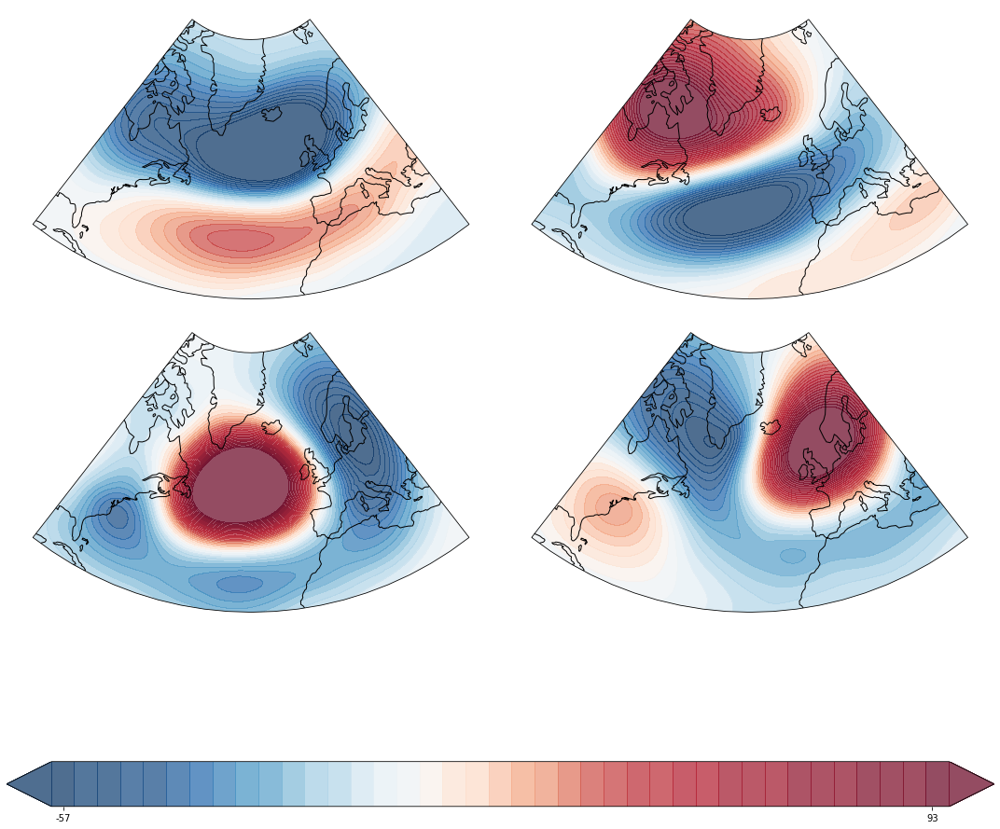

In [19]:
plot_regimes(pivot_anomaly, labels)#, savefig='vae_gmm6.png')

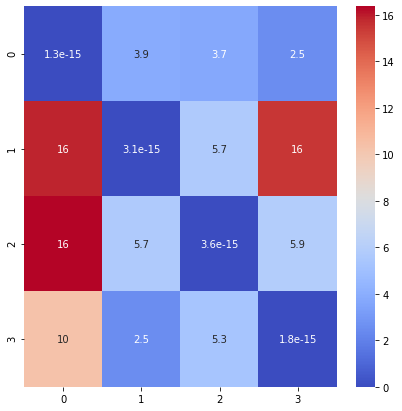

In [20]:
plot_KL(means, covariances)

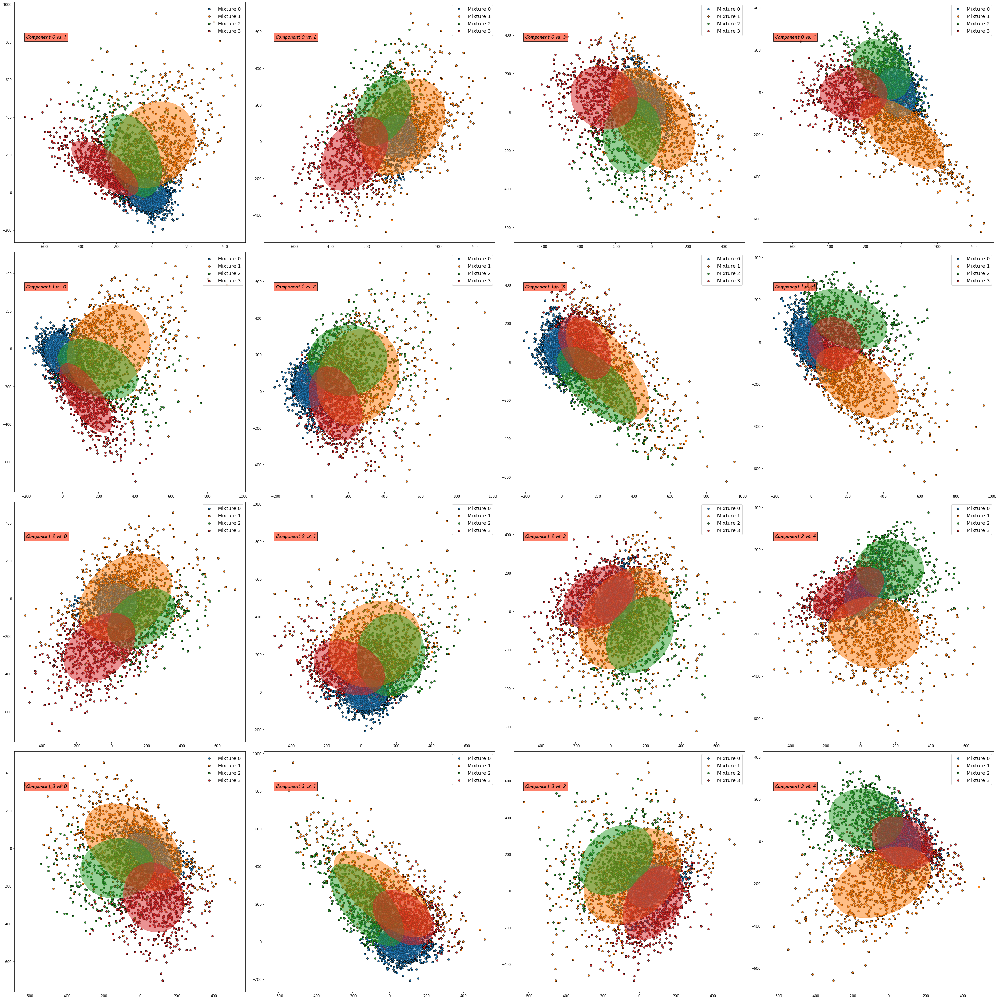

In [372]:
plot_mixtures(train_X, labels, means, covariances)

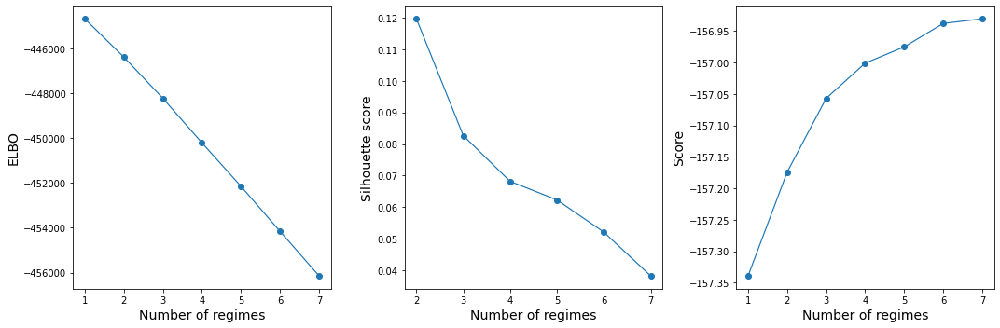

In [97]:
fig, axs = plt.subplots(1,3, figsize=(15,5))
plot_elbo(train_X, ax = axs[0])
plot_silhouette(train_X, test_X, method = 'gmm', ax = axs[1])
plot_score(train_X, test_X, method = "gmm", ax = axs[2])
fig.tight_layout()
plt.savefig("imgs/metrics_gmm.png")
plt.show()

### Spectral Clustering

In [ ]:
estimator = cross_val(reduced_anomaly.values, method = "spectral", scoring = "score")

In [42]:
labels, affinity_matrix, _ = extract_regimes(train_X, method='spectral', nb_regimes = 5, affinity = 'nearest_neighbors')

In [ ]:
cm = sns.light_palette("green", as_cmap = True)
affinity_df = pd.DataFrame(affinity_matrix.todense() if scipy.sparse.issparse(affinity_matrix) else affinity_matrix,
                           index = clustered_anomaly.index, columns = clustered_anomaly.index)
affinity_df.style.background_gradient(cmap = cm)

In [48]:
len(affinity_df.index.unique()), len(affinity_df.index)

(3850, 3854)

### Models Comparison

In [115]:
pd.DataFrame.from_dict({model:performance_matrix('./models/WINTER/pca/'+ model, train_X.values, test_X.values)\
                        for model in os.listdir('./models/WINTER/pca') if model.endswith('pkl')},
             orient='index')

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



,Number of Clusters,BIC,Silhouette Score,Calinski Harabsz Index,Inertia
bayesian_gmm_model_bic.pkl,4,-119919.810139,0.059468,62.749424,5.772092e+11
bayesian_gmm_model_ch.pkl,5,-120020.179410,0.038909,52.871419,5.642173e+11
bayesian_gmm_model_score.pkl,6,-120151.252941,-0.008261,35.920319,5.837918e+11
bayesian_gmm_model_silhouette.pkl,7,-120225.846898,-0.023419,31.809483,5.781376e+11
gmm_model_bic.pkl,4,-119926.737366,0.067338,66.841349,5.703133e+11
gmm_model_ch.pkl,7,-119928.221464,0.066433,67.143741,5.696659e+11
gmm_model_score.pkl,5,-119964.654635,0.070058,65.278581,5.740716e+11
gmm_model_silhouette.pkl,4,-119935.136895,0.076415,67.398456,5.710571e+11
kmeans_model_bic.pkl,7,-119439.083897,0.091466,68.118968,4.713471e+11
kmeans_model_ch.pkl,4,-119503.312630,0.112515,93.448347,5.272494e+11


In [29]:
pd.DataFrame.from_dict({model:performance_matrix('../models/WINTER/vae/'+ model, train_X.values, test_X.values)\
                        for model in os.listdir('../models/WINTER/vae/') if model.endswith('pkl')},
             orient='index')

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check 

,Number of Clusters,BIC,Silhouette Score,Calinski Harabsz Index,Inertia
bayesian_gmm_model_bic.pkl,4,-22401.220411,0.047083,89.998378,1.126815e+07
bayesian_gmm_model_ch.pkl,4,-22393.035334,0.110841,115.095573,1.053061e+07
bayesian_gmm_model_score.pkl,7,-22528.052632,0.017283,78.530560,9.569359e+06
bayesian_gmm_model_silhouette.pkl,4,-22401.948990,0.047083,89.998378,1.127229e+07
gmm_model_bic.pkl,4,-22329.851714,0.124213,119.898616,1.043126e+07
gmm_model_ch.pkl,4,-22317.104262,0.132368,114.745473,1.053610e+07
gmm_model_score.pkl,6,-22415.979544,0.053992,91.526597,1.122853e+07
gmm_model_silhouette.pkl,4,-22318.907157,0.133580,113.702126,1.056019e+07
kmeans_model_bic.pkl,7,-21976.816281,0.169142,165.938788,6.597798e+06
kmeans_model_ch.pkl,4,-21913.160460,0.200764,207.831812,8.287857e+06


### Reporting of results

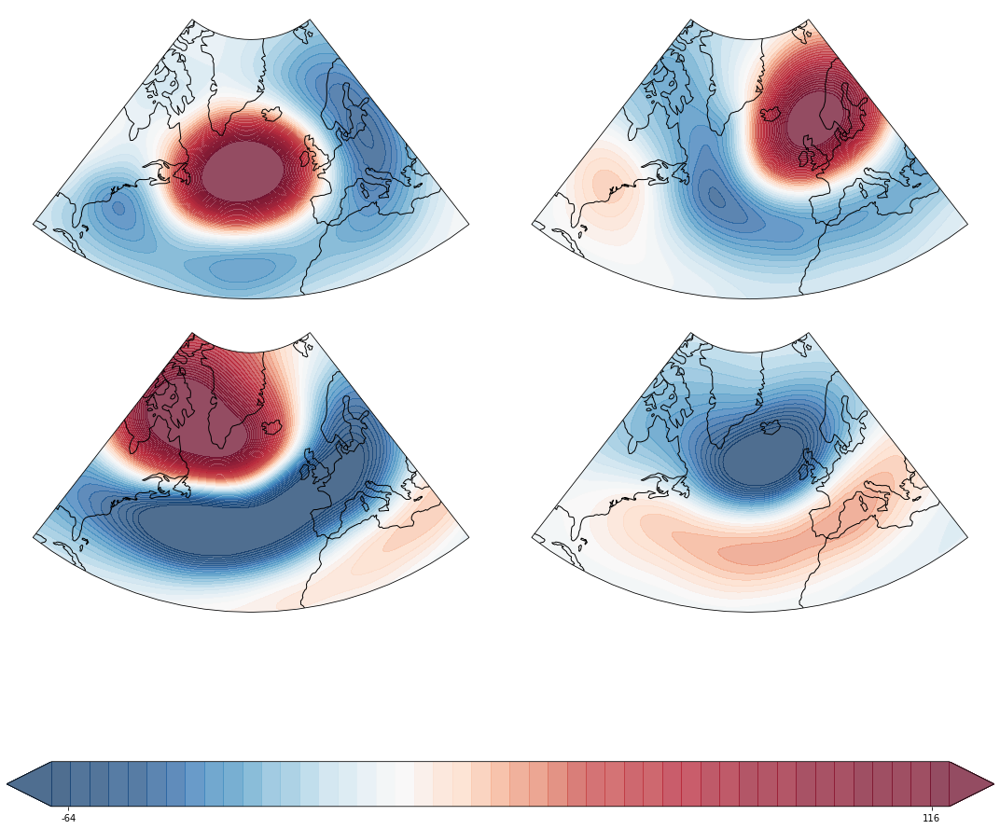

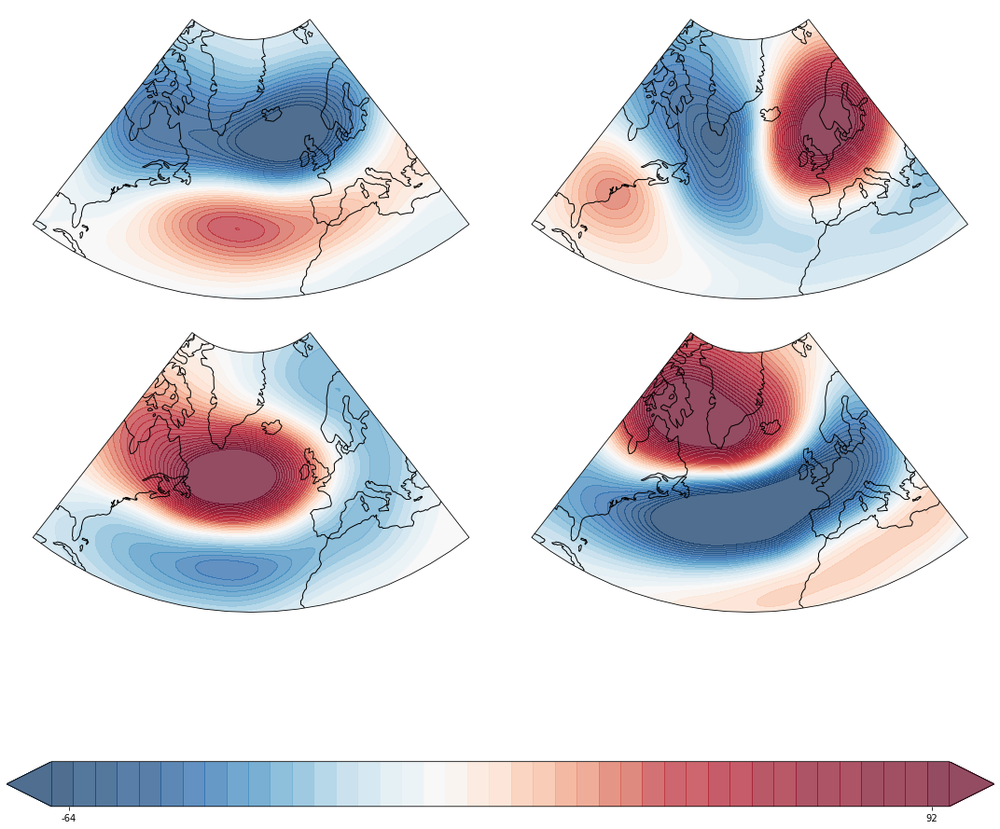

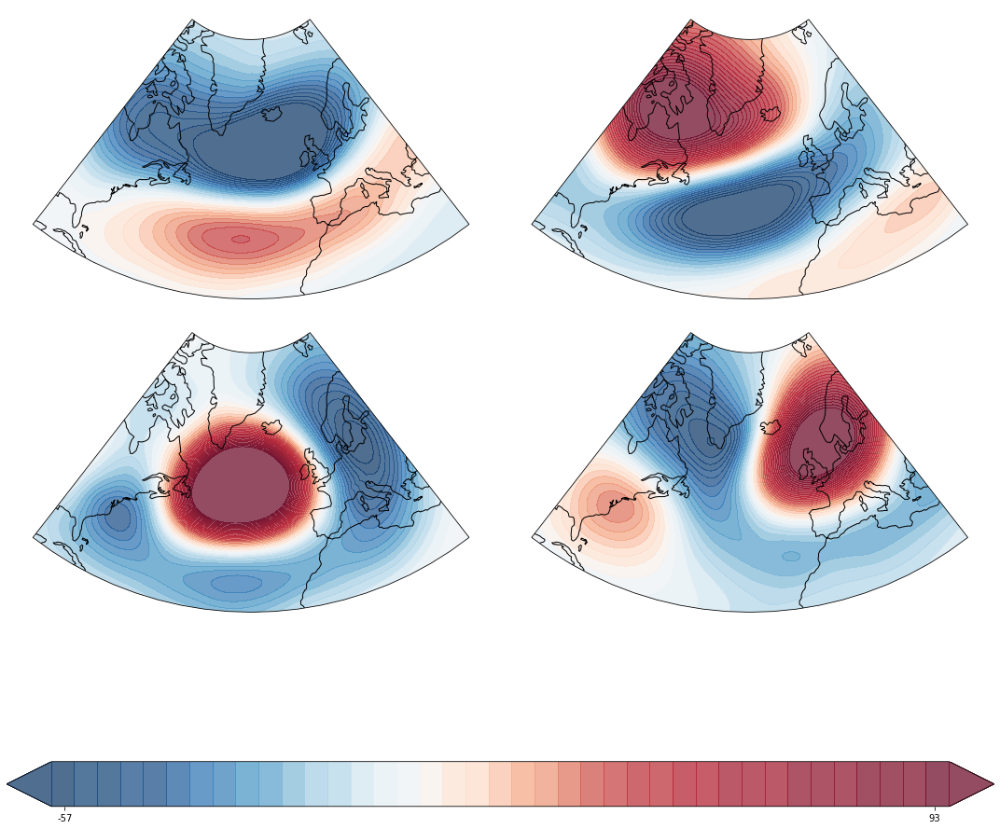

In [336]:
names = ["K-Means", "Bayesian-GMM", "GMM"]
centers = {name:[] for name in names}
lats, longs = np.unique(dt.latitude.values), np.unique(dt.longitude.values)
for name, model in zip(names, ['kmeans_model_ch.pkl','bayesian_gmm_model_silhouette.pkl','gmm_model_ch.pkl']):
    est = load_estimator('../models/weighted_sigma_vae_5/'+ model)
    
    labels = est.predict(reduced_anomaly.values)
    plot_regimes(pivot_anomaly, labels)

In [26]:
kmeans_mappings = {"AR":0, "SB":1, "NAO-":2, "NAO+":3}
bayesian_gmm_mappings = {"NAO+": 0, "SB":1, "AR":2, "NAO-":3}
gmm_mappings = {"NAO+": 0, "NAO-":1, "AR":2, "SB":3}
regimes = ["NAO+", "SB", "AR","NAO-"]
names = ["K-Means", "Bayesian-GMM", "GMM"]
pred_df = pd.DataFrame(
    index = pivot_anomaly.time.values,
    columns = pd.MultiIndex.from_product([names, regimes], names=['Method', 'Regime']))
for name, model in zip(names, ['kmeans_model_ch.pkl','bayesian_gmm_model_silhouette.pkl','gmm_model_ch.pkl']):
    est = load_estimator('./models/weighted_sigma_vae_5/'+ model)
    if name != 'K-Means':
        probas = est.predict_proba(reduced_anomaly.values)
        for col in regimes:
            try:
                if name == "Bayesian-GMM":
                    pred_df[(name,col)] = probas[:,bayesian_gmm_mappings[col]]
                else:
                    pred_df[(name,col)] = probas[:,gmm_mappings[col]]
            except:
                pred_df[(name,col)] = 0
        
    else:
        labels = est.predict(reduced_anomaly.values)
        one_hot = np.zeros((labels.size, labels.max()+1))
        one_hot[np.arange(labels.size),labels] = 1
        
        pred_df[name] = one_hot

In [27]:
pred_df.round(3).to_csv('predictions_weighted.csv')

### Targets MF

In [122]:
targets = pd.read_csv('W:/UK/Research/Private/WEATHER/STAGE_ABALDO/dataset/targets_MF.csv', index_col = 0,
                     header =[0,1])
targets.index = pd.to_datetime(targets.index)
targets = targets[targets[('Distance','Prediction')] == targets[('Correlation','Prediction')]]
targets = targets[targets.index.month.isin([1,2,12])]
targets = targets.xs('Distance', axis=1)['Prediction'].map({"NAO+":0, "SB":1, "AR":2, "NAO-":3})

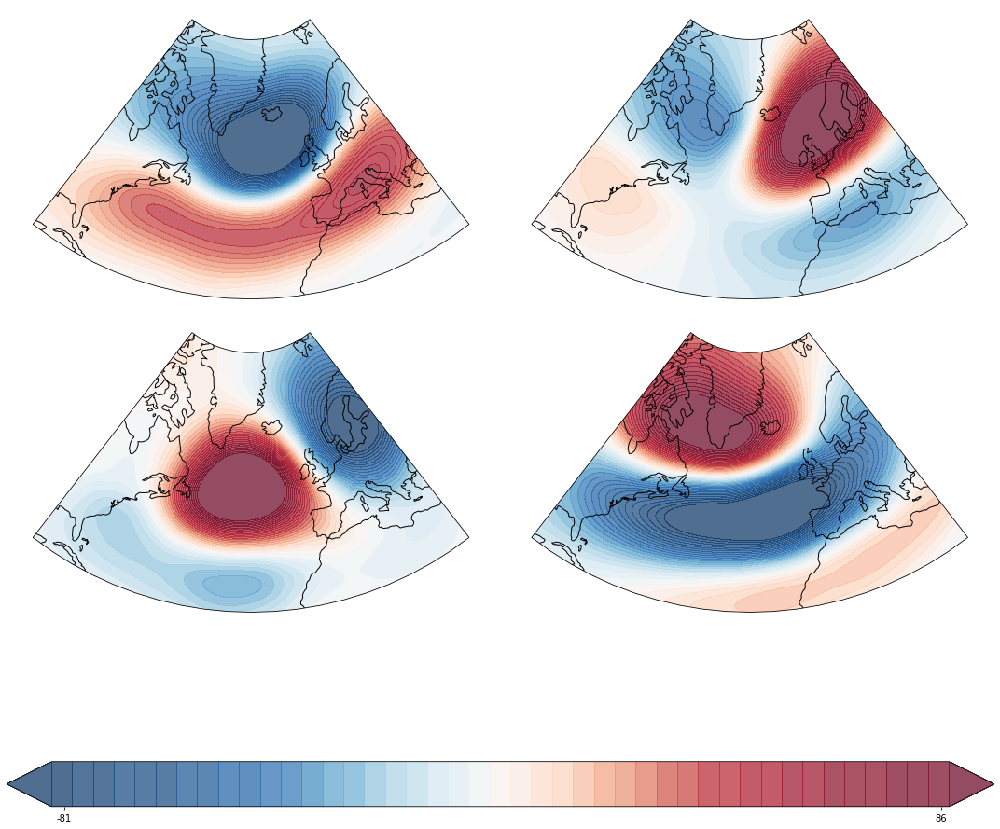

In [123]:
plot_regimes(pivot_anomaly.loc[targets.index, :], targets, savefig = "MF_centroids.png")

In [27]:
dataset = reduced_anomaly.loc[targets.index, :]
dataset.shape, targets.shape

((3298, 4), (3298,))

In [28]:
X, Xx, y, yy = train_test_split(dataset, targets, test_size = 0.2, stratify = targets)
X.shape, y.shape, Xx.shape, yy.shape

((2638, 4), (2638,), (660, 4), (660,))

In [29]:
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import balanced_accuracy_score
from sklearn.pipeline import Pipeline


pipe = Pipeline(steps=[('estimator', SVC())])

# Add a dict of estimator and estimator related parameters in this list
params_grid = [#{
                #'estimator':[SVC()],
                #'estimator__kernel':['linear','poly', 'rbf', 'sigmoid'],
                #'estimator__C': [1, 10, 100, 1000],
                #'estimator__gamma': [0.001, 0.0001],
                #'estimator__degree':[2,3,4]
                #},
                
                {
                'estimator': [DecisionTreeClassifier()],
                'estimator__max_depth': [None,3,4,5],
                'estimator__max_features': [None, "auto", "sqrt", "log2"],
                'estimator__criterion': ['gini', 'entropy']
                },
                {
                'estimator': [RandomForestClassifier()],
                'estimator__n_estimators': [100,300,500],
                'estimator__max_depth': [None,3,4,5],
                'estimator__max_features': [None, "auto", "sqrt", "log2"],
                'estimator__criterion': ['gini', 'entropy']
                },
                {
                'estimator': [AdaBoostClassifier()],
                'estimator__n_estimators': [100,300,500],
                'estimator__learning_rate':[0.01, 0.1, 0.3, 1, 3]
                },
                {
                'estimator': [KNeighborsClassifier()],
                'estimator__n_neighbors': [50,100,300],
                'estimator__weights':['uniform', 'distance']
                }
              ]

grid = GridSearchCV(pipe, params_grid, scoring = 'balanced_accuracy', cv = 5, n_jobs = -1, verbose = 10)
grid.fit(dataset, targets)

Fitting 5 folds for each of 149 candidates, totalling 745 fits


GridSearchCV(cv=5, estimator=Pipeline(steps=[('estimator', SVC())]), n_jobs=-1,
             param_grid=[{'estimator': [DecisionTreeClassifier()],
                          'estimator__criterion': ['gini', 'entropy'],
                          'estimator__max_depth': [None, 3, 4, 5],
                          'estimator__max_features': [None, 'auto', 'sqrt',
                                                      'log2']},
                         {'estimator': [RandomForestClassifier()],
                          'estimator__criterion': ['gini', 'entropy'],
                          'estima...
                          'estimator__n_estimators': [100, 300, 500]},
                         {'estimator': [AdaBoostClassifier()],
                          'estimator__learning_rate': [0.01, 0.1, 0.3, 1, 3],
                          'estimator__n_estimators': [100, 300, 500]},
                         {'estimator': [KNeighborsClassifier(n_neighbors=50,
                                        

In [30]:
grid.best_estimator_, grid.best_score_, grid.best_params_

(Pipeline(steps=[('estimator',
                  KNeighborsClassifier(n_neighbors=50, weights='distance'))]),
 0.8119716604543132,
 {'estimator': KNeighborsClassifier(n_neighbors=50, weights='distance'),
  'estimator__n_neighbors': 50,
  'estimator__weights': 'distance'})

### Seasonal Forecast

In [ ]:
if ('SeasonalForecast_monthly_Geopotential-500hPa_2017-2020_ECMWF5.nc' 
    not in os.listdir('W:/UK/Research/Private/WEATHER/STAGE_ABALDO/dataset/Seasonal_Forecast')):
    datasets = dict()
    for key in ['em', 'hcmean', 'fcmean']:
        sf = xr.open_dataset('W:/UK/Research/Private/WEATHER/STAGE_ABALDO/dataset/Seasonal_Forecast/'+\
                             'SeasonalForecast_monthly_Geopotential-500hPa_1993-2020_ECMWF5.grib',
                            engine = 'cfgrib', backend_kwargs=dict(filter_by_keys={'dataType': key})) #em, hcmean, fcmean
        sf['z'] /= G
        sfs = []
        for i in range(len(sf['time'])):
            sf_temp = sf.isel(time = i).dropna(dim = 'step', how = 'all')
            sf_temp["step"] = range(1,7)
            sfs.append(sf_temp)

        datasets[key] = xr.concat(sfs, dim = "time").rename(dict(z = key))
    
    sf = xr.merge(datasets.values())
    sf.to_netcdf('W:/UK/Research/Private/WEATHER/STAGE_ABALDO/dataset/Seasonal_Forecast/'+\
             'SeasonalForecast_monthly_Geopotential-500hPa_2017-2020_ECMWF5.nc')
else:
    sf = read_nc('W:/UK/Research/Private/WEATHER/STAGE_ABALDO/dataset/Seasonal_Forecast/'+\
             'SeasonalForecast_monthly_Geopotential-500hPa_2017-2020_ECMWF5.nc')

In [ ]:
sf["normal"] = sf["hcmean"].groupby("time.month").mean()
sf["anomaly"] = sf["fcmean"].groupby("time.month") - sf["normal"]
sf

In [ ]:
sf = sf.drop("month")
sf = sf.sel(time = sf["time.month"].isin([1,2,11,12]), step = [1,2])
sf

In [ ]:
estimator = load_estimator("../models/weighted_sigma_vae_5/gmm_model_ch.pkl")
probas, elbo, means, covariances, _ = extract_regimes(reduced_anomaly, method='gmm', nb_regimes = 6, estimator = estimator)
labels = np.argmax(probas, axis=1)

In [ ]:
pivot_dt = pivot_anomaly.unstack('latlon').assign_coords(labels = ('time', labels))
centroids = pivot_dt.groupby('labels').mean()
centroids = centroids.reindex(latitude = sf['latitude'], longitude = sf['longitude'], method = 'nearest')

In [ ]:
centroids.plot.contourf(x="longitude", y="latitude", col = "labels")

In [ ]:
sf["anomaly"].sel(time = "2020-12-01", number = 0).plot.contourf(x="longitude", y = "latitude", col = "step", col_wrap = 3)

In [ ]:
centroids.shape, sf['anomaly'].shape

In [ ]:
def elementwise_cdist(a,b):
    s_a = np.einsum('cxy, cxy->c', a,a)
    s_a = np.repeat(
            np.repeat(
                np.repeat(s_a[..., np.newaxis], 112, axis = -1)[..., np.newaxis],
            2, axis = -1)[...,np.newaxis],
        51, axis = -1)
    s_b = np.einsum('tnsxy, tnsxy->tsn', b,b)
    s_b = np.repeat(s_b[np.newaxis,...], 4, axis = 0)
    print(s_a.shape, s_b.shape)
    return np.sqrt(s_a+s_b -2*np.einsum('cxy, tnsxy->ctsn',a,b))

distances = elementwise_cdist(centroids, sf["anomaly"])
labels = np.argmin(distances, axis=0)
print(labels.shape)
seasonal_dt = sf['anomaly'].stack(grouped = ['time','step','number'])
seasonal_dt = seasonal_dt.assign_coords(labels = ('grouped',labels.flatten()))

In [ ]:
seasonal_dt.groupby("labels").mean().plot.contourf(x="longitude", y="latitude", col = "labels")

In [ ]:
distances = xr.DataArray(data = distances, dims = ("labels", "time", "step", "number"),
             coords = {"labels" : [0,1,2,3], "time" : sf["time"], "step" : [1,2], "number" : sf["number"]})
df = distances.to_dataframe(name="distance").swaplevel(0,1).swaplevel(1,2).swaplevel(2,3)

In [ ]:
df = df.reset_index('labels').sort_values("distance").groupby(['time', 'step','number']).first()
df['labels'] = df['labels'].map({0: "AR", 1: "NAO-", 2: "NAO+", 3: "SB"})
df = df.dropna(how = 'any')

In [95]:
df = df.reset_index().pivot_table(index = ['time', 'step'], columns = 'labels',
                            aggfunc={"labels" : "count"}).fillna(0)
df.to_csv("../predictions/predictions_seasonal.csv")

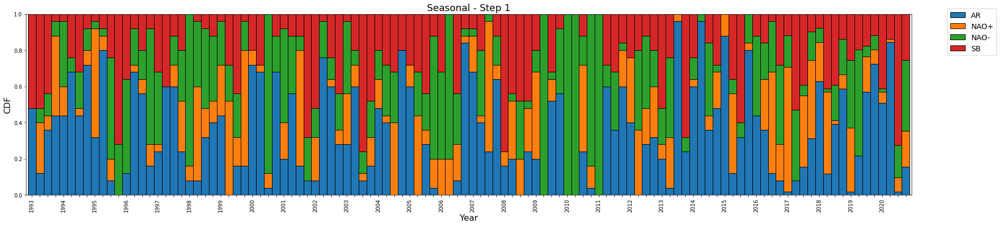

In [96]:
fig, ax = plt.subplots(1,1, figsize=(30,7))
step1 = df.loc[pd.IndexSlice[:, 1],:].reset_index(level = 1, drop = True).apply(lambda x: x/ x.sum(), axis=1)
step1.columns = step1.columns.droplevel()
step1.plot.bar(stacked = True, ax = ax, width = 1.0, edgecolor='k')
ax.legend(step1.columns, bbox_to_anchor=(1.1, 1.05))
ax.set_ylim(0,1)
ax.set_ylabel("CDF", fontsize = 16)
ax.set_xlabel("Year", fontsize = 16)
ax.set_title("Seasonal - Step 1", fontsize = 18)
ax.set_xticklabels([ts.strftime('%Y') if ts.year != step1.index[idx-1].year
                    else "" for idx, ts in enumerate(step1.index)])
ax.figure.autofmt_xdate(rotation=90, ha='center')
plt.savefig("../imgs/stacked_bar_seasonal1.png")
plt.show()

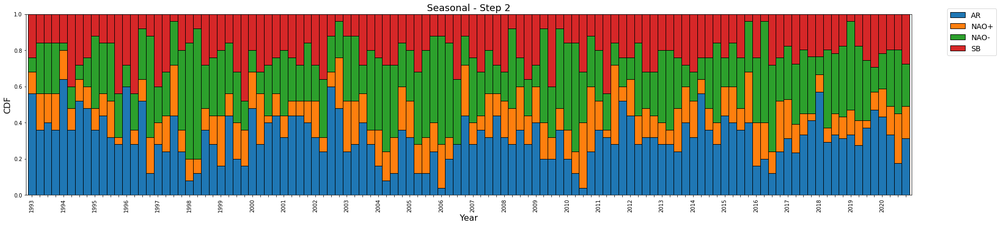

In [97]:
fig, ax = plt.subplots(1,1, figsize=(30,7))
step2 = df.loc[pd.IndexSlice[:, 2],:].reset_index(level = 1, drop = True).apply(lambda x: x/ x.sum(), axis=1)
step2.columns = step2.columns.droplevel()
step2.plot.bar(stacked = True, ax = ax, width = 1.0, edgecolor='k')
ax.legend(step2.columns, bbox_to_anchor=(1.1, 1.05))
ax.set_ylim(0,1)
ax.set_ylabel("CDF", fontsize = 16)
ax.set_xlabel("Year", fontsize = 16)
ax.set_title("Seasonal - Step 2", fontsize = 18)
ax.set_xticklabels([ts.strftime('%Y') if ts.year != step2.index[idx-1].year
                    else "" for idx, ts in enumerate(step2.index)])
ax.figure.autofmt_xdate(rotation=90, ha='center')
plt.savefig("../imgs/stacked_bar_seasonal2.png")
plt.show()

In [98]:
predictions = pd.read_csv("../predictions/predictions_VAE.csv", index_col = 0, header = [0,1])
predictions.index = pd.to_datetime(predictions.index)
predictions = predictions.xs("GMM", level = 0, axis = 1)
predictions = predictions.reindex(sorted(predictions.columns, key = lambda x: (x[0], x[1])), axis=1)

In [99]:
_predictions = predictions.resample('MS').sum()
_predictions = _predictions[_predictions.index.month.isin([1,2,11,12])]["1993-01-01":"2020-12-01"]

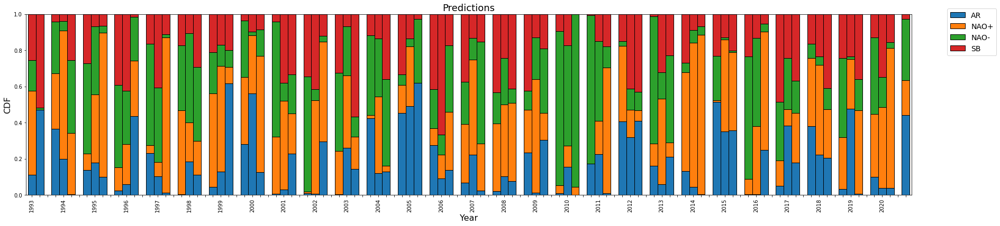

In [100]:
fig, ax = plt.subplots(1,1, figsize=(30,7))
_predictions = _predictions.apply(lambda x: x/x.sum(), axis = 1)
_predictions.plot.bar(stacked = True, ax = ax, width=1.0, edgecolor = 'k')
ax.legend(_predictions.columns, bbox_to_anchor=(1.1, 1.05))
ax.set_ylim(0,1)
ax.set_ylabel("CDF", fontsize = 16)
ax.set_xlabel("Year", fontsize = 16)
ax.set_title("Predictions", fontsize = 18)
ax.set_xticklabels([ts.strftime('%Y') if ts.year != _predictions.index[idx-1].year
                    else "" for idx, ts in enumerate(_predictions.index)])
ax.figure.autofmt_xdate(rotation=90, ha='center')
plt.savefig("../imgs/stacked_bar_predictionsVAE.png")
plt.show()

In [101]:
targets = pd.read_csv('W:/UK/Research/Private/WEATHER/STAGE_ABALDO/dataset/targets_MF.csv', index_col = 0,
                     header =[0,1])
targets.index = pd.to_datetime(targets.index)
targets = targets[targets[('Distance','Prediction')] == targets[('Correlation','Prediction')]]
targets = targets[targets.index.month.isin([1,2,11,12])]
targets = targets.reindex(sorted(targets.columns, key = lambda x: (x[0],x[1])), axis=1)

In [102]:
_targets = targets.xs('Distance', level = 0, axis = 1)
_targets.drop(_targets.columns.difference(['Prediction']), axis = 1, inplace = True)
_targets = _targets.pivot_table(index = _targets.index, columns = 'Prediction',
                               aggfunc = dict(Prediction = 'count'))
_targets = _targets.fillna(0).resample('MS').sum()
_targets = _targets[_targets.index.month.isin([1,2,11,12])]["1993-01-01":"2020-12-01"]

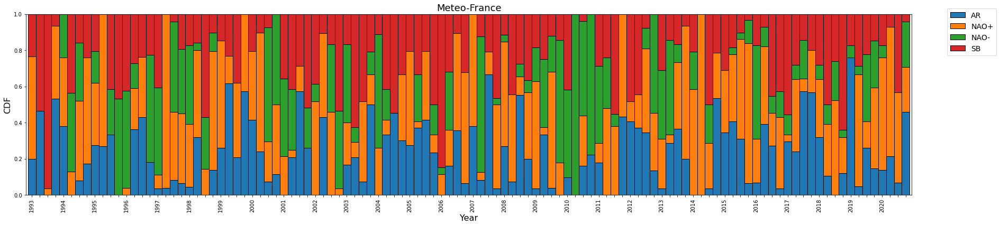

In [103]:
fig, ax = plt.subplots(1,1, figsize=(30,7))
_targets = _targets.apply(lambda x: x/x.sum(), axis = 1)
_targets.columns = _targets.columns.droplevel()
_targets.plot.bar(stacked = True, ax = ax, width=1.0, edgecolor = 'k')
ax.legend(_targets.columns, bbox_to_anchor=(1.1, 1.05))
ax.set_ylim(0,1)
ax.set_ylabel("CDF", fontsize = 16)
ax.set_xlabel("Year", fontsize = 16)
ax.set_title("Meteo-France", fontsize = 18)
ax.set_xticklabels([ts.strftime('%Y') if ts.year != _targets.index[idx-1].year
                    else "" for idx, ts in enumerate(_targets.index)])
ax.figure.autofmt_xdate(rotation=90, ha='center')
plt.savefig("../imgs/stacked_bar_MF.png")
plt.show()

In [104]:
pd.DataFrame.from_dict(
    {
        "Historical vs. MeteoFrance": _predictions.corrwith(_targets, axis = 0),
        "Step1 vs. MeteoFrance": step1.corrwith(_targets, axis = 0),
        "Step2 vs. MeteoFrance": step2.corrwith(_targets, axis = 0)
    }, orient = 'index')

,AR,NAO+,NAO-,SB
Historical vs. MeteoFrance,0.823241,0.738151,0.746717,0.787319
Step1 vs. MeteoFrance,-0.115745,-0.198572,0.580563,0.288212
Step2 vs. MeteoFrance,0.008020,0.061827,0.182507,-0.089924


In [105]:
seasons = {k:"DJF" if k in [1,2,12] else "_" for k in range(1,13)}

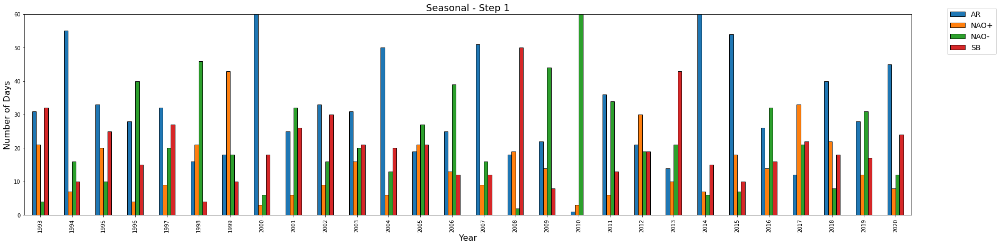

In [106]:
fig, ax = plt.subplots(1,1, figsize=(30,7))
step1 = df.loc[pd.IndexSlice[:, 1],:].reset_index(level = 1, drop = True)
step1 = step1.groupby(lambda x: (x.year, seasons.get(x.month))).sum().\
    apply(lambda x: x *90 / x.sum(), axis=1).astype(int)
step1.index = pd.MultiIndex.from_tuples(step1.index, names = ["year", "season"])
step1 = step1.xs('DJF', level = 1)
step1.columns = step1.columns.droplevel()
step1.plot.bar(ax = ax, edgecolor='k')
ax.legend(step1.columns, bbox_to_anchor=(1.1, 1.05))
ax.set_ylim(0,60)
ax.set_ylabel("Number of Days", fontsize = 16)
ax.set_xlabel("Year", fontsize = 16)
ax.set_title("Seasonal - Step 1", fontsize = 18)
plt.savefig("../imgs/count_winter_seasonal1.png")
plt.show()

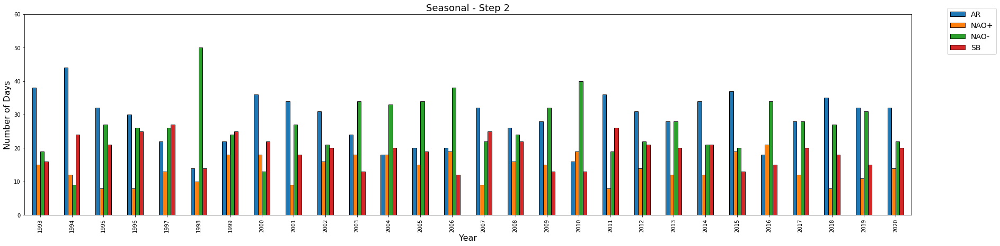

In [107]:
fig, ax = plt.subplots(1,1, figsize=(30,7))
step2 = df.loc[pd.IndexSlice[:, 2],:].reset_index(level = 1, drop = True)
step2 = step2.groupby(lambda x: (x.year, seasons.get(x.month))).sum().\
    apply(lambda x: x *90 / x.sum(), axis=1).astype(int)
step2.index = pd.MultiIndex.from_tuples(step2.index, names = ["year", "season"])
step2 = step2.xs('DJF', level = 1)
step2.columns = step2.columns.droplevel()
step2.plot.bar(ax = ax, edgecolor='k')
ax.legend(step2.columns, bbox_to_anchor=(1.1, 1.05))
ax.set_ylim(0,60)
ax.set_ylabel("Number of Days", fontsize = 16)
ax.set_xlabel("Year", fontsize = 16)
ax.set_title("Seasonal - Step 2", fontsize = 18)
plt.savefig("../imgs/count_winter_seasonal2.png")
plt.show()

In [119]:
_predictions = predictions.groupby(lambda x: (x.year, seasons.get(x.month))).sum()
_predictions.index = pd.MultiIndex.from_tuples(_predictions.index, names = ["year", "season"])
_predictions.reset_index(level = 1, inplace = True, drop = True)
_predictions = _predictions.loc[1993:2020]

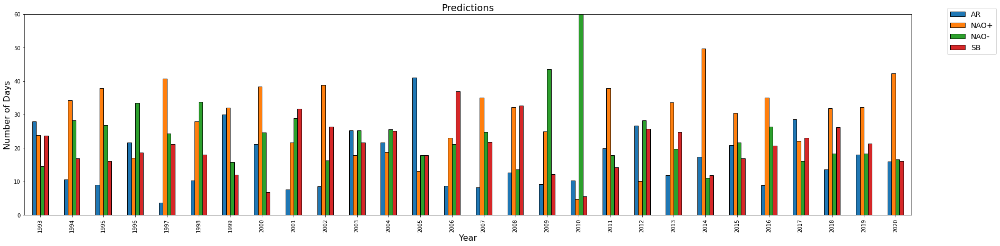

In [120]:
fig, ax = plt.subplots(1,1, figsize=(30,7))
_predictions.plot.bar(ax = ax, edgecolor = 'k')
ax.legend(_predictions.columns, bbox_to_anchor=(1.1, 1.05))
ax.set_ylim(0,60)
ax.set_ylabel("Number of Days", fontsize = 16)
ax.set_xlabel("Year", fontsize = 16)
ax.set_title("Predictions", fontsize = 18)
plt.savefig("../imgs/count_winter_predictionsVAE.png")
plt.show()

In [116]:
_targets = targets.xs('Distance', level = 0, axis = 1)
_targets.drop(_targets.columns.difference(['Prediction']), axis = 1, inplace = True)
_targets = _targets.pivot_table(index = _targets.index, columns = 'Prediction',
                               aggfunc = dict(Prediction = 'count'))
_targets = _targets["1993-01-01":"2020-12-01"]
_targets = _targets.fillna(0).groupby(lambda x: (x.year, seasons.get(x.month))).sum()

In [117]:
_targets.index = pd.MultiIndex.from_tuples(_targets.index, names = ["year", "season"])
_targets = _targets.xs('DJF', level = 1)

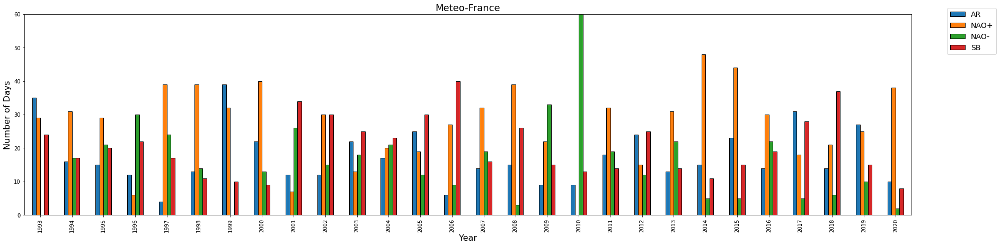

In [118]:
fig, ax = plt.subplots(1,1, figsize=(30,7))
_targets.columns = _targets.columns.droplevel()
_targets.plot.bar(ax = ax, edgecolor = 'k')
ax.set_ylim(0,60)
ax.legend(_targets.columns, bbox_to_anchor=(1.1, 1.05))
ax.set_ylabel("Number of Days", fontsize = 16)
ax.set_xlabel("Year", fontsize = 16)
ax.set_title("Meteo-France", fontsize = 18)
plt.savefig("../imgs/count_winter_MF.png")
plt.show()

In [74]:
view = pd.read_csv("../../dataset/Weather_Regime_Monthly_RobinView.csv", header = 0, index_col = 0,
           encoding = "ISO-8859-1")
view = view.reset_index().set_index(['YEAR', 'MONTH']).drop(['SECOND REGIME','REMARKS'], axis = 1)
view['Predictions'] = view['MAIN REGIME'].map({'AR': 0,'NAO+':1,'NAO-':2,'SB':3, 'mixed':4})
view

MAIN REGIME  Predictions
YEAR MONTH                         
1993 11             SB          3.0
     12             AR          0.0
1994 1            NAO+          1.0
     2              SB          3.0
     3            NAO+          1.0
...                ...          ...
2021 1            NAO-          2.0
     2            NAO-          2.0
     3              SB          3.0
     11            NaN          NaN
     12            NaN          NaN

[142 rows x 2 columns]

In [75]:
_targets = targets.xs('Distance', level = 0, axis = 1)
_targets.drop(_targets.columns.difference(['Prediction']), axis = 1, inplace = True)
_targets = _targets.pivot_table(index = _targets.index, columns = 'Prediction',
                               aggfunc = dict(Prediction = 'count'))
_targets = _targets["1993-01-01":"2020-12-01"]
_targets = _targets.fillna(0).groupby(lambda x: (x.year, x.month)).sum()
_targets.index = pd.MultiIndex.from_tuples(_targets.index, names = ["year", "month"])
_targets.columns = _targets.columns.droplevel()

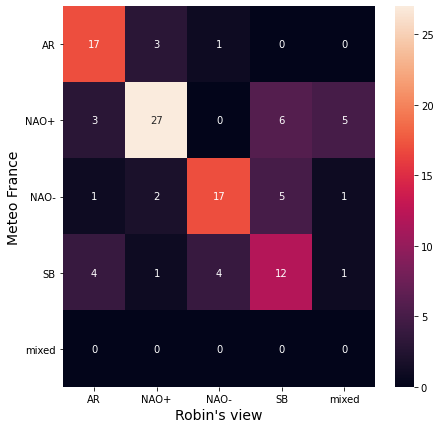

In [76]:
conf_matrix = confusion_matrix(np.argmax(_targets.loc[_targets.index.intersection(view.index)].values, axis = 1),
                               view.loc[_targets.index.intersection(view.index)]['Predictions'].values)
fig, ax = plt.subplots(1,1,figsize = (7, 7))
sns.heatmap(conf_matrix, annot = True, ax = ax, 
            yticklabels = ['AR','NAO+','NAO-','SB','mixed'],
            xticklabels = ['AR','NAO+','NAO-','SB','mixed'],     
           )
ax.tick_params(axis='x', rotation = 0)
ax.tick_params(axis='y', rotation = 0)
ax.set_xlabel("Robin's view")
ax.set_ylabel("Meteo France")
plt.show()

In [77]:
_predictions  = predictions.groupby([predictions.index.year, predictions.index.month]).sum().apply(lambda x: x/x.sum(), axis = 1)
_predictions['Predictions'] = _predictions.\
        apply(lambda x: np.argmax(x) if sorted(x)[-1] - sorted(x)[-2] >= 0.2 else 4, axis = 1)
_predictions

Regime         AR      NAO+      NAO-        SB  Predictions
1979 1   0.144687  0.237983  0.481838  0.135493            2
     2   0.105504  0.413943  0.125183  0.355370            4
     12  0.092909  0.457546  0.370766  0.078779            4
1980 1   0.114893  0.128928  0.577370  0.178809            2
     2   0.083655  0.079966  0.499552  0.336828            4
...           ...       ...       ...       ...          ...
2020 1   0.038220  0.446896  0.167425  0.347460            4
     2   0.039966  0.773483  0.030379  0.156172            1
     12  0.441605  0.191896  0.337915  0.028584            4
2021 1   0.110581  0.002516  0.789742  0.097161            2
     2   0.030752  0.146403  0.485142  0.337703            4

[128 rows x 5 columns]

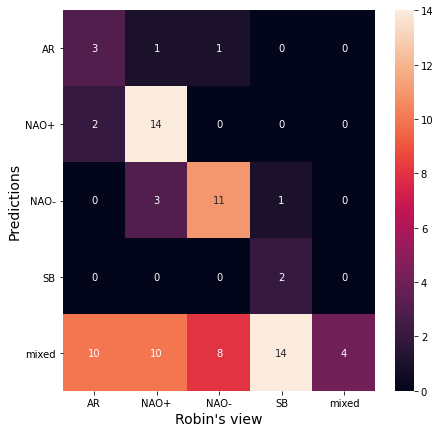

In [78]:
conf_matrix = confusion_matrix(_predictions.loc[_predictions.index.intersection(view.index)]['Predictions'].values,
                               view.loc[_predictions.index.intersection(view.index)]['Predictions'].values)
fig, ax = plt.subplots(1,1,figsize = (7, 7))
sns.heatmap(conf_matrix, annot = True, ax = ax, 
            yticklabels = ['AR','NAO+','NAO-','SB','mixed'],
            xticklabels = ['AR','NAO+','NAO-','SB','mixed'],     
           )
ax.tick_params(axis='x', rotation = 0)
ax.tick_params(axis='y', rotation = 0)
ax.set_xlabel("Robin's view")
ax.set_ylabel("Predictions")
plt.show()

### Targets vs. Clustering

In [14]:
def get_conf_matrix(predictions, targets, **kwargs):
    conf_matrix = np.concatenate(
        [confusion_matrix(
            np.argmin(targets.values, axis = 1),
            np.argmax(predictions.xs('K-Means', level = 0, axis = 1).values, axis = 1),
            normalize = 'true')*100,
         confusion_matrix(
            np.argmin(targets.values, axis = 1),
            np.argmax(predictions.xs('Bayesian-GMM', level = 0, axis = 1).values, axis = 1),
            normalize = 'true')*100,
         confusion_matrix(
            np.argmin(targets.values, axis = 1),
            np.argmax(predictions.xs('GMM', level = 0, axis = 1).values, axis = 1),
            normalize = 'true')*100
        ], axis = 1)

    fig, ax = plt.subplots(1,1,figsize = (22.5, 7))
    sns.heatmap(conf_matrix, annot = True, ax = ax, cbar_kws={'format': '%.0f%%'}, annot_kws={"size": 16},
                yticklabels = sorted(np.unique(predictions.columns.get_level_values(1))),
                xticklabels = ["\n".join(list(e)[::-1]) for e in 
                               list(itertools.product(
                                   ('K-Means', 'DPMM', 'GMM'),
                                   sorted(np.unique(predictions.columns.get_level_values(1)))))],     
               )
    ax.tick_params(axis='x', rotation = 0)
    ax.tick_params(axis='y', rotation = 0)
    for i in range(conf_matrix.shape[0], conf_matrix.shape[1]+1, conf_matrix.shape[0]):
        ax.axvline(i, color = 'white')
    
    if 'savefig' in kwargs:
        plt.savefig(kwargs['savefig'], bbox_inches = 'tight')
    plt.show()

def get_multiclass_roc(predictions, targets, **kwargs):
    cols = targets.columns
    targets = label_binarize(np.argmin(targets.values, axis = 1), classes = range(len(cols)))
    n_classes = targets.shape[1]
    
    fig, axs = plt.subplots(1,3, figsize = (22.5, 7))
    for ax, model in zip(axs.flat,['K-Means', 'Bayesian-GMM', 'GMM']):
        roc_auc, tpr,fpr = dict(), dict(), dict()
        for i in range(n_classes):
            fpr[i], tpr[i], _ = roc_curve(targets[:,i], predictions.xs(model, level = 0, axis = 1).iloc[:,i])
            roc_auc[i] = auc(fpr[i], tpr[i])
            
        fpr["micro"], tpr["micro"], _ = roc_curve(targets.ravel(),
                                                  predictions.xs(model, level = 0, axis = 1).values.ravel())
        roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
            
            
        all_fpr = np.unique(np.concatenate([fpr[j] for j in range(n_classes)]))
        mean_tpr = np.zeros_like(all_fpr)
        
        for i in range(n_classes):
            mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
        
        mean_tpr /= n_classes
        
        fpr["macro"] = all_fpr
        tpr["macro"] = mean_tpr
        roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])
        
        ax.plot(fpr["micro"], tpr["micro"], label = "micro-average ROC curv (area = {0:0.2f})".format(roc_auc["micro"]),
               color = 'deeppink', linestyle = ":", linewidth = 4)
        
        ax.plot(fpr["macro"], tpr["macro"], label = "micro-average ROC curv (area = {0:0.2f})".format(roc_auc["macro"]),
               color = 'navy', linestyle = ":", linewidth = 4)
        
        for i in range(n_classes):
            ax.plot(fpr[i], tpr[i], linewidth = 2.1, label = "ROC curve of class {0} (area: {1:0.2f})".\
                   format(cols[i], roc_auc[i]))
            
        ax.plot([0,1], [0,1], 'k--', linewidth = 2.1)
        ax.set_xlim([0.0, 1.0])
        ax.set_ylim([0.0, 1.05])
        ax.set_xlabel('False Positive Rate (FPR)')
        ax.set_ylabel('True Positive Rate (TPR)')
        ax.legend(loc = "lower right")
        ax.set_title(model if model != "Bayesian-GMM" else "DPMM")
        if 'savefig' in kwargs:
            plt.savefig(kwargs['savefig'], bbox_inches = 'tight')
    plt.show()

#### Targets Meteo-France

In [12]:
targets = pd.read_csv('W:/UK/Research/Private/WEATHER/STAGE_ABALDO/dataset/targets_MF.csv', index_col = 0,
                     header =[0,1])
targets.index = pd.to_datetime(targets.index)
targets = targets[targets[('Distance','Prediction')] == targets[('Correlation','Prediction')]]
targets = targets[targets.index.month.isin([1,2,12])]
targets.drop(['Prediction'], axis = 1, level = 1, inplace = True)
targets = targets.reindex(sorted(targets.columns, key = lambda x: (x[0],x[1])), axis=1)

In [13]:
predictions = pd.read_csv("../predictions/predictions_VAE.csv", index_col = 0, header = [0,1])
predictions.index = pd.to_datetime(predictions.index)
predictions = predictions.loc[targets.index].copy()
predictions = predictions.reindex(sorted(predictions.columns, key = lambda x: (x[0], x[1])), axis=1)

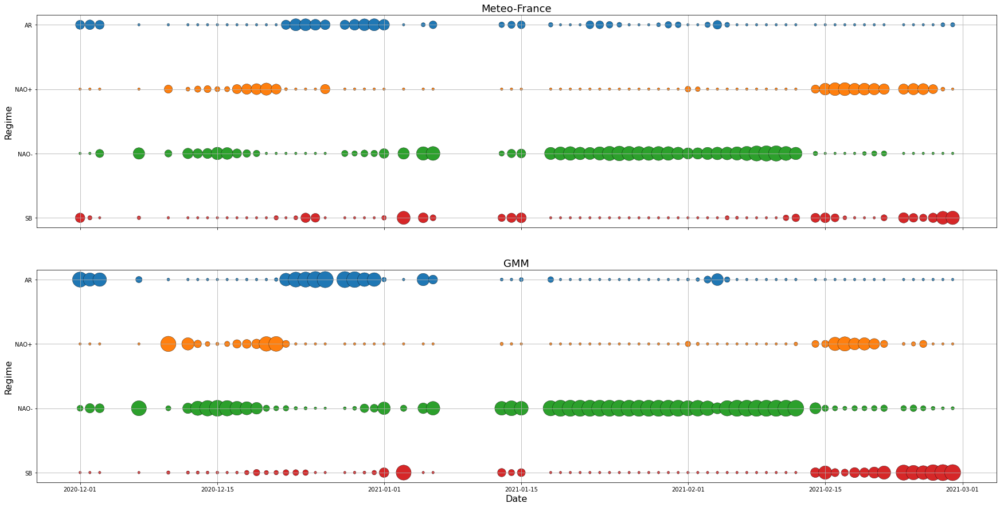

In [53]:
fig, axs = plt.subplots(2,1, figsize = (30,15), sharex = True)
axs[0].grid()
sns.scatterplot(data = targets["2020-12-01":].xs('Correlation', level = 0, axis = 1).reset_index().\
                melt(id_vars = ['index'], value_vars = ['AR','NAO+','NAO-','SB'],
                        var_name = 'regime', value_name = 'distance'),
                x = 'index', y = 'regime', size = 'distance', hue = 'regime', sizes = (20, 800), size_norm = (0,1),
                edgecolor = 'k', ax = axs[0], legend = False)
axs[0].set_xlabel('Date', fontsize = 16)
axs[0].set_ylabel("Regime", fontsize = 16)
axs[0].set_title('Meteo-France', fontsize = 18)
'''
axs[1].grid()
sns.scatterplot(data = predictions["2020-12-01":].xs('Bayesian-GMM', level = 0, axis = 1).reset_index().\
                melt(id_vars = ['index'], value_vars = ['AR','NAO+','NAO-','SB'],
                        var_name = 'regime', value_name = 'probability'),
                x = 'index', y = 'regime', size = 'probability', hue = 'regime', sizes = (20, 800),
                edgecolor = 'k', ax = axs[1], legend = False)
'''
axs[1].grid()
sns.scatterplot(data = predictions["2020-12-01":].xs('GMM', level = 0, axis = 1).reset_index().\
                melt(id_vars = ['index'], value_vars = ['AR','NAO+','NAO-','SB'],
                        var_name = 'regime', value_name = 'probability'),
                x = 'index', y = 'regime', size = 'probability', hue = 'regime', sizes = (20, 800),
                edgecolor = 'k', ax = axs[1], legend = False)
axs[1].set_xlabel('Date', fontsize = 16)
axs[1].set_ylabel("Regime", fontsize = 16)
axs[1].set_title('GMM', fontsize = 18)
plt.savefig("../imgs/bubble_winter_MF.png")
plt.show()

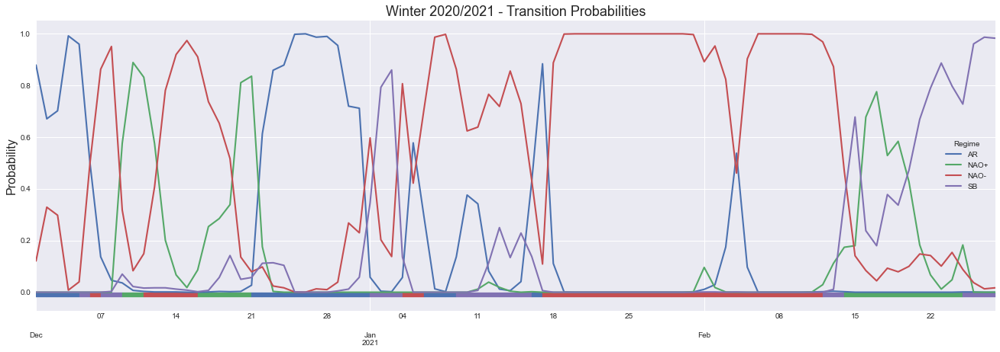

In [45]:
def compare_dynamics(targets, predictions, model):
    with plt.style.context('seaborn'):
        fig, ax = plt.subplots(1,1, figsize=(22.5,7))
        prob_model = predictions.xs(model, level = 0, axis = 1)
        if 'Prediction' in prob_model.columns:
            prob_model.drop('Prediction', axis = 1, inplace = True)
        prob_model.plot(kind='line', linewidth = 2.1, ax = ax, color=sns.color_palette())
        colors = {line.get_label(): line.get_color() for line in ax.get_lines()}

        for idx, row in targets.iterrows():
            #print(row['Prediction'])
            ax.fill_betweenx([0., -0.02], [idx-timedelta(days=1)], [idx], color = colors[row['Prediction']], alpha = 1.)
        
        ax.set_ylabel("Probability", fontsize = 16)
        ax.set_title("Winter 2020/2021 - Transition Probabilities", fontsize = 18)
        plt.savefig("../imgs/compare_dynamics_MF.png")
        plt.show()

targets = pd.read_csv('W:/UK/Research/Private/WEATHER/STAGE_ABALDO/dataset/targets_MF.csv', index_col = 0,
                     header =[0,1])
targets.index = pd.to_datetime(targets.index)
predictions = pd.read_csv("../predictions/predictions_VAE.csv", index_col = 0, header = [0,1])
predictions.index = pd.to_datetime(predictions.index)
predictions = predictions.reindex(sorted(predictions.columns, key = lambda x: (x[0], x[1])), axis=1)
compare_dynamics(targets.xs('Distance', level = 0, axis =1)["2020-12-01":], predictions["2020-12-01":], "GMM")

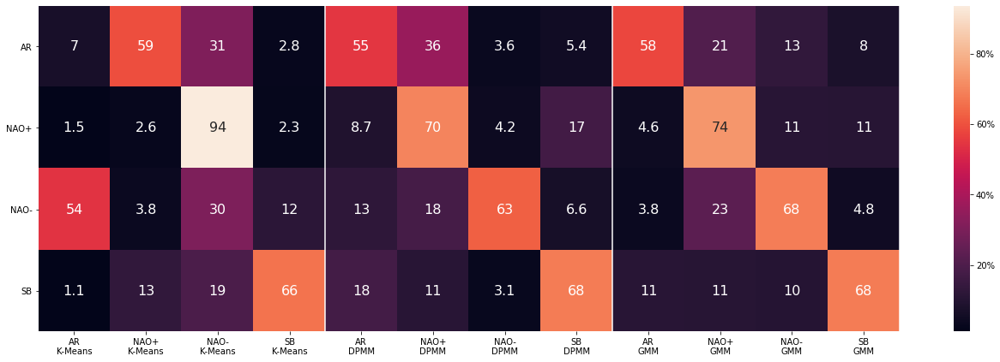

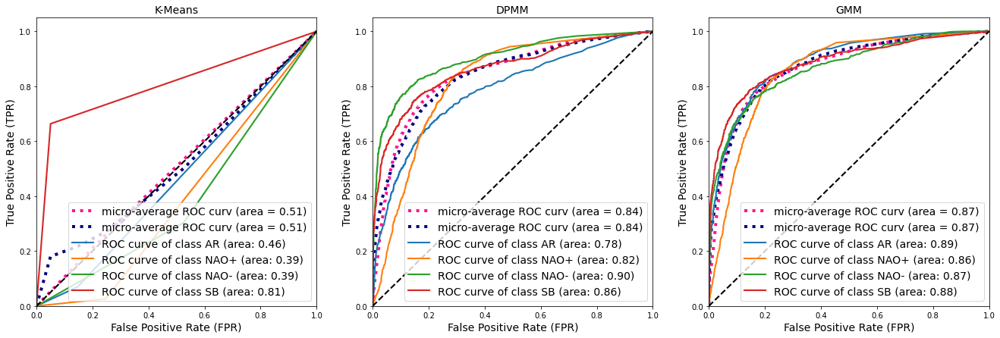

In [15]:
get_conf_matrix(predictions, targets.xs('Distance', level = 0, axis = 1), savefig = "../imgs/conf_matrix_predictionsVAE.png")
get_multiclass_roc(predictions, targets.xs('Distance', level = 0, axis = 1), savefig = "../imgs/roc_predictionsVAE.png")

In [16]:
predictions = pd.read_csv("../predictions/predictions_weighted_new.csv", index_col = 0, header = [0,1])
predictions.index = pd.to_datetime(predictions.index)
predictions = predictions.loc[targets.index].copy()
predictions = predictions.reindex(sorted(predictions.columns, key = lambda x: (x[0], x[1])), axis=1)

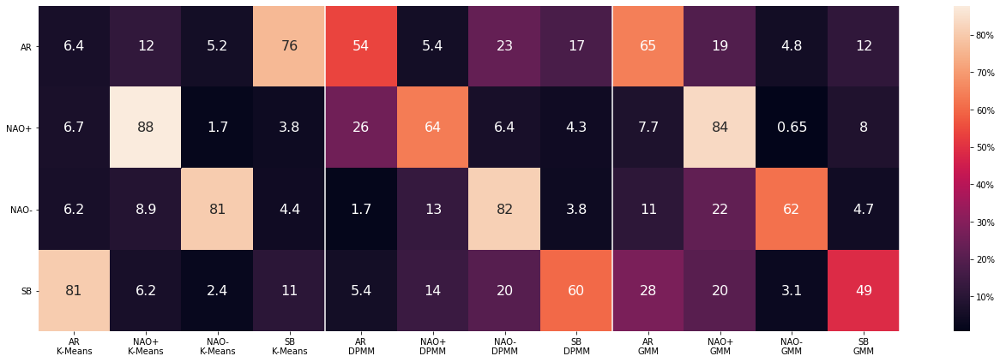

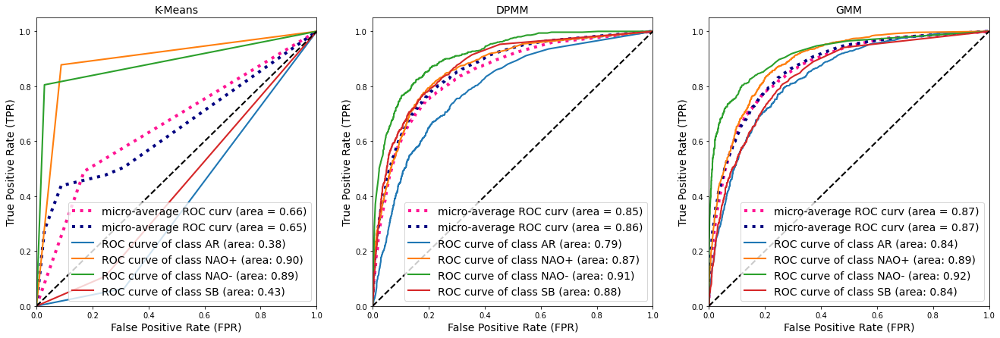

In [17]:
get_conf_matrix(predictions, targets.xs('Distance', level = 0, axis = 1),  savefig = "../imgs/conf_matrix_predictionsPCA.png")
get_multiclass_roc(predictions, targets.xs('Distance', level = 0, axis = 1), savefig = "../imgs/roc_predictionsPCA.png")

#### Targets unique

In [169]:
targets = pd.read_csv("../../dataset/targets_unique.csv", index_col = 0, header = 0)
targets.index = pd.to_datetime(targets.index)
targets.drop(['Step'], axis = 1, inplace = True)
targets = targets[np.logical_and(np.argmax(targets.values, axis = 1) != 4,
                                      targets.index.month.isin([1,2,12]))]
targets.drop(['Unknown'], axis = 1, inplace = True)

In [170]:
predictions = pd.read_csv("../predictions/predictions_VAE.csv", index_col = 0, header = [0,1])
predictions.index = pd.to_datetime(predictions.index)
predictions = predictions.loc[targets.index].copy()
predictions = predictions.reindex(sorted(predictions.columns, key = lambda x: (x[0], x[1])), axis=1)

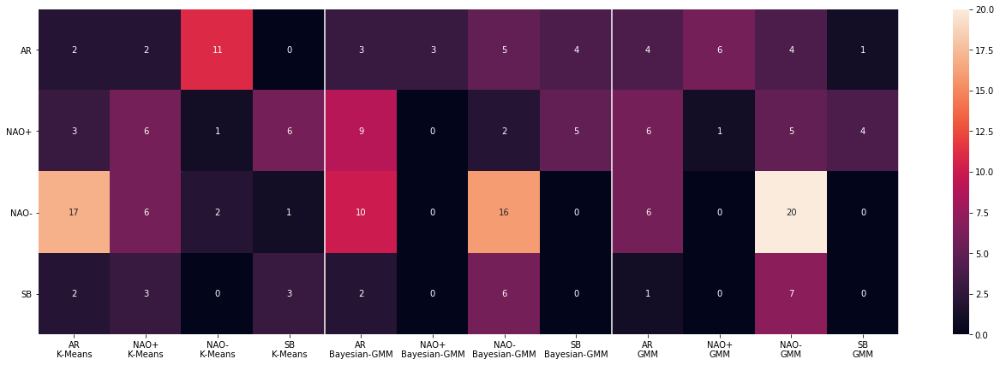

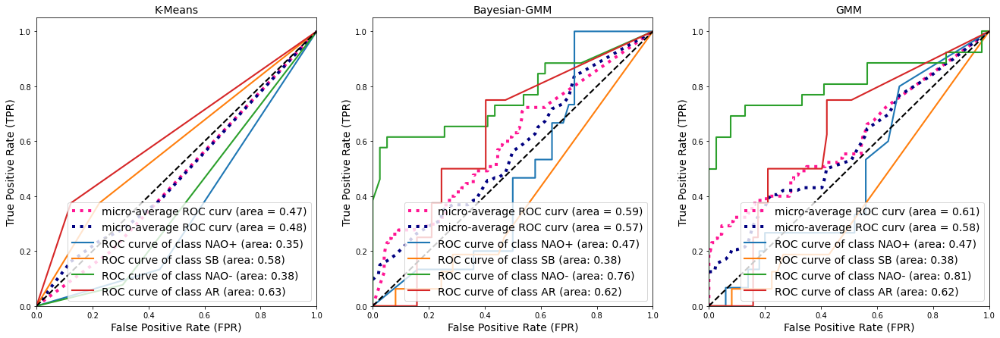

In [172]:
get_conf_matrix(predictions, -targets)
get_multiclass_roc(predictions, -targets)

In [173]:
predictions = pd.read_csv("../predictions/predictions_weighted_new.csv", index_col = 0, header = [0,1])
predictions.index = pd.to_datetime(predictions.index)
predictions = predictions.loc[targets.index].copy()
predictions = predictions.reindex(sorted(predictions.columns, key = lambda x: (x[0], x[1])), axis=1)

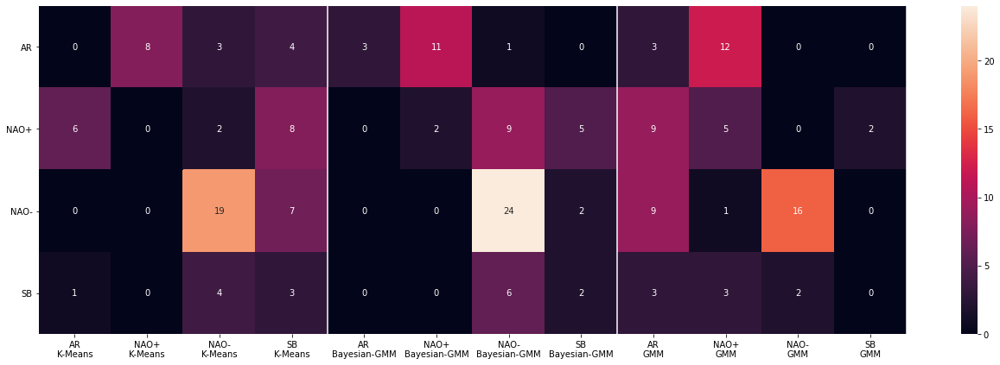

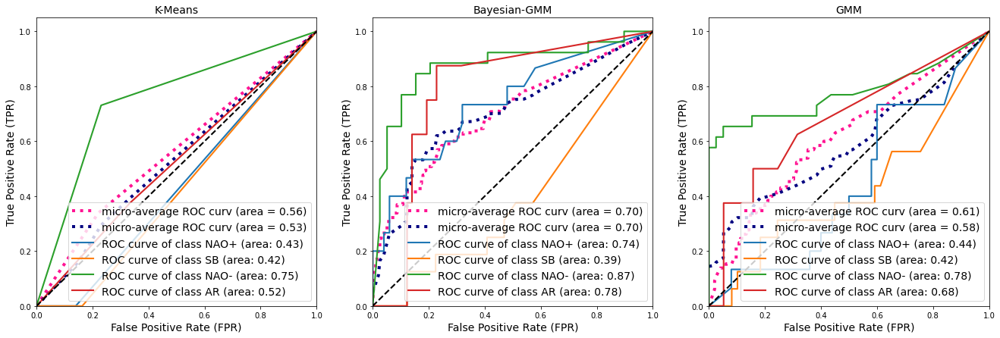

In [174]:
get_conf_matrix(predictions, -targets)
get_multiclass_roc(predictions, -targets)

# Add

In [296]:
synthetic_df = pd.read_csv("../src/dashboard/synthetic.csv", index_col = [0,1], parse_dates = True)
synthetic_df = synthetic_df.loc[synthetic_df.index.get_level_values(1).month.isin([1,2,12])]

In [297]:
predictions = pd.read_csv(f'W:/UK/Research/Private/WEATHER/STAGE_ABALDO/scripts/predictions/predictions_VAE.csv',
                              header=[0, 1], index_col=0)

for method in predictions.columns.get_level_values(0).unique():
    predictions[(method, 'Prediction')] = predictions.xs(method, axis=1).apply(
        lambda x: predictions.xs(method, axis=1).columns[np.argmax(x)], axis=1)
predictions.index = pd.to_datetime(predictions.index, dayfirst=True)

In [298]:
model = 'GMM'
variables = ['Wind Load Factor', 'Solar Load Factor', 'Load', 'Temperature']
countries = ['GE','FR','UK','ES','IT','BE','NE','EU-7']

In [311]:
distributions = dict()
moments = dict()
for month in [1,2,12]:
    distributions[month] = dict()
    moments[month] = dict()
    for variable in variables:
        distributions[month][variable] = dict()
        moments[month][variable] = dict()
        for country in countries:
            if country != 'EU-7':
                variable_df = synthetic_df.xs(country, level = 0).loc[:,variable]
            else:
                if variable == 'Load':
                    variable_df = synthetic_df.loc[:,variable].groupby(synthetic_df.index.get_level_values(1)).sum()
                else:
                    variable_df = synthetic_df.loc[:,variable].groupby(synthetic_df.index.get_level_values(1)).mean()
            
            variable_df = variable_df.loc[variable_df.index.month == month]
            variable_df.dropna(inplace = True)
            distributions_regimes = {
                regime: scipy.stats.gaussian_kde(variable_df.loc[predictions.index.intersection(variable_df.index)],
                                                 weights=predictions.loc[predictions.index.intersection(variable_df.index), (model, regime)].values,
                                                 bw_method=.1)
                for regime in sorted(['AR', 'NAO+', 'NAO-', 'SB'])}

            points = np.linspace(variable_df.min(), variable_df.max(), 1000)
            normal = variable_df.mean()

            means = {k: sum(points * v.pdf(points)) / sum(v.pdf(points))
                     for k, v in distributions_regimes.items()}

            stds = {k: np.sqrt(np.sum([(p - v)**2 for p in points])/len(points))
                         for k, v in means.items()}

            distributions[month][variable][country] = {k: v.pdf(points) / sum(v.pdf(points)) for k,v in distributions_regimes.items()}
            moments[month][variable][country] = dict(mean = means, std = stds)

In [312]:
distributions = {(month, var, country, regime): v
                 for month, sub in distributions.items()
                 for var, subsub in sub.items()
                 for country, subsubsub in subsub.items()
                 for regime, v in subsubsub.items()}

In [313]:
pd.DataFrame.from_dict(distributions).to_csv("distributions_4regimes_EU7.csv")

In [314]:
moments = {var : {(month, country, regime, moment): v
                  for country, subsubsub in subsub.items()
                  for regime, subsubsubsub in subsubsub.items()
                  for moment, v in subsubsubsub.items()}
           for month, sub in moments.items()  for var, subsub in sub.items()}

In [315]:
moments

{'Wind Load Factor': {(12, 'GE', 'mean', 'AR'): 0.4865917594029488,
  (12, 'GE', 'mean', 'NAO+'): 0.5186079085881933,
  (12, 'GE', 'mean', 'NAO-'): 0.40445594509476157,
  (12, 'GE', 'mean', 'SB'): 0.2996469028906154,
  (12, 'GE', 'std', 'AR'): 0.28081808227236915,
  (12, 'GE', 'std', 'NAO+'): 0.2807288545697373,
  (12, 'GE', 'std', 'NAO-'): 0.29725965593842363,
  (12, 'GE', 'std', 'SB'): 0.3465328258590121,
  (12, 'FR', 'mean', 'AR'): 0.3856648278166453,
  (12, 'FR', 'mean', 'NAO+'): 0.4421831949864163,
  (12, 'FR', 'mean', 'NAO-'): 0.3642455233170562,
  (12, 'FR', 'mean', 'SB'): 0.24680084990373685,
  (12, 'FR', 'std', 'AR'): 0.26358326681048105,
  (12, 'FR', 'std', 'NAO+'): 0.2557401735499127,
  (12, 'FR', 'std', 'NAO-'): 0.26960922022740474,
  (12, 'FR', 'std', 'SB'): 0.32651983295432346,
  (12, 'UK', 'mean', 'AR'): 0.5288610860296152,
  (12, 'UK', 'mean', 'NAO+'): 0.5719888022355497,
  (12, 'UK', 'mean', 'NAO-'): 0.44897159901412836,
  (12, 'UK', 'mean', 'SB'): 0.42370976704441526,

In [316]:
pd.DataFrame.from_dict(moments).to_csv("moments_4regimes_EU7.csv")

# Sub

In [317]:
def compare_distribution_by_regime(df, predictions, model, col, **kwargs):
    fig, axs = plt.subplots(2, 2, figsize=(30, 30), sharey = 'col', sharex = 'col')
    if not hasattr(axs,"flat"):
        axs = np.array([axs])
    for i, (regime, ax) in enumerate(zip(['AR','NAO+','NAO-','SB'], axs.flat)):
        weights = predictions.loc[df.index, (model, regime)]
        for thresh in [None, 0.5, 0.7, 0.9, 0.95, 0.97]:
            if thresh is not None:
                weights_threshed = weights[weights>thresh]
            else:
                weights_threshed = weights
            
            sns.kdeplot(x=df.loc[weights_threshed.index, col], weights=weights_threshed.values,
                        label="Thresh: {}, Nr. Days: {}".format(thresh if thresh is not None else "None", int(sum(weights_threshed))),
                        ax=ax, bw_adjust=kwargs['bw_adjust'] if 'bw_adjust' in kwargs else 1,
                        linewidth = 3)
            '''
            for j, regime in enumerate(sorted(df['Regime'].unique())):
                preds = predictions.xs(model, level = 0, axis = 1)
                idx_hard = preds[preds['Prediction'] == regime].index

                sns.kdeplot(x=df.loc[idx_hard.intersection(df.index), col], label = regime + " hard", ax = ax, linestyle='--')
            '''

        ax.set_xlabel(col, fontsize = 22, fontweight = 'bold')
        ax.set_ylabel("Density", fontsize = 22, fontweight = 'bold')
        ax.set_title(regime, fontsize = 26, fontweight = 'bold')
        ax.axvline(df[col].mean(), linestyle='--', color='k', label = 'Normal')
        ax.legend(fontsize = 26)
    fig.tight_layout()
    plt.subplots_adjust(wspace = 0, hspace = 0)
    plt.show()
    
    
def create_comparison_distributions(df, predictions, countries, variables, threshs, model = 'GMM'):
    regimes = ['AR','NAO+','NAO-','SB']
    comparisons_mean = pd.DataFrame(
                index = pd.MultiIndex.from_tuples(itertools.product(countries, threshs)),
                columns = pd.MultiIndex.from_tuples(itertools.product(variables,regimes)))
    
    comparisons_std = pd.DataFrame(
                index = pd.MultiIndex.from_tuples(itertools.product(countries, threshs)),
                columns = pd.MultiIndex.from_tuples(itertools.product(variables,regimes)))
    
    
    days = pd.DataFrame(index = threshs, columns = regimes)
    
    predictions = predictions.xs(model, level = 0, axis = 1).drop('Prediction', axis = 1)
    predictions = predictions.reindex(columns = sorted(predictions.columns))
    for thresh in threshs:
        for regime in regimes:
            weights = predictions.loc[:, regime]
            days.loc[thresh, regime] = int(sum(weights[weights >= thresh]))
    
    for country in countries:
        country_df = synthetic_df.xs(country, level = 0)
        for variable in variables:
            variable_df = country_df.loc[:, variable]
            points = np.linspace(variable_df.min(), variable_df.max(), 1000)
            for regime in regimes:
                weights = predictions.loc[:, regime]
                for thresh in threshs:
                    weights_t = weights[weights >= thresh]
                    index = variable_df.index.intersection(weights_t.index)
                    distribution = scipy.stats.gaussian_kde(variable_df.loc[index], weights = weights_t.loc[index])
                    mean = sum(points * distribution.pdf(points)) / sum(distribution.pdf(points))
                    std = np.sqrt(np.sum([(p - mean)**2 for p in points])/len(points))
                    
                    comparisons_mean.loc[(country, thresh), (variable, regime)] = mean
                    comparisons_std.loc[(country, thresh), (variable, regime)] = std
    return comparisons_mean, comparisons_std, days
                

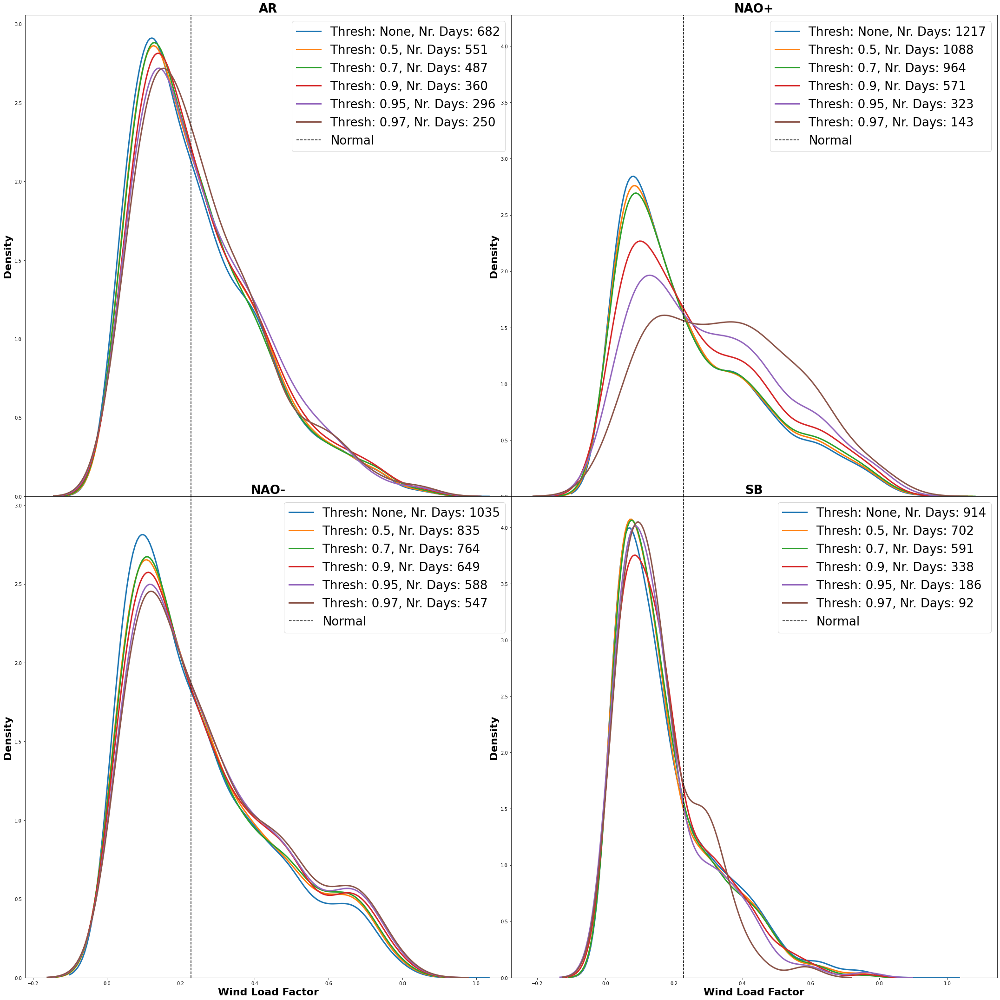

In [318]:
compare_distribution_by_regime(synthetic_df.xs('ES', level = 0), predictions, model, 'Wind Load Factor')

In [319]:
mean, std, days = create_comparison_distributions(synthetic_df, predictions, ['GE','FR','UK','ES'],
                                ['Wind Load Factor', 'Solar Load Factor', 'Load', 'Temperature'],
                                [0., .3, .5, .7, .9, .95, .97])

In [150]:
mean.to_csv('means.csv')
std.to_csv('stds.csv')
days.to_csv('days.csv')

In [327]:
pred_t = predictions.xs('GMM',level=0, axis=1).drop('Prediction', axis = 1)
pred_t = pred_t[pred_t.max(1) < 0.7].reindex(columns = sorted(pred_t.columns))
pred_t

Regime,AR,NAO+,NAO-,SB
1979-01-09,0.389,0.556,0.003,0.052
1979-01-10,0.485,0.472,0.000,0.042
1979-01-31,0.136,0.188,0.671,0.005
1979-02-01,0.067,0.615,0.311,0.007
1979-02-14,0.002,0.204,0.638,0.156
...,...,...,...,...
2021-02-16,0.000,0.678,0.084,0.238
2021-02-18,0.000,0.529,0.093,0.378
2021-02-19,0.000,0.584,0.079,0.337
2021-02-20,0.000,0.428,0.100,0.472


In [396]:
def get_pairings(predictions, thresh):
    pairings = dict()
    def get_major_regimes(x):
        row = x.sort_values(ascending = False)
        index = row.index.values.tolist()
        key = " ".join(sorted(index[:2] if sum(row[:2]) >= thresh else index[:3]))
        if key in pairings:
            pairings[key].append(row.name.strftime("%Y-%m-%d"))
        else:
            pairings[key] = [row.name.strftime("%Y-%m-%d")]
        return x
    predictions = predictions.apply(get_major_regimes, axis = 1)
    return pairings

def get_days_extra_reg(predictions):
    return pd.DataFrame.from_dict(
    {thresh: {k: int(len(v)) for k,v in get_pairings(predictions, thresh).items()} for thresh in [.5, .6, .7, .8]},
    orient = 'index'
    )

def get_means_extra_reg(df,predictions, regimes, col, thresh, scale = True):
    extra_regimes = {k: v for k,v in get_pairings(predictions, thresh).items()}
    extra_means = pd.DataFrame(columns = regimes,
                          index = df.index.get_level_values(0).unique())
    #for thresh, snap in extra_regimes.items():
    for extra_reg, dates in extra_regimes.items():
        if extra_reg in regimes:
            for country in extra_means.index.unique():
                country_df = df.xs(country, level = 0)
                normal = country_df.loc[:, col].mean()
                if scale:
                    extra_means.loc[country, extra_reg] = (country_df.loc[dates, col].mean() - normal)/normal
                else:
                    extra_means.loc[country, extra_reg] = country_df.loc[dates, col].mean()
    extra_means.to_csv(f"extra_regimes_{col}.csv")
    return extra_means

In [378]:
days = get_days_extra_reg(pred_t)
days.dropna(how='any', axis = 1).to_csv("extra_regimes_days.csv")

In [392]:
get_means_extra_reg(synthetic_df, pred_t, days.dropna(how = 'any', axis = 1).columns, 'Wind Load Factor', .7)

,AR NAO+,NAO+ NAO-,NAO- SB,AR SB,NAO+ SB,AR NAO-
Country,,,,,,
BE,0.222076,0.0553629,-0.179062,-0.290064,-0.00281374,-0.0875224
ES,0.099971,0.159389,-0.238711,0.0442647,-0.298899,0.00515606
FR,0.230372,0.0568641,-0.271932,-0.233502,-0.213492,-0.0336944
GE,0.268641,-0.0327338,-0.238951,-0.146739,-0.0729978,-0.039354
IT,0.138857,-0.113654,-0.100546,0.245911,-0.331517,-0.0164782
NE,0.17516,0.037713,-0.104098,-0.18603,0.0604351,-0.0930859
UK,0.123711,0.0526624,-0.0799631,-0.0985848,0.154639,-0.0819711


In [393]:
get_means_extra_reg(synthetic_df, pred_t, days.dropna(how = 'any', axis = 1).columns, 'Solar Load Factor', .7)

,AR NAO+,NAO+ NAO-,NAO- SB,AR SB,NAO+ SB,AR NAO-
Country,,,,,,
BE,-0.00341577,-0.128449,0.17238,0.0246721,0.00901843,-0.0476973
ES,0.00686708,-0.0738609,0.0228359,0.12505,0.0624584,-0.0717808
FR,-0.126538,-0.0805101,0.0723313,0.0432078,0.062941,0.0057599
GE,-0.114501,-0.066691,0.0995369,-0.0837018,0.0729731,-0.043874
IT,-0.0693372,-0.0480022,0.0260618,0.0512635,0.0756154,-0.0541748
NE,0.0168763,-0.116917,0.0822405,0.00722234,-0.00767356,-0.0622896
UK,0.135709,-0.0822022,-0.106262,-0.0409675,-0.178026,0.0159686


In [398]:
get_means_extra_reg(synthetic_df, pred_t, days.dropna(how = 'any', axis = 1).columns, 'Load', .7, scale = False)

,AR NAO+,NAO+ NAO-,NAO- SB,AR SB,NAO+ SB,AR NAO-
Country,,,,,,
BE,10.687,10.4828,10.638,10.7283,10.4208,10.7571
ES,30.2843,29.4073,29.6271,30.3592,29.434,30.0768
FR,69.5159,67.5534,69.8128,71.057,67.2243,70.7412
GE,63.5504,62.4044,63.36,63.4574,61.9048,64.3122
IT,36.848,35.7489,36.0265,36.392,35.6235,36.5333
NE,13.7475,13.6439,13.7276,13.6831,13.4731,13.7624
UK,44.6468,44.1565,44.1027,44.075,42.758,44.9121


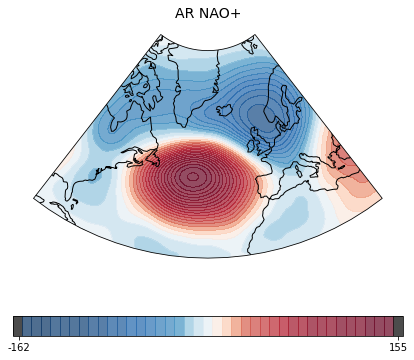

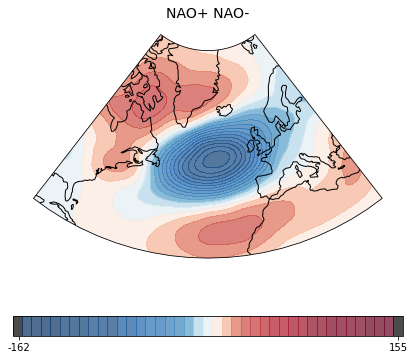

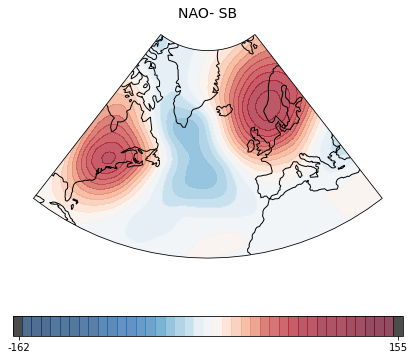

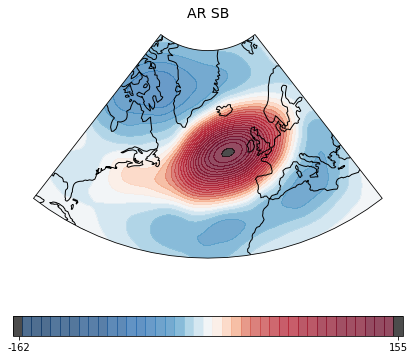

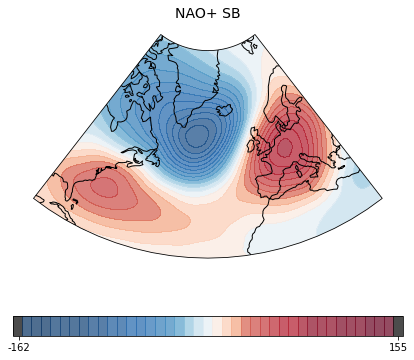

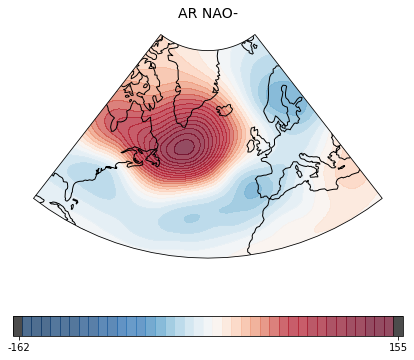

In [295]:
for k,v in pairings.items():
    plot_gph(dt.sel(time = np.array(v, dtype = np.datetime64)).mean("time").to_array().squeeze(), title = k,
             vmin = dt.to_array().quantile(.05).values, vmax = dt.to_array().quantile(.95).values, savefig = k+".png")

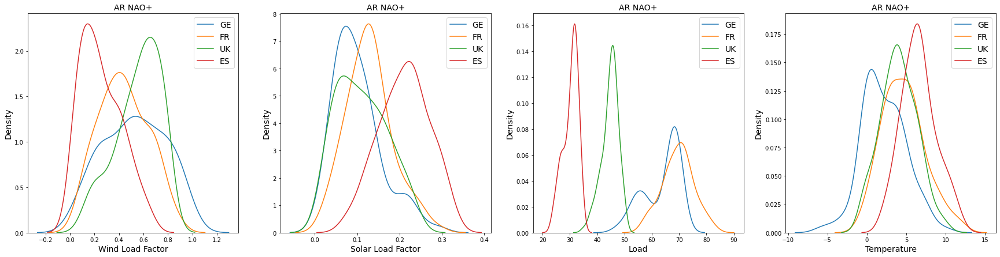

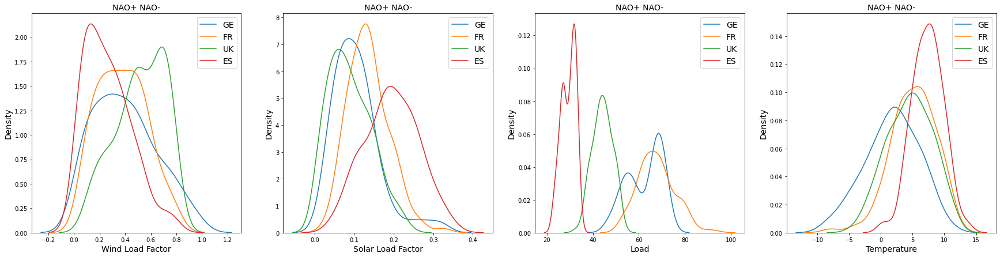

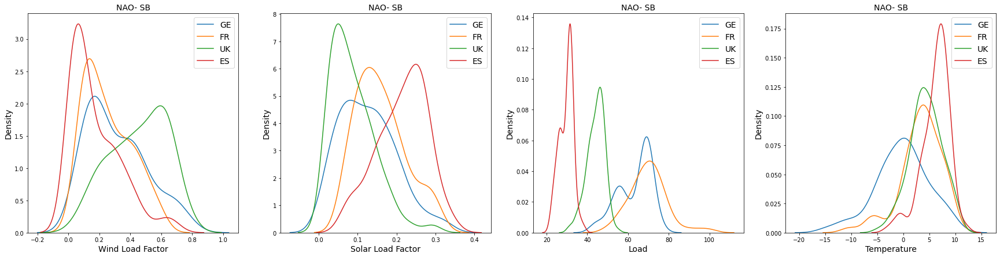

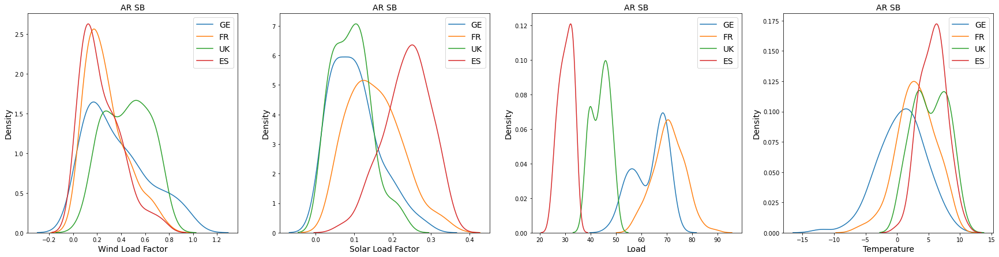

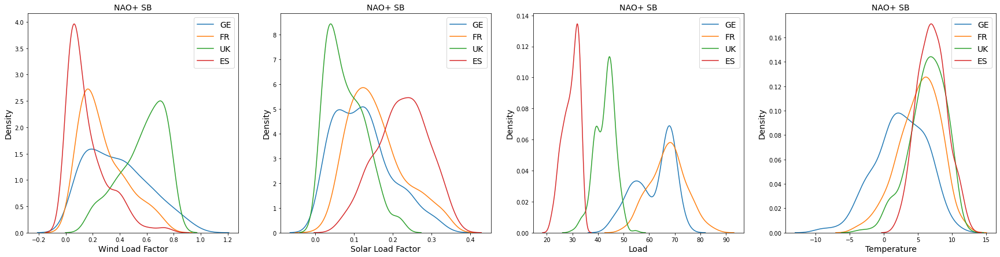

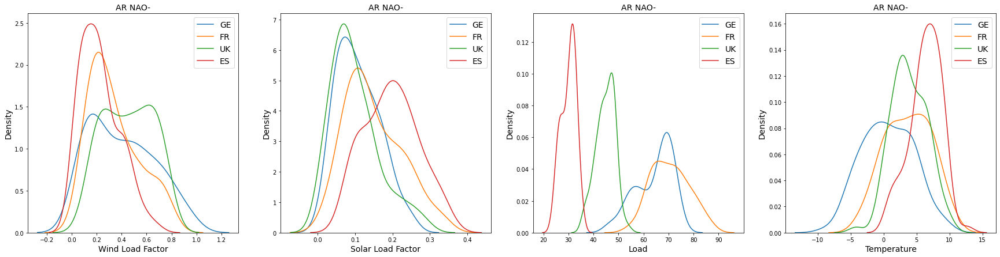

In [286]:
for k,v in pairings.items():
    fig, axs = plt.subplots(1,4, figsize = (30,7), sharex = 'col')
    weights = predictions.loc[v, ('GMM', k.split(" "))].sum(1)
    for ax,variable in zip(axs, ['Wind Load Factor', 'Solar Load Factor', 'Load', 'Temperature']):
        for country in ['GE','FR','UK','ES']:
            sns.kdeplot(synthetic_df.xs(country, level = 0).loc[v, variable], weights = weights, label = country, ax = ax)
        ax.legend()
        ax.set_title(k)
    plt.savefig(k+"vars.png", bbox_inches='tight')
    plt.show()